# Baseball Salary Estimate with ML

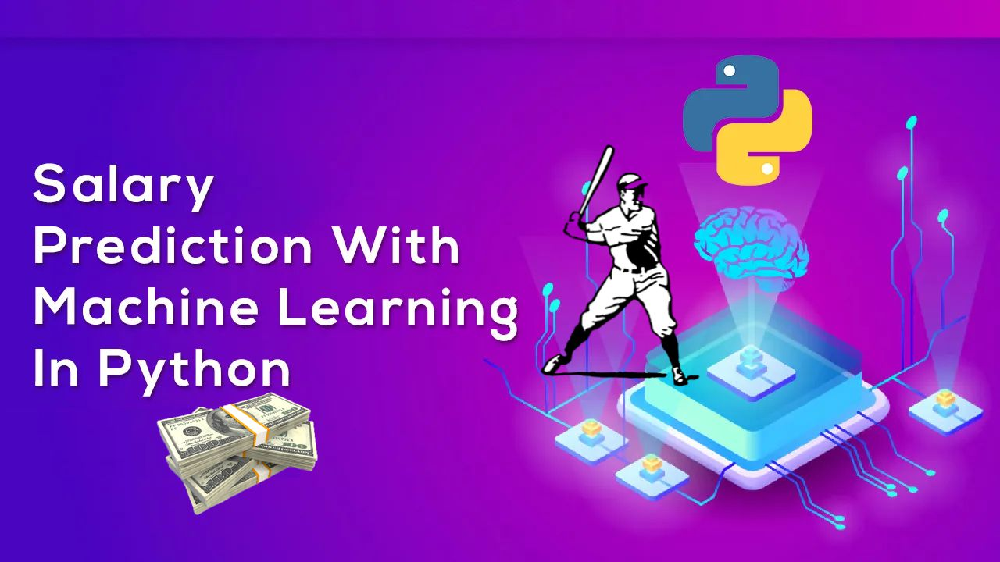

In this project, I will develop a machine learning model that can predict salaries for baseball players. I will perform the necessary data analysis and feature engineering steps before developing the model.

#### Dataset Story:

Salary data originally taken from Sports Illustrated, April 20, 1987. 1986 and career statistics are from the 1987 Baseball Encyclopedia Update, published by Collier Books, Macmillan Publishing Company, New York.

**AtBat:** Number of hits with a baseball bat during the 1986-1987 season<br>
**Hits:** Number of hits in the 1986-1987 season<br>
**HmRun:** Most valuable hits in the 1986-1987 season<br>
**Runs:** The points he earned for his team in the 1986-1987 season<br>
**RBI:** Number of players a batsman had jogged when he hit<br>
**Walks:** Number of mistakes made by the opposing player<br>
**Years:** Player's playing time in major league (years)<br>
**CAtBat:** Number of hits during a player's career<br>
**CHits:** The number of hits the player has made throughout his career<br>
**CHmRun:** The player's most valuable hit during his career<br>
**CRuns:** Points earned by the player during his career<br>
**CRBI:** The number of players the player has made during his career<br>
**CWalks:** Number of mistakes the player has made to the opposing player during their career<br>
**League:** A factor with A and N levels showing the league in which the player played until the end of the season<br>
**Division:** A factor with levels E and W indicating the position played by the player at the end of 1986<br>
**PutOuts:** Helping your teammate in-game<br>
**Assists:** Number of assists made by the player in the 1986-1987 season<br>
**Errors:** Player's number of errors in the 1986-1987 season<br>
**Salary:** The salary of the player in the 1986-1987 season (over thousand)<br>
**NewLeague:** A factor with A and N levels showing the player's league at the start of the 1987 season<br>

## 1. Importing the Libraries and Uploading Dataset

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import missingno as msno
from datetime import date
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.neighbors import LocalOutlierFactor, KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler, scale
from sklearn.impute import KNNImputer

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn import neighbors
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.expand_frame_repr', False)

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_ = pd.read_csv('hitters.csv')

In [3]:
df = df_.copy()
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.000,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.000,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.000,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.500,N


## 2. General Information About Dataset

In [2]:
def gen_info(df, box=True, column="Salary"):
    print(30*"#" + "Shape".center(30) + 30*"#")
    print(df.shape)
    print("\n"+ 30*"#" + "Types".center(30) + 30*"#")
    print(df.dtypes)
    print("\n"+ 30*"#" + "Missing Values".center(30) + 30*"#")
    print(df.isnull().sum())
    print("\n"+ 30*"#" + "Quantiles".center(30) + 30*"#")
    print(df.describe([0.01, 0.05, 0.50, 0.95, 0.99]).T)
    print("\n"+ 30*"#" + "BOX PLOT".center(30) + 30*"#")
    if box == True:
        sns.boxplot(x=df[column])
        print(plt.show())

##############################            Shape             ##############################
(322, 20)

##############################            Types             ##############################
AtBat          int64
Hits           int64
HmRun          int64
Runs           int64
RBI            int64
Walks          int64
Years          int64
CAtBat         int64
CHits          int64
CHmRun         int64
CRuns          int64
CRBI           int64
CWalks         int64
League        object
Division      object
PutOuts        int64
Assists        int64
Errors         int64
Salary       float64
NewLeague     object
dtype: object

##############################        Missing Values        ##############################
AtBat         0
Hits          0
HmRun         0
Runs          0
RBI           0
Walks         0
Years         0
CAtBat        0
CHits         0
CHmRun        0
CRuns         0
CRBI          0
CWalks        0
League        0
Division      0
PutOuts       0
Assists       0
Errors   

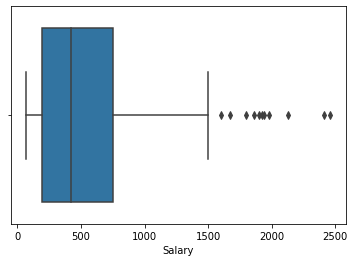

None


In [5]:
gen_info(df)

## 3. Discovery Data Analysis

Starting with capturing numeric and categorical variables

In [6]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    It gives the names of categorical, numerical and categorical but cardinal variables in the data set.
    Note: Categorical variables with numerical appearance are also included in categorical variables.

    Parameters
    ------
        dataframe: dataframe
                The dataframe from which variable names are to be retrieved
        cat_th: int, optional
                threshold value for numeric but categorical variables
        car_th: int, optinal
                threshold value for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                Categorical but cardinal variable list

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 returned lists equals the total number of variables: 
        cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

In [7]:
cat_cols, num_cols, cat_but_car = grab_col_names(df) 

Observations: 322
Variables: 20
cat_cols: 3
num_cols: 17
cat_but_car: 0
num_but_cat: 0


Checking NaN's

In [8]:
for i in df.columns:
    print(i, pd.isna(df[i]).any())

AtBat False
Hits False
HmRun False
Runs False
RBI False
Walks False
Years False
CAtBat False
CHits False
CHmRun False
CRuns False
CRBI False
CWalks False
League False
Division False
PutOuts False
Assists False
Errors False
Salary True
NewLeague False


Salary True > I will dive into this which is our target column

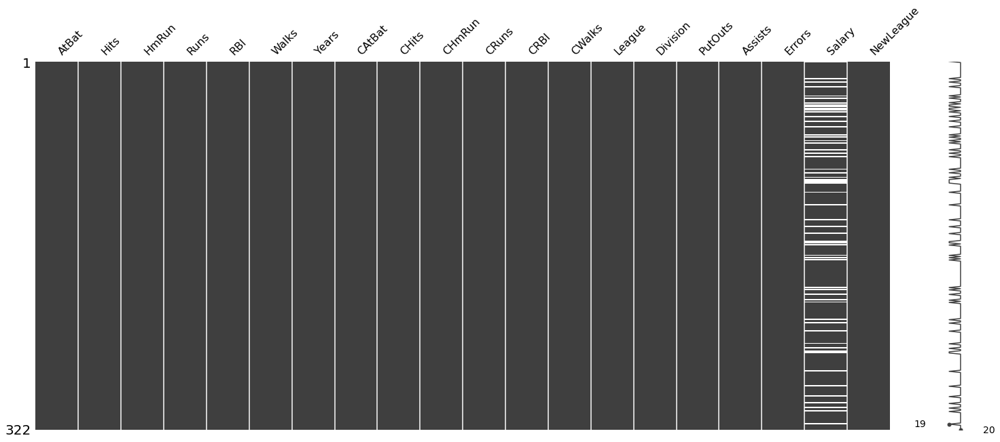

In [9]:
msno.matrix(df)
plt.show(block=True)

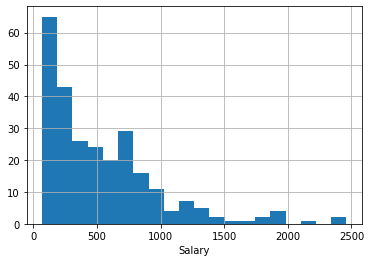

In [10]:
df["Salary"].hist(bins=20)
plt.xlabel("Salary")
plt.show()

In [11]:
df["Salary"].isnull().sum()

59

Since the salary variable is the target variable, instead of filling this 59 value, I will predict it after I create my model.

In [12]:
df[df["Salary"].isnull()]

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
15,183,39,3,20,15,11,3,201,42,3,20,16,11,A,W,118,0,0,NaN,A
18,407,104,6,57,43,65,12,5233,1478,100,643,658,653,A,W,912,88,9,NaN,A
22,22,10,1,4,2,1,6,84,26,2,9,9,3,A,W,812,84,11,NaN,A
30,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,A,W,127,221,7,NaN,A
32,517,141,27,70,87,52,9,3571,994,215,545,652,337,N,W,1378,102,8,NaN,N
36,161,36,0,19,10,17,4,1053,244,3,156,86,107,A,E,70,149,12,NaN,A
38,346,98,5,31,53,30,16,5913,1615,235,784,901,560,A,E,0,0,0,NaN,A
39,241,61,1,34,12,14,1,241,61,1,34,12,14,N,W,166,172,10,NaN,N
41,216,54,0,21,18,15,18,7318,1926,46,796,627,483,N,W,103,84,5,NaN,N


I will drop NaN values

In [13]:
df_salary = df[df["Salary"].isnull()]
df_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
15,183,39,3,20,15,11,3,201,42,3,20,16,11,A,W,118,0,0,NaN,A
18,407,104,6,57,43,65,12,5233,1478,100,643,658,653,A,W,912,88,9,NaN,A
22,22,10,1,4,2,1,6,84,26,2,9,9,3,A,W,812,84,11,NaN,A
30,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,A,W,127,221,7,NaN,A


In [14]:
df_salary.reset_index(inplace=True)
df_salary.head() 

,index,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,15,183,39,3,20,15,11,3,201,42,3,20,16,11,A,W,118,0,0,NaN,A
2,18,407,104,6,57,43,65,12,5233,1478,100,643,658,653,A,W,912,88,9,NaN,A
3,22,22,10,1,4,2,1,6,84,26,2,9,9,3,A,W,812,84,11,NaN,A
4,30,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,A,W,127,221,7,NaN,A


In [15]:
df = df.dropna()
df.shape

(263, 20)

In [16]:
def plot_numerical_col(dataframe, numerical_col):
    dataframe[numerical_col].hist(bins=20)
    plt.xlabel(numerical_col)
    plt.show(block=True)


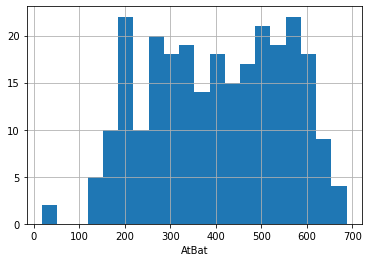

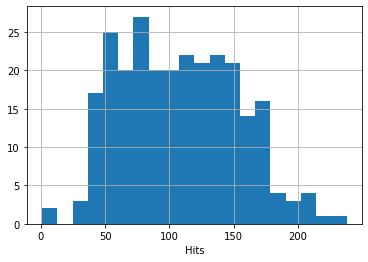

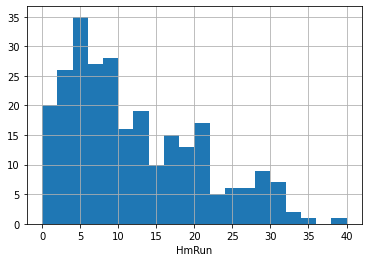

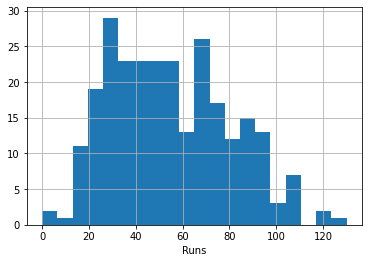

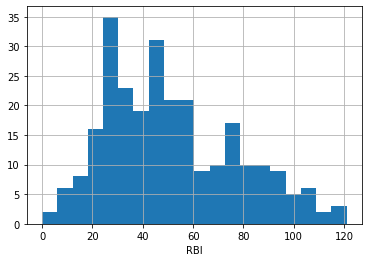

...

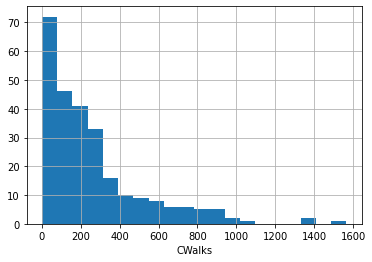

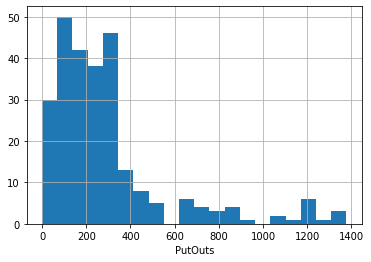

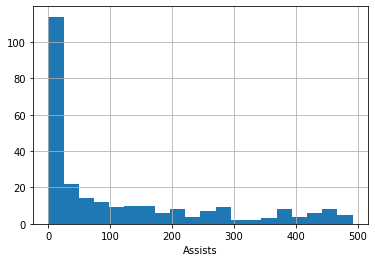

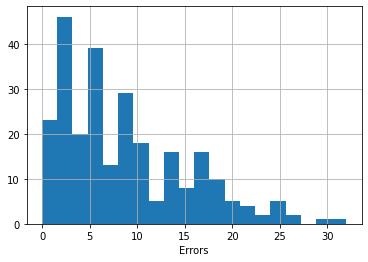

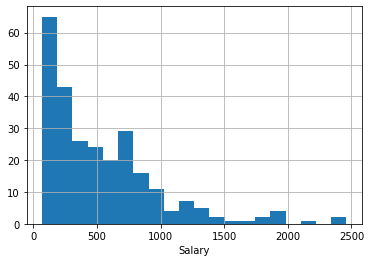

In [17]:
for col in num_cols:
    plot_numerical_col(df, col)

A    139
N    124
Name: League, dtype: int64


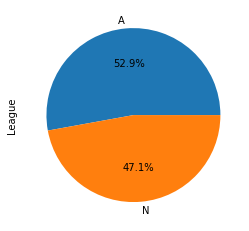

W    134
E    129
Name: Division, dtype: int64


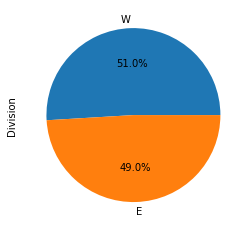

A    141
N    122
Name: NewLeague, dtype: int64


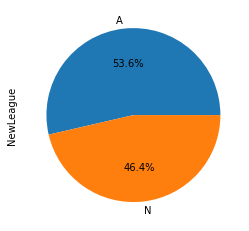

In [18]:
for i in cat_cols:
    print(df[i].value_counts())
    df[i].value_counts().plot(kind='pie',y='points',autopct='%1.1f%%')
    plt.show();

## 4. Outlier Analysis

First, I will define functions for finding outliers.

In [19]:
def outlier_thresholds(dataframe, col_name, q1=0.10, q3=0.90):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [20]:
for col in num_cols:
    print(col, check_outlier(df, col))

AtBat False
Hits False
HmRun False
Runs False
RBI False
Walks False
Years False
CAtBat False
CHits True
CHmRun True
CRuns True
CRBI False
CWalks True
PutOuts False
Assists False
Errors False
Salary False


In [21]:
df.describe(np.arange(1,10)/10).T # we have 4 columns that have outliers

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
AtBat,263.000,403.643,147.307,19.000,205.600,257.400,311.600,350.400,413.000,464.400,508.200,554.600,591.000,687.000
Hits,263.000,107.829,45.125,1.000,52.000,66.800,77.000,92.000,103.000,120.000,136.000,148.600,168.000,238.000
HmRun,263.000,11.620,8.757,0.000,2.000,4.000,5.000,7.000,9.000,12.000,16.000,20.000,25.000,40.000
Runs,263.000,54.745,25.540,0.000,24.000,31.000,37.000,45.000,52.000,61.000,68.400,77.600,90.000,130.000
RBI,263.000,51.487,25.883,0.000,23.000,28.400,33.600,42.000,47.000,53.200,61.400,75.600,88.000,121.000
Walks,263.000,41.114,21.718,0.000,16.000,21.000,26.600,32.000,37.000,43.000,53.000,62.000,71.800,105.000
Years,263.000,7.312,4.794,1.000,2.000,3.000,4.000,5.000,6.000,7.000,9.000,12.000,14.000,24.000
CAtBat,263.000,2657.544,2286.583,19.000,413.600,680.800,993.400,1488.200,1931.000,2696.600,3269.400,4406.800,6098.000,14053.000
CHits,263.000,722.186,648.200,4.000,102.200,170.800,257.800,389.000,516.000,717.600,892.000,1209.000,1658.000,4256.000
CHmRun,263.000,69.240,82.198,0.000,5.000,12.000,18.200,29.800,40.000,55.200,77.400,105.800,174.800,548.000


In [22]:
replace_with_thresholds(df, "CHits")
replace_with_thresholds(df, "CHmRun")
replace_with_thresholds(df, "CRuns")
replace_with_thresholds(df, "CWalks")
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AtBat,263.000,403.643,147.307,19.000,282.500,413.000,526.000,687.000
Hits,263.000,107.829,45.125,1.000,71.500,103.000,141.500,238.000
HmRun,263.000,11.620,8.757,0.000,5.000,9.000,18.000,40.000
Runs,263.000,54.745,25.540,0.000,33.500,52.000,73.000,130.000
RBI,263.000,51.487,25.883,0.000,30.000,47.000,71.000,121.000
Walks,263.000,41.114,21.718,0.000,23.000,37.000,57.000,105.000
Years,263.000,7.312,4.794,1.000,4.000,6.000,10.000,24.000
CAtBat,263.000,2657.544,2286.583,19.000,842.500,1931.000,3890.500,14053.000
CHits,263.000,721.181,642.883,4.000,212.000,516.000,1054.000,3991.700
CHmRun,263.000,68.789,79.855,0.000,15.000,40.000,92.500,429.500


In [23]:
for col in num_cols:
    print(col, check_outlier(df, col))

AtBat False
Hits False
HmRun False
Runs False
RBI False
Walks False
Years False
CAtBat False
CHits False
CHmRun False
CRuns False
CRBI False
CWalks False
PutOuts False
Assists False
Errors False
Salary False


Ok now we may not have an outlier at least with this method, but I want to apply the LOF method too in order to see if we have a more outlier.

In [24]:
clf = LocalOutlierFactor(n_neighbors=20)
clf.fit_predict(df[num_cols])

array([ 1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
       -1,  1,  1,  1,  1

In [25]:
df_scores = clf.negative_outlier_factor_

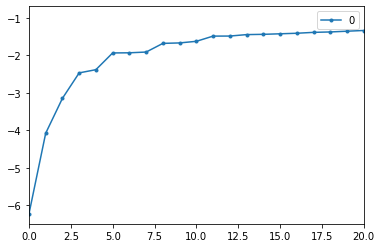

In [26]:
scores = pd.DataFrame(np.sort(df_scores))
scores.plot(stacked=True, xlim=[0, 20], style='.-')
plt.show(block=True)

In [27]:
th = np.sort(df_scores)[5] # I choose 5 because in 5 there is the biggest change in the graph

In [28]:
df[df_scores < th]

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
217,20,1,0,0,0,0,2,41,9.000,2.000,6.000,7,4.000,N,E,78,220,6,2127.333,N
236,237,52,0,15,25,30,24,14053,3991.700,160.000,2121.300,1314,1553.700,N,W,523,43,6,750.000,N
274,522,140,16,73,77,60,4,730,185.000,22.000,93.000,106,86.000,N,E,1320,166,17,200.000,N
295,19,4,1,2,3,1,1,19,4.000,1.000,2.000,3,1.000,N,W,692,70,8,920.000,A
315,593,172,22,82,100,57,1,593,172.000,22.000,82.000,100,57.000,A,W,1222,139,15,165.000,A


In [29]:
df[df_scores < th].drop(axis=0, labels=df[df_scores < th].index) # dropping LOF's outliers in the dataframe
df.shape

(263, 20)

In [30]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AtBat,263.000,403.643,147.307,19.000,282.500,413.000,526.000,687.000
Hits,263.000,107.829,45.125,1.000,71.500,103.000,141.500,238.000
HmRun,263.000,11.620,8.757,0.000,5.000,9.000,18.000,40.000
Runs,263.000,54.745,25.540,0.000,33.500,52.000,73.000,130.000
RBI,263.000,51.487,25.883,0.000,30.000,47.000,71.000,121.000
Walks,263.000,41.114,21.718,0.000,23.000,37.000,57.000,105.000
Years,263.000,7.312,4.794,1.000,4.000,6.000,10.000,24.000
CAtBat,263.000,2657.544,2286.583,19.000,842.500,1931.000,3890.500,14053.000
CHits,263.000,721.181,642.883,4.000,212.000,516.000,1054.000,3991.700
CHmRun,263.000,68.789,79.855,0.000,15.000,40.000,92.500,429.500


## 4. Feature Engineering

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 263 entries, 1 to 321
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AtBat      263 non-null    int64  
 1   Hits       263 non-null    int64  
 2   HmRun      263 non-null    int64  
 3   Runs       263 non-null    int64  
 4   RBI        263 non-null    int64  
 5   Walks      263 non-null    int64  
 6   Years      263 non-null    int64  
 7   CAtBat     263 non-null    int64  
 8   CHits      263 non-null    float64
 9   CHmRun     263 non-null    float64
 10  CRuns      263 non-null    float64
 11  CRBI       263 non-null    int64  
 12  CWalks     263 non-null    float64
 13  League     263 non-null    object 
 14  Division   263 non-null    object 
 15  PutOuts    263 non-null    int64  
 16  Assists    263 non-null    int64  
 17  Errors     263 non-null    int64  
 18  Salary     263 non-null    float64
 19  NewLeague  263 non-null    object 
dtypes: float64

In [32]:
df.nunique()

AtBat        209
Hits         130
HmRun         35
Runs          92
RBI           94
Walks         87
Years         21
CAtBat       257
CHits        241
CHmRun       129
CRuns        226
CRBI         226
CWalks       207
League         2
Division       2
PutOuts      199
Assists      145
Errors        29
Salary       150
NewLeague      2
dtype: int64

Our object columns have only 2 unique values. Lets make them 1, 0 numeric columns

In [33]:
lbe=LabelEncoder()

In [34]:
df['League']=lbe.fit_transform(df['League'])
df['Division']=lbe.fit_transform(df['Division'])
df['NewLeague']=lbe.fit_transform(df['NewLeague'])
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
1,315,81,7,24,38,39,14,3449,835.000,69.000,321.000,414,375.000,1,1,632,43,10,475.000,1
2,479,130,18,66,72,76,3,1624,457.000,63.000,224.000,266,263.000,0,1,880,82,14,480.000,0
3,496,141,20,65,78,37,11,5628,1575.000,225.000,828.000,838,354.000,1,0,200,11,3,500.000,1
4,321,87,10,39,42,30,2,396,101.000,12.000,48.000,46,33.000,1,0,805,40,4,91.500,1
5,594,169,4,74,51,35,11,4408,1133.000,19.000,501.000,336,194.000,0,1,282,421,25,750.000,0


In [35]:
df.info() # now we have numerical columns only

<class 'pandas.core.frame.DataFrame'>
Int64Index: 263 entries, 1 to 321
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AtBat      263 non-null    int64  
 1   Hits       263 non-null    int64  
 2   HmRun      263 non-null    int64  
 3   Runs       263 non-null    int64  
 4   RBI        263 non-null    int64  
 5   Walks      263 non-null    int64  
 6   Years      263 non-null    int64  
 7   CAtBat     263 non-null    int64  
 8   CHits      263 non-null    float64
 9   CHmRun     263 non-null    float64
 10  CRuns      263 non-null    float64
 11  CRBI       263 non-null    int64  
 12  CWalks     263 non-null    float64
 13  League     263 non-null    int64  
 14  Division   263 non-null    int64  
 15  PutOuts    263 non-null    int64  
 16  Assists    263 non-null    int64  
 17  Errors     263 non-null    int64  
 18  Salary     263 non-null    float64
 19  NewLeague  263 non-null    int64  
dtypes: float64

### 6.1 Categorical Columns

In [36]:
df_x = df[num_cols].drop("Salary", axis = 1)
df_x.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors
1,315,81,7,24,38,39,14,3449,835.000,69.000,321.000,414,375.000,632,43,10
2,479,130,18,66,72,76,3,1624,457.000,63.000,224.000,266,263.000,880,82,14
3,496,141,20,65,78,37,11,5628,1575.000,225.000,828.000,838,354.000,200,11,3
4,321,87,10,39,42,30,2,396,101.000,12.000,48.000,46,33.000,805,40,4
5,594,169,4,74,51,35,11,4408,1133.000,19.000,501.000,336,194.000,282,421,25


                   Salary   AtBat
Categorical_AtBat                
AtBat_Q1          320.995 210.758
AtBat_Q2          398.139 344.182
AtBat_Q3          643.304 472.831
AtBat_Q4          782.893 587.848



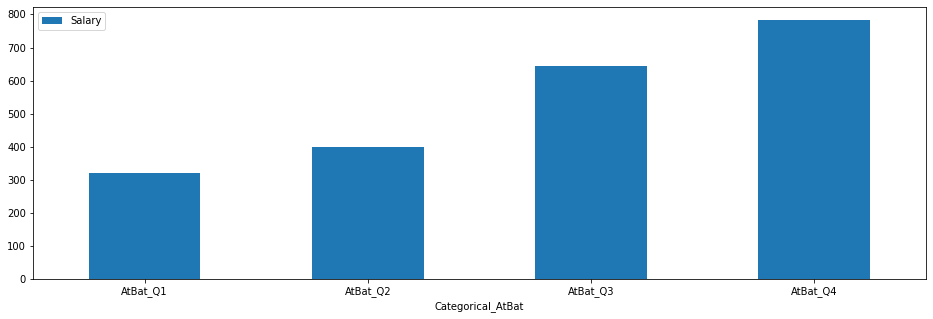

                  Salary    Hits
Categorical_Hits                
Hits_Q1          321.374  52.530
Hits_Q2          367.457  87.621
Hits_Q3          596.899 124.538
Hits_Q4          858.898 166.879



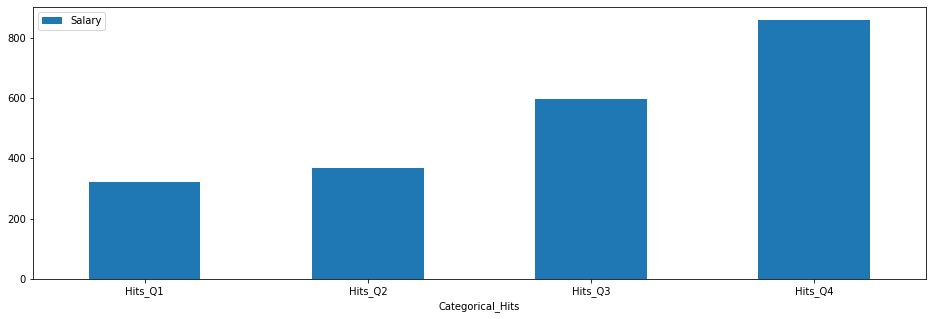

                   Salary  HmRun
Categorical_HmRun               
HmRun_Q1          365.497  2.409
HmRun_Q2          418.078  6.818
HmRun_Q3          589.456 13.062
HmRun_Q4          771.482 24.212



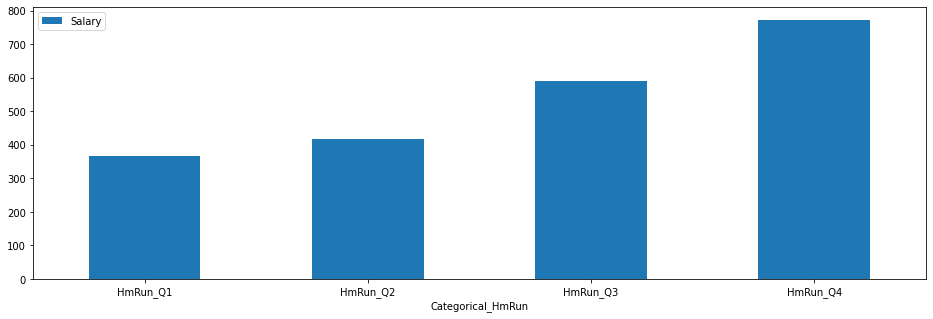

                  Salary   Runs
Categorical_Runs               
Runs_Q1          295.692 24.273
Runs_Q2          464.174 42.848
Runs_Q3          597.672 62.538
Runs_Q4          787.101 89.439



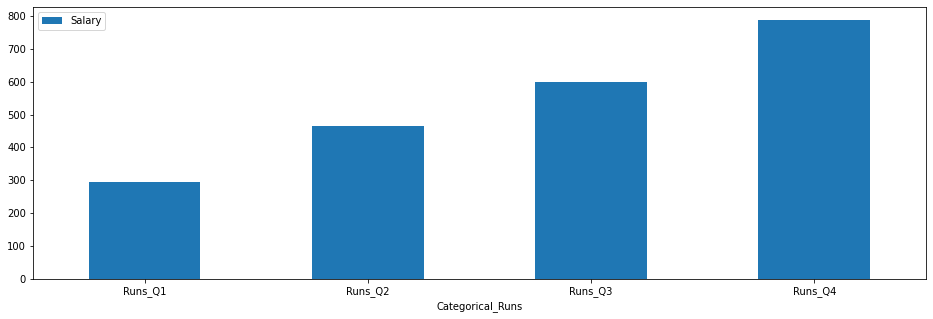

                 Salary    RBI
Categorical_RBI               
RBI_Q1          324.624 22.348
RBI_Q2          386.328 39.197
RBI_Q3          559.205 56.277
RBI_Q4          873.899 88.197



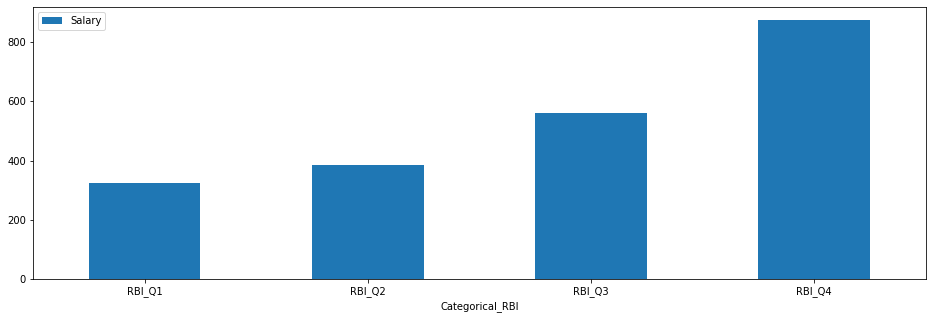

                   Salary  Walks
Categorical_Walks               
Walks_Q1          312.581 16.303
Walks_Q2          416.159 30.667
Walks_Q3          607.415 46.123
Walks_Q4          808.631 71.439



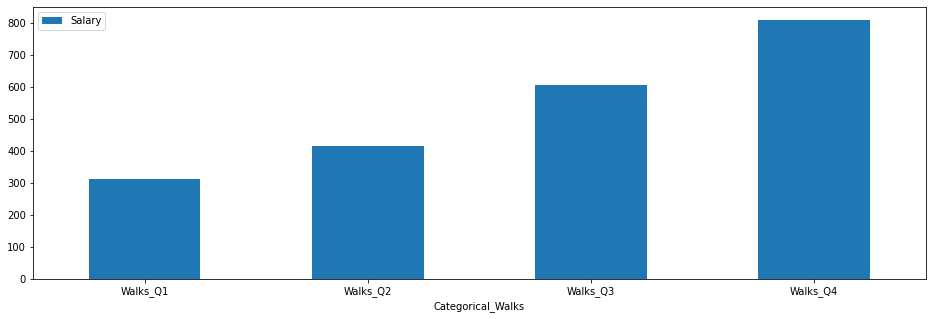

                   Salary  Years
Categorical_Years               
Years_Q1          190.073  2.227
Years_Q2          516.505  4.879
Years_Q3          682.036  7.862
Years_Q4          757.303 14.288



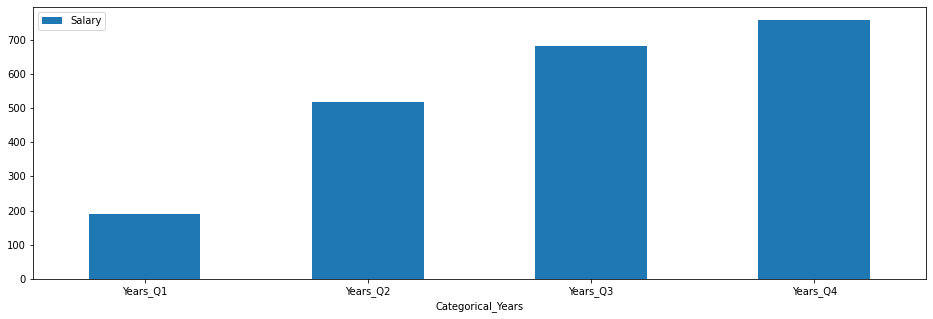

                    Salary   CAtBat
Categorical_CAtBat                 
CAtBat_Q1          168.937  478.091
CAtBat_Q2          373.245 1383.061
CAtBat_Q3          745.069 2810.877
CAtBat_Q4          859.621 5960.470



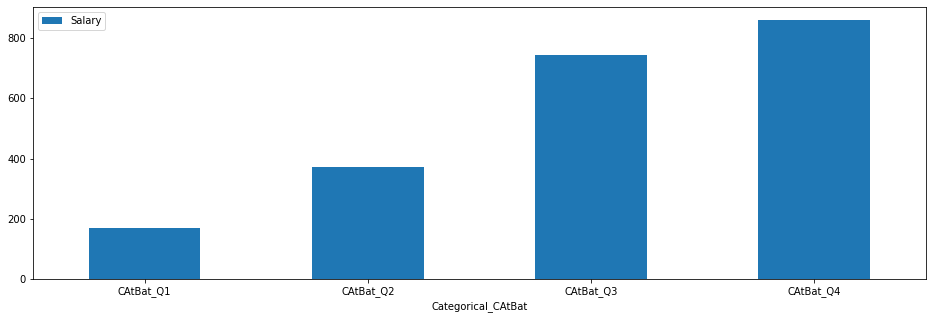

                   Salary    CHits
Categorical_CHits                 
CHits_Q1          169.164  118.318
CHits_Q2          378.093  355.318
CHits_Q3          722.223  763.277
CHits_Q4          877.046 1648.450



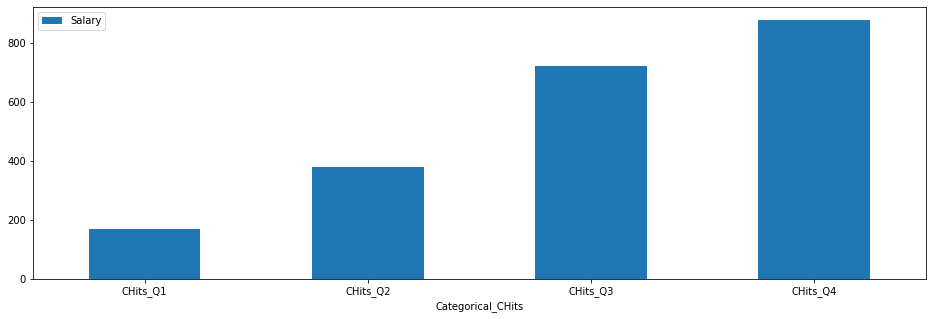

                    Salary  CHmRun
Categorical_CHmRun                
CHmRun_Q1          259.242   6.545
CHmRun_Q2          397.490  26.667
CHmRun_Q3          557.341  61.138
CHmRun_Q4          929.955 180.689



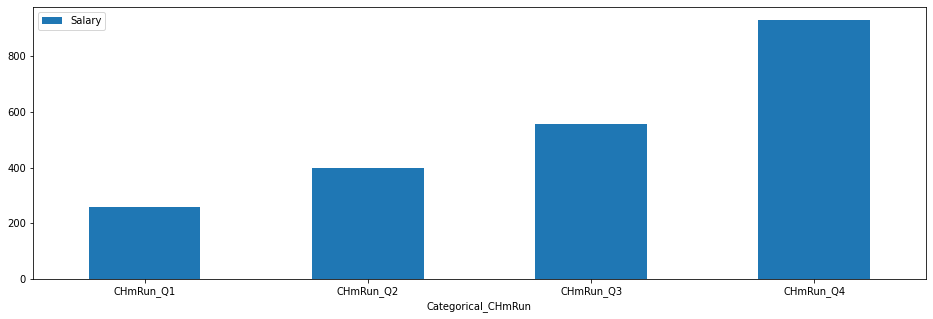

                   Salary   CRuns
Categorical_CRuns                
CRuns_Q1          172.977  59.318
CRuns_Q2          367.450 178.303
CRuns_Q3          722.197 365.646
CRuns_Q4          883.902 841.020



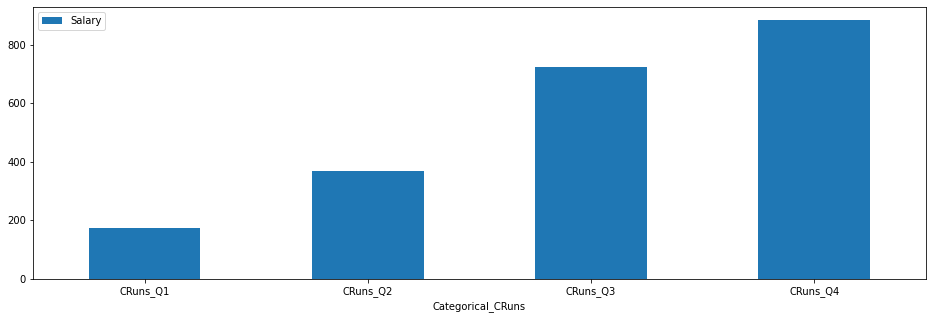

                  Salary    CRBI
Categorical_CRBI                
CRBI_Q1          173.141  48.864
CRBI_Q2          367.942 151.364
CRBI_Q3          755.044 330.492
CRBI_Q4          850.897 790.955



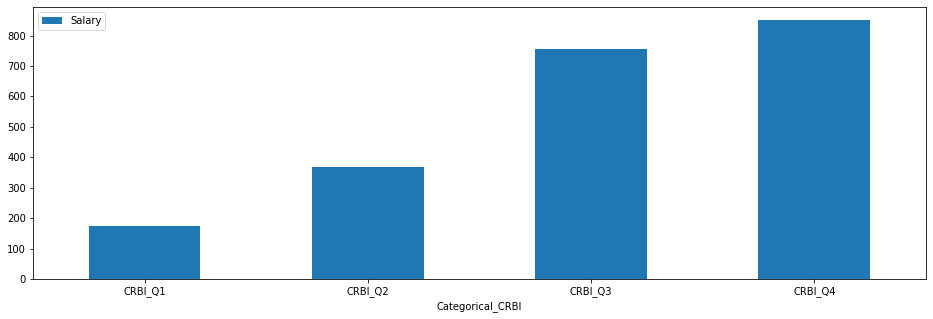

                    Salary  CWalks
Categorical_CWalks                
CWalks_Q1          176.702  40.303
CWalks_Q2          420.846 121.212
CWalks_Q3          661.838 245.554
CWalks_Q4          886.225 633.586



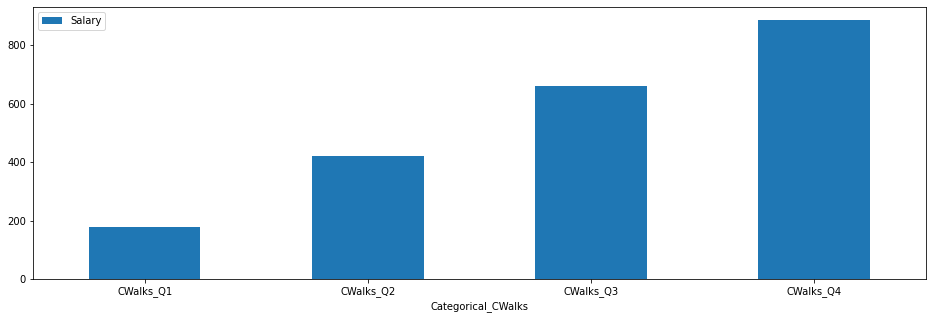

                     Salary  PutOuts
Categorical_PutOuts                 
PutOuts_Q1          450.343   65.576
PutOuts_Q2          404.136  166.712
PutOuts_Q3          575.330  272.985
PutOuts_Q4          714.491  657.303



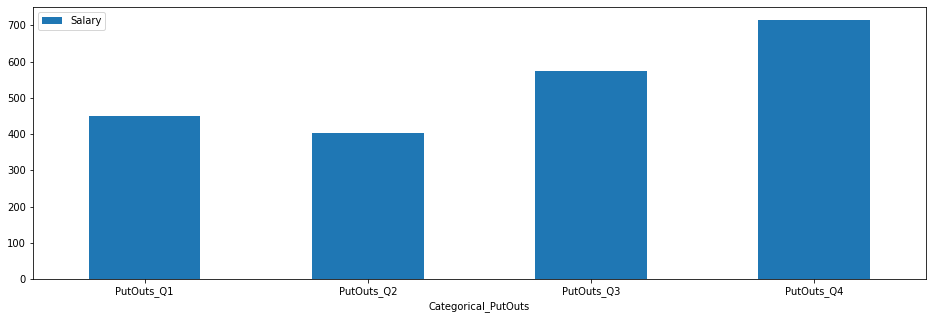

                     Salary  Assists
Categorical_Assists                 
Assists_Q1          463.321    3.606
Assists_Q2          532.876   19.227
Assists_Q3          604.586  109.338
Assists_Q4          543.962  342.727



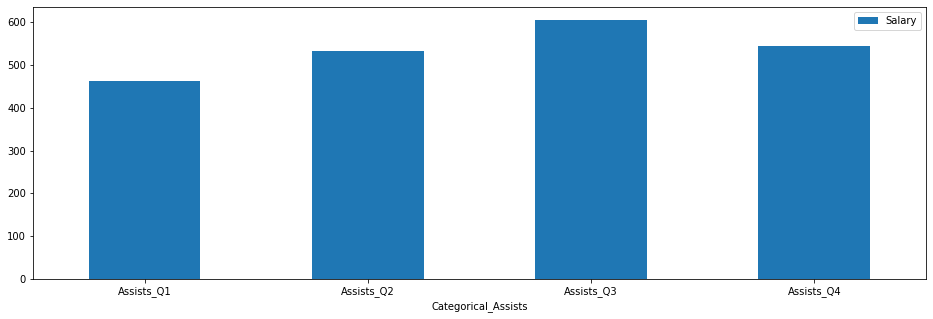

                    Salary  Errors
Categorical_Errors                
Errors_Q1          426.321   1.848
Errors_Q2          620.045   5.030
Errors_Q3          610.616   9.354
Errors_Q4          487.853  18.152



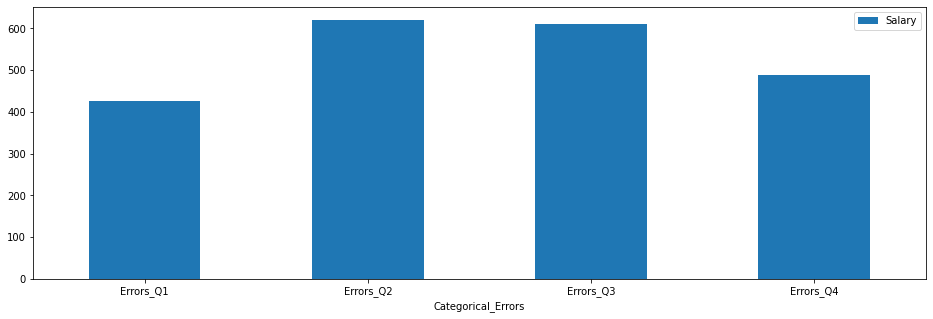

In [37]:
for col in df_x.columns:
    new_col = "Categorical_" + col
    df[new_col] = pd.qcut(df[col].rank(method="first"),4, labels =
                          [col+"_Q1",col+"_Q2",col+"_Q3",col+"_Q4"])
    print(df.groupby(new_col).agg({'Salary':'mean',
                                  col:"mean"}),end='\n\n') 
    df.groupby(new_col).agg({'Salary':'mean'}).plot(kind='bar', rot = 0,figsize=(16,5))
    plt.show()

In [38]:
df.shape

(263, 36)

In [39]:
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat,Categorical_Hits,Categorical_HmRun,Categorical_Runs,Categorical_RBI,Categorical_Walks,Categorical_Years,Categorical_CAtBat,Categorical_CHits,Categorical_CHmRun,Categorical_CRuns,Categorical_CRBI,Categorical_CWalks,Categorical_PutOuts,Categorical_Assists,Categorical_Errors
1,315,81,7,24,38,39,14,3449,835.000,69.000,321.000,414,375.000,1,1,632,43,10,475.000,1,AtBat_Q2,Hits_Q2,HmRun_Q2,Runs_Q1,RBI_Q2,Walks_Q3,Years_Q4,CAtBat_Q3,CHits_Q3,CHmRun_Q3,CRuns_Q3,CRBI_Q3,CWalks_Q4,PutOuts_Q4,Assists_Q2,Errors_Q3
2,479,130,18,66,72,76,3,1624,457.000,63.000,224.000,266,263.000,0,1,880,82,14,480.000,0,AtBat_Q3,Hits_Q3,HmRun_Q3,Runs_Q3,RBI_Q4,Walks_Q4,Years_Q1,CAtBat_Q2,CHits_Q2,CHmRun_Q3,CRuns_Q2,CRBI_Q3,CWalks_Q3,PutOuts_Q4,Assists_Q3,Errors_Q4
3,496,141,20,65,78,37,11,5628,1575.000,225.000,828.000,838,354.000,1,0,200,11,3,500.000,1,AtBat_Q3,Hits_Q3,HmRun_Q4,Runs_Q3,RBI_Q4,Walks_Q2,Years_Q4,CAtBat_Q4,CHits_Q4,CHmRun_Q4,CRuns_Q4,CRBI_Q4,CWalks_Q4,PutOuts_Q2,Assists_Q2,Errors_Q1
4,321,87,10,39,42,30,2,396,101.000,12.000,48.000,46,33.000,1,0,805,40,4,91.500,1,AtBat_Q2,Hits_Q2,HmRun_Q3,Runs_Q2,RBI_Q2,Walks_Q2,Years_Q1,CAtBat_Q1,CHits_Q1,CHmRun_Q1,CRuns_Q1,CRBI_Q1,CWalks_Q1,PutOuts_Q4,Assists_Q2,Errors_Q2
5,594,169,4,74,51,35,11,4408,1133.000,19.000,501.000,336,194.000,0,1,282,421,25,750.000,0,AtBat_Q4,Hits_Q4,HmRun_Q1,Runs_Q4,RBI_Q3,Walks_Q2,Years_Q4,CAtBat_Q4,CHits_Q4,CHmRun_Q2,CRuns_Q4,CRBI_Q3,CWalks_Q3,PutOuts_Q3,Assists_Q4,Errors_Q4


##### One-Hot Encoding:

In [40]:
cat_cols, num_cols, cat_but_car = grab_col_names(df) 

Observations: 263
Variables: 36
cat_cols: 19
num_cols: 17
cat_but_car: 0
num_but_cat: 19


In [41]:
onehot_cols= cat_cols[3:]
onehot_cols

['Categorical_AtBat',
 'Categorical_Hits',
 'Categorical_HmRun',
 'Categorical_Runs',
 'Categorical_RBI',
 'Categorical_Walks',
 'Categorical_Years',
 'Categorical_CAtBat',
 'Categorical_CHits',
 'Categorical_CHmRun',
 'Categorical_CRuns',
 'Categorical_CRBI',
 'Categorical_CWalks',
 'Categorical_PutOuts',
 'Categorical_Assists',
 'Categorical_Errors']

In [42]:
# one-hot encoding function:
def one_hot_encoder(dataframe, onehot_cols, drop_first=True):
    dataframe = pd.get_dummies(dataframe, columns=onehot_cols, drop_first=drop_first)
    return dataframe

In [43]:
df = one_hot_encoder(df, onehot_cols)
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,315,81,7,24,38,39,14,3449,835.000,69.000,321.000,414,375.000,1,1,632,43,10,475.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,479,130,18,66,72,76,3,1624,457.000,63.000,224.000,266,263.000,0,1,880,82,14,480.000,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,496,141,20,65,78,37,11,5628,1575.000,225.000,828.000,838,354.000,1,0,200,11,3,500.000,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,321,87,10,39,42,30,2,396,101.000,12.000,48.000,46,33.000,1,0,805,40,4,91.500,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,594,169,4,74,51,35,11,4408,1133.000,19.000,501.000,336,194.000,0,1,282,421,25,750.000,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


##### Checking correlation:

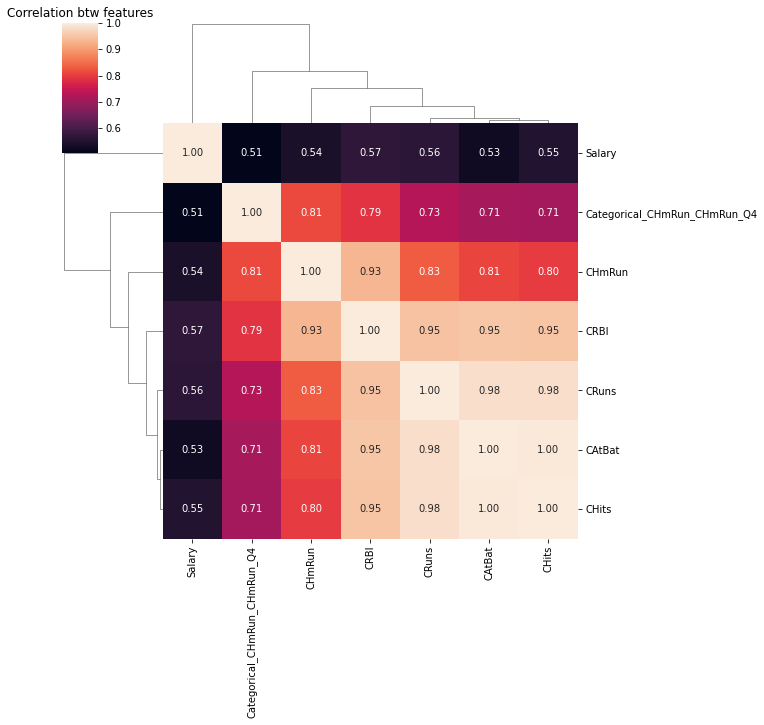

In [44]:
correlation_matrix = df.corr().round(2)
filtr=np.abs(correlation_matrix['Salary'])>0.50
corr_features=correlation_matrix.columns[filtr].tolist()
sns.clustermap(df[corr_features].corr(),annot=True,fmt=".2f")
plt.title('Correlation btw features')
plt.show()

### 6.2 Scaling

In [45]:
df.describe().T.head(18)

,count,mean,std,min,25%,50%,75%,max
AtBat,263.000,403.643,147.307,19.000,282.500,413.000,526.000,687.000
Hits,263.000,107.829,45.125,1.000,71.500,103.000,141.500,238.000
HmRun,263.000,11.620,8.757,0.000,5.000,9.000,18.000,40.000
Runs,263.000,54.745,25.540,0.000,33.500,52.000,73.000,130.000
RBI,263.000,51.487,25.883,0.000,30.000,47.000,71.000,121.000
Walks,263.000,41.114,21.718,0.000,23.000,37.000,57.000,105.000
Years,263.000,7.312,4.794,1.000,4.000,6.000,10.000,24.000
CAtBat,263.000,2657.544,2286.583,19.000,842.500,1931.000,3890.500,14053.000
CHits,263.000,721.181,642.883,4.000,212.000,516.000,1054.000,3991.700
CHmRun,263.000,68.789,79.855,0.000,15.000,40.000,92.500,429.500


In [46]:
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,315,81,7,24,38,39,14,3449,835.000,69.000,321.000,414,375.000,1,1,632,43,10,475.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,479,130,18,66,72,76,3,1624,457.000,63.000,224.000,266,263.000,0,1,880,82,14,480.000,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,496,141,20,65,78,37,11,5628,1575.000,225.000,828.000,838,354.000,1,0,200,11,3,500.000,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,321,87,10,39,42,30,2,396,101.000,12.000,48.000,46,33.000,1,0,805,40,4,91.500,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,594,169,4,74,51,35,11,4408,1133.000,19.000,501.000,336,194.000,0,1,282,421,25,750.000,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


In [47]:
scale_cols = [col for col in num_cols if col != 'Salary']
scale_cols

['AtBat',
 'Hits',
 'HmRun',
 'Runs',
 'RBI',
 'Walks',
 'Years',
 'CAtBat',
 'CHits',
 'CHmRun',
 'CRuns',
 'CRBI',
 'CWalks',
 'PutOuts',
 'Assists',
 'Errors']

In [48]:
for col in scale_cols:
    df[col] = RobustScaler().fit_transform(df[[col]])

In [49]:
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,-0.402,-0.314,-0.154,-0.709,-0.220,0.059,1.333,0.498,0.379,0.374,0.181,0.558,0.781,1,1,1.952,-0.011,0.300,475.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,0.271,0.386,0.692,0.354,0.610,1.147,-0.500,-0.101,-0.070,0.297,-0.066,0.109,0.346,0,1,3.139,0.201,0.700,480.000,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,0.341,0.543,0.846,0.329,0.756,0.000,0.833,1.213,1.258,2.387,1.474,1.845,0.699,1,0,-0.115,-0.185,-0.400,500.000,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,-0.378,-0.229,0.077,-0.329,-0.122,-0.206,-0.667,-0.504,-0.493,-0.361,-0.515,-0.558,-0.548,1,0,2.780,-0.027,-0.300,91.500,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,0.743,0.943,-0.385,0.557,0.098,-0.059,0.833,0.813,0.733,-0.271,0.640,0.322,0.078,0,1,0.278,2.043,1.800,750.000,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


## 7. Modeling

In [50]:
df.shape

(263, 68)

In [51]:
df = df.iloc[:, : ] # will use all the columns first.
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,-0.402,-0.314,-0.154,-0.709,-0.220,0.059,1.333,0.498,0.379,0.374,0.181,0.558,0.781,1,1,1.952,-0.011,0.300,475.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,0.271,0.386,0.692,0.354,0.610,1.147,-0.500,-0.101,-0.070,0.297,-0.066,0.109,0.346,0,1,3.139,0.201,0.700,480.000,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,0.341,0.543,0.846,0.329,0.756,0.000,0.833,1.213,1.258,2.387,1.474,1.845,0.699,1,0,-0.115,-0.185,-0.400,500.000,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,-0.378,-0.229,0.077,-0.329,-0.122,-0.206,-0.667,-0.504,-0.493,-0.361,-0.515,-0.558,-0.548,1,0,2.780,-0.027,-0.300,91.500,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,0.743,0.943,-0.385,0.557,0.098,-0.059,0.833,0.813,0.733,-0.271,0.640,0.322,0.078,0,1,0.278,2.043,1.800,750.000,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


In [68]:
# Train and test separation process and determining train and test size
# Test size will be %20 of the data and random state will be 46 for all of the models in
# order to compare the models
# Dependent variable y = Salary, independents variables x = the variables without salary

y = df['Salary']
X = df.drop('Salary', axis =1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=250)

In [69]:
models = [LinearRegression, Ridge, Lasso, ElasticNet, KNeighborsRegressor, SVR, MLPRegressor, 
          DecisionTreeRegressor, RandomForestRegressor, GradientBoostingRegressor, XGBRegressor, 
          LGBMRegressor, CatBoostRegressor] 

In [70]:
# Thirteen models' Root Mean Squared Errors (RMSE) 

model_names=[]
RMSE_=[]
def compML(df, y, alg):
    model = alg().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
    model_name = alg.__name__
    print(model_name, "Model RMSE:", RMSE)
    model_names.append(model_name)
    RMSE_.append(RMSE)
    return model_names, RMSE_

In [71]:
for model in models:
    compML(df, 'Salary', model)

LinearRegression Model RMSE: 372.38241408878196
Ridge Model RMSE: 380.6703402180107
Lasso Model RMSE: 372.71802077414657
ElasticNet Model RMSE: 434.3478369476695
KNeighborsRegressor Model RMSE: 421.00770904577337
SVR Model RMSE: 571.8741764459725
MLPRegressor Model RMSE: 560.7190106732045
DecisionTreeRegressor Model RMSE: 421.8704569467419
RandomForestRegressor Model RMSE: 372.21423046279745
GradientBoostingRegressor Model RMSE: 340.5685161931755
XGBRegressor Model RMSE: 382.1245209858163
LGBMRegressor Model RMSE: 406.4208559025806
Learning rate set to 0.031996
0:	learn: 420.6741566	total: 1.78ms	remaining: 1.78s
1:	learn: 413.9498231	total: 3.37ms	remaining: 1.68s
2:	learn: 407.6962652	total: 5.51ms	remaining: 1.83s
3:	learn: 401.0451475	total: 7.15ms	remaining: 1.78s
4:	learn: 395.0019100	total: 8.44ms	remaining: 1.68s
5:	learn: 389.5860669	total: 10.1ms	remaining: 1.67s
6:	learn: 384.2253971	total: 11.6ms	remaining: 1.65s
7:	learn: 378.2101684	total: 13.1ms	remaining: 1.63s
8:	learn

261:	learn: 102.8473568	total: 380ms	remaining: 1.07s
262:	learn: 102.4187426	total: 381ms	remaining: 1.07s
263:	learn: 101.7007184	total: 382ms	remaining: 1.07s
264:	learn: 101.3643744	total: 384ms	remaining: 1.06s
265:	learn: 100.9612925	total: 385ms	remaining: 1.06s
266:	learn: 100.8602806	total: 386ms	remaining: 1.06s
267:	learn: 100.5204438	total: 388ms	remaining: 1.06s
268:	learn: 100.1943573	total: 389ms	remaining: 1.06s
269:	learn: 99.6911813	total: 390ms	remaining: 1.05s
270:	learn: 99.5478932	total: 392ms	remaining: 1.05s
271:	learn: 99.4374645	total: 393ms	remaining: 1.05s
272:	learn: 99.1212318	total: 395ms	remaining: 1.05s
273:	learn: 98.7303977	total: 396ms	remaining: 1.05s
274:	learn: 98.5219801	total: 397ms	remaining: 1.05s
275:	learn: 98.2145253	total: 399ms	remaining: 1.05s
276:	learn: 98.0925721	total: 400ms	remaining: 1.04s
277:	learn: 97.8015961	total: 402ms	remaining: 1.04s
278:	learn: 97.2093665	total: 403ms	remaining: 1.04s
279:	learn: 97.1078721	total: 405ms	re

557:	learn: 41.8005025	total: 765ms	remaining: 606ms
558:	learn: 41.6283296	total: 767ms	remaining: 605ms
559:	learn: 41.5953766	total: 768ms	remaining: 603ms
560:	learn: 41.4428903	total: 769ms	remaining: 602ms
561:	learn: 41.3314746	total: 770ms	remaining: 600ms
562:	learn: 41.2607163	total: 772ms	remaining: 599ms
563:	learn: 41.1959999	total: 773ms	remaining: 598ms
564:	learn: 41.1389867	total: 774ms	remaining: 596ms
565:	learn: 40.9882853	total: 776ms	remaining: 595ms
566:	learn: 40.8709838	total: 777ms	remaining: 593ms
567:	learn: 40.7362447	total: 778ms	remaining: 592ms
568:	learn: 40.5812397	total: 780ms	remaining: 591ms
569:	learn: 40.5245284	total: 781ms	remaining: 589ms
570:	learn: 40.3897367	total: 783ms	remaining: 588ms
571:	learn: 40.3565869	total: 784ms	remaining: 587ms
572:	learn: 40.2374648	total: 785ms	remaining: 585ms
573:	learn: 40.1593097	total: 787ms	remaining: 584ms
574:	learn: 40.1243053	total: 788ms	remaining: 583ms
575:	learn: 39.9452690	total: 789ms	remaining:

854:	learn: 19.1556656	total: 1.15s	remaining: 195ms
855:	learn: 19.1433390	total: 1.15s	remaining: 194ms
856:	learn: 19.1013759	total: 1.15s	remaining: 192ms
857:	learn: 19.0015404	total: 1.15s	remaining: 191ms
858:	learn: 18.9363446	total: 1.16s	remaining: 190ms
859:	learn: 18.8643292	total: 1.16s	remaining: 188ms
860:	learn: 18.7901371	total: 1.16s	remaining: 187ms
861:	learn: 18.7098836	total: 1.16s	remaining: 186ms
862:	learn: 18.6994275	total: 1.16s	remaining: 184ms
863:	learn: 18.6676360	total: 1.16s	remaining: 183ms
864:	learn: 18.6573751	total: 1.16s	remaining: 182ms
865:	learn: 18.6491324	total: 1.17s	remaining: 180ms
866:	learn: 18.5890075	total: 1.17s	remaining: 179ms
867:	learn: 18.5671783	total: 1.17s	remaining: 178ms
868:	learn: 18.4978252	total: 1.17s	remaining: 176ms
869:	learn: 18.4657505	total: 1.17s	remaining: 175ms
870:	learn: 18.3904541	total: 1.17s	remaining: 174ms
871:	learn: 18.3576259	total: 1.17s	remaining: 172ms
872:	learn: 18.2732819	total: 1.17s	remaining:

In [56]:
RMSE_DF=[]
RMSE_DF=pd.DataFrame( RMSE_,columns=
                    ['RMSE'],index=[model_names]).sort_values(by='RMSE',ascending=True)
RMSE_DF

,RMSE
CatBoostRegressor,272.368
KNeighborsRegressor,281.970
GradientBoostingRegressor,287.578
RandomForestRegressor,288.111
LGBMRegressor,306.647
XGBRegressor,310.904
Lasso,316.202
Ridge,321.464
ElasticNet,324.204
LinearRegression,329.342


## 8. Model Tuning

###### LinearRegression:

In [80]:
reg_model = LinearRegression().fit(X, y)
np.mean(np.sqrt(-cross_val_score(reg_model,
                                 X,
                                 y,
                                 cv=10,
                                 scoring="neg_mean_squared_error")))

322.584437555474

###### Ridge Regression:

In [58]:
# Hyper parameter optimization with cross validation function.
# We will try to tune the model by assigning new alpha values.
# Default alpha value is 1.0 in Ridge regression. We will try different values.
# The best fit alpha value or parameter will be employed in the final model

alpha = [0.1,0.01,0.001,0.2,0.3,0.5,0.8,0.9,1,1.5,2]
ridreg_cv = RidgeCV(alphas = alpha, scoring = "neg_mean_squared_error", cv = 10, normalize = True)
ridreg_cv.fit(X_train, y_train)
ridreg_cv.alpha_

#Final Model 

ridreg_tuned = Ridge(alpha = ridreg_cv.alpha_,random_state=41).fit(X_train,y_train)
y_pred = ridreg_tuned.predict(X_test)

df_ridge_tuned_rmse = np.sqrt(mean_squared_error(y_test,y_pred))
df_ridge_tuned_rmse

329.4584498887204

In [59]:
ridreg_cv.alpha_

0.01

###### Lasso Regression:

In [60]:
# Hyper parameter optimization with cross validation function.
# We will try to tune the model by assigning new alpha values.
# Default alpha value is 1.0 in Lasso regression. We will try different values.
# The best fit alpha value or parameter will be employed in the final model

alpha = [0.1,0.01,0.001,0.2,0.3,0.5,0.8,0.9,1,1.5,2]
lasso_cv = LassoCV(alphas = alpha, cv = 10, normalize = True,random_state=41)
lasso_cv.fit(X_train, y_train)
lasso_cv.alpha_

# Final Model 

lasso_tuned = Lasso(alpha = lasso_cv.alpha_,random_state=41).fit(X_train,y_train)
y_pred = lasso_tuned.predict(X_test)
df_lasso_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_lasso_tuned_rmse

322.4320388005273

In [61]:
lasso_cv.alpha_

0.2

###### Elastic Net Regression:

In [62]:
# Hyper parameter optimization with cross validation function.
# We will try to tune the model by assigning new alpha values.
# Default alpha value is 1.0 and default l1_ratio is 0.5 in ElesticNet regression. We will try different values.
# The best fit  values or parameters will be employed in the final model


enet_params = {"l1_ratio": [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.5,2],
              "alpha":[0.1,0.01,0.001,0.2,0.3,0.5,0.8,0.9,1,1.5,2]}
enet = ElasticNet()
enet_model = enet.fit(X_train,y_train)
enet_cv = GridSearchCV(enet_model, enet_params, cv = 10).fit(X, y)
enet_cv.best_params_

#Final Model 

enet_tuned = ElasticNet(**enet_cv.best_params_,random_state=41).fit(X_train,y_train)
y_pred = enet_tuned.predict(X_test)
df_enet_tuned_rmse = np.sqrt(mean_squared_error(y_test,y_pred))
df_enet_tuned_rmse 

314.32226175498494

In [63]:
enet_cv.best_params_

{'alpha': 0.2, 'l1_ratio': 0.8}

###### KNN (K-Nearest Neighbors):

In [64]:
# n_neighbors : int, default=5 Number of neighbors to use by default for :meth:`kneighbors` queries.
knn = KNeighborsRegressor()
knn_params = {"n_neighbors": np.arange(2,30,1)}
knn_model = knn.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)
knn_cv_model = GridSearchCV(knn_model, knn_params, cv = 10).fit(X_train, y_train)
knn_cv_model.best_params_
knn_tuned = KNeighborsRegressor(**knn_cv_model.best_params_).fit(X_train, y_train)

# Final Model

y_pred = knn_tuned.predict(X_test)
df_knn_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_knn_tuned_rmse

309.2209164635576

In [65]:
knn_cv_model.best_estimator_

KNeighborsRegressor(n_neighbors=13)

###### SVR (Support Vector Regression):

In [66]:
# C : float, default=1.0 Regularization parameter. The strength of the regularization is 
# inversely proportional to C. Must be strictly positive. svr = SVR('linear')
svr = SVR()
svr_params = {'C': [0.01,0.001, 0.2, 0.1,0.5,0.8,0.9,1,1.5,2]}
svr_model = svr.fit(X_train, y_train)
y_pred = svr_model.predict(X_test)
svr_cv_model = GridSearchCV(svr_model, svr_params, cv = 10, n_jobs = -1, verbose =  2).fit(X_train, y_train)
svr_tuned = SVR( **svr_cv_model.best_params_).fit(X_train, y_train)
y_pred = svr_tuned.predict(X_test)
df_svr_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_svr_tuned_rmse

Fitting 10 folds for each of 10 candidates, totalling 100 fits


444.8735678866231

In [67]:
# C : float, default=1.0 Regularization parameter. The strength of the regularization is 
# inversely proportional to C. Must be strictly positive. svr = SVR('linear')
from sklearn.svm import LinearSVR
svr = LinearSVR()
svr_params = {'C': [0.01,0.001, 0.2, 0.1,0.5,0.8,0.9,1,1.5,2]}
svr_model = svr.fit(X_train, y_train)
y_pred = svr_model.predict(X_test)
svr_cv_model = GridSearchCV(svr_model, svr_params, cv = 10, n_jobs = -1, verbose =  2).fit(X_train, y_train)
svr_tuned = LinearSVR( **svr_cv_model.best_params_,random_state=41).fit(X_train, y_train)
y_pred = svr_tuned.predict(X_test)
df_svr_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_svr_tuned_rmse

Fitting 10 folds for each of 10 candidates, totalling 100 fits


341.22381734697336

In [68]:
svr_cv_model.best_estimator_

LinearSVR(C=2)

###### MLP (Multilayer Perceptron):

In [69]:
# hidden_layer_sizes : tuple, length = n_layers - 2, default=(100,) The ith element 
# represents the number of neurons in the ith hidden layer.
#alpha : float, default=0.0001

mlp_params = {"alpha": [0.1, 0.01, 0.02, 0.001, 0.0001], 
             "hidden_layer_sizes": [(10,20), (5,5), (100,100), (1000,100,10)]}
mlp = MLPRegressor()
mlp_model = mlp.fit(X_train, y_train)
y_pred = mlp_model.predict(X_test)
mlp_cv_model = GridSearchCV(mlp_model, mlp_params, cv = 10, verbose = 2, n_jobs = -1).fit(X_train, y_train)
mlp_tuned = MLPRegressor(**mlp_cv_model.best_params_,random_state=41).fit(X_train, y_train)
y_pred = mlp_tuned.predict(X_test)
df_mlp_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_mlp_tuned_rmse

Fitting 10 folds for each of 20 candidates, totalling 200 fits


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


310.41120763342667

In [70]:
mlp_cv_model.best_estimator_

MLPRegressor(alpha=0.01, hidden_layer_sizes=(100, 100))

###### CART (Classification and Regression Trees):

max_depth : int, default=None The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

min_samples_split : int or float, default=2 The minimum number of samples required to split an internal node:

If int, then consider min_samples_split as the minimum number.
If float, then min_samples_split is a fraction and ceil(min_samples_split * n_samples) are the minimum number of samples for each split.

In [71]:
cart_params = {"max_depth": [2,3,4,5,10,20, 100, 1000],
              "min_samples_split": [2,10,5,30,50,10]}
cart = DecisionTreeRegressor()
cart_model = cart.fit(X_train, y_train)
y_pred = cart_model.predict(X_test)
cart_cv_model = GridSearchCV(cart_model, cart_params, cv = 10).fit(X_train, y_train)
cart_tuned = DecisionTreeRegressor(**cart_cv_model.best_params_,random_state=41).fit(X_train, y_train)
y_pred = cart_tuned.predict(X_test)
df_cart_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_cart_tuned_rmse

361.4434857031084

In [72]:
cart_cv_model.best_estimator_

DecisionTreeRegressor(max_depth=3, min_samples_split=10)

###### Random Forests:

RandomForestRegressor default values

-n_estimators=100,
criterion='mse',
max_depth=None,
min_samples_split=2
n_jobs=None,
verbose=0

In [73]:
rf_params = {"max_depth": [5,8,10,None],
            "max_features": [2,5,10,15,17],
            "n_estimators": [100,200, 500, 1000],
            "min_samples_split": [2,5,10,20,30]}
rf = RandomForestRegressor()
rf_model = rf.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
rf_cv_model = GridSearchCV(rf_model, rf_params, cv = 10, n_jobs = -1, verbose = 2).fit(X_train, y_train)
rf_tuned = RandomForestRegressor(**rf_cv_model.best_params_,random_state=41).fit(X_train, y_train)
y_pred = rf_tuned.predict(X_test)
df_rf_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_rf_tuned_rmse

Fitting 10 folds for each of 400 candidates, totalling 4000 fits
[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ...................................

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ................................................C=1; total time=   0.0s
[CV] END ................................................C=1; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ...................

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ...................

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=1.5; total time=   0.0s
[CV] END ..............................................C=1.5; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END .............alpha=0.1, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ...............alpha=0.1, hidden_layer_sizes=(5, 5); total time=   0.1s
[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.4s
[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.3s
[CV] END ............alpha=0.01, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ............alpha=0

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.1; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.9; total time=   0.0s
[CV] END ..............................................C=0.9; total time=   0.0s
[CV] END ................................................C=1; total time=   0.0s
[CV] END ................................................C=1; total time=   0.0s
[CV] END ..............................................C=1.5; total time=   0.0s
[CV] END ..............................................C=1.5; total time=   0.0s
[CV] END ...................

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.9; total time=   0.0s
[CV] END ..............................................C=0.9; total time=   0.0s
[CV] END .............................................C=0.01; total time=   0.0s
[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ...................

[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.4s
[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.3s
[CV] END ............alpha=0.01, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ............alpha=0.01, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ..............alpha=0.01, hidden_layer_sizes=(5, 5); total time=   0.1s
[CV] END ..............alpha=0.01, hidden_layer_sizes=(5, 5); total time=   0.1s
[CV] END ..........alpha=0.01, hidden_layer_sizes=(100, 100); total time=   0.4s
[CV] END ..........alpha=0.01, hidden_layer_sizes=(100, 100); total time=   0.3s
[CV] END .....alpha=0.01, hidden_layer_sizes=(1000, 100, 10); total time=   1.1s
[CV] END .....alpha=0.01, hidden_layer_sizes=(1000, 100, 10); total time=   0.8s
[CV] END .....alpha=0.02, hidden_layer_sizes=(1000, 100, 10); total time=   0.9s
[CV] END .....alpha=0.02, hidden_layer_sizes=(1000, 100, 10); total time=   0.8s
[CV] END ....alpha=0.001, hi

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END .............................................C=0.01; total time=   0.0s
[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ............................................C=0.001; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.2; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.5; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ..............................................C=0.8; total time=   0.0s
[CV] END ...................

[CV] END .............................................C=0.01; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END ................................................C=2; total time=   0.0s
[CV] END .............alpha=0.1, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ...............alpha=0.1, hidden_layer_sizes=(5, 5); total time=   0.1s
[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.3s
[CV] END ...........alpha=0.1, hidden_layer_sizes=(100, 100); total time=   0.3s
[CV] END ............alpha=0.01, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ............alpha=0.01, hidden_layer_sizes=(10, 20); total time=   0.1s
[CV] END ..............alpha=0.01, hidden_layer_sizes=(5, 5); total time=   0.1s
[CV] END ..............alpha

[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=1000; total time=   0.7s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=

[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=2, min_samples_split=30, n_estimators=1000; total time=   0.7s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features

[CV] END max_depth=8, max_features=5, min_samples_split=2, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV] END max_depth=8, max_feature

[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=5, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV] END max_depth=8, max_features=5, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=20, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_featu

[CV] END max_depth=8, max_features=5, min_samples_split=30, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=5, min_samples_split=30, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=5, min_samples_split=30, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=5, min_samples_split=30, n_estimators=1000; total time=   0.7s
[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=500; total time=   0.5s
[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=1000; total time=   0.9s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_fe

[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=1000; total time=   0.9s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, 

[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=10, min_samples_split=2, n_estimators=1000; total time=   0.9s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max_features=10, min_samples_split=5, n_estimators=1000; total time=   0.8s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=10, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max

275.12683083133663

In [74]:
rf_cv_model.best_estimator_

RandomForestRegressor(max_depth=8, max_features=17, min_samples_split=5)

###### GBM (Gradient Boosting Machines):

loss : {'ls', 'lad', 'huber', 'quantile'}, default='ls'

loss function to be optimized. 'ls' refers to least squares regression. 'lad' (least absolute deviation) is a highly robust loss function solely based on order information of the input variables. 'huber' is a combination of the two. 'quantile' allows quantile regression (use alpha to specify the quantile).

learning_rate : float, default=0.1

learning rate shrinks the contribution of each tree by learning_rate. There is a trade-off between learning_rate and n_estimators.

n_estimators : int, default=100

The number of boosting stages to perform. Gradient boosting is fairly robust to over-fitting so a large number usually results in better performance.

subsample : float, default=1.0

The fraction of samples to be used for fitting the individual base learners. If smaller than 1.0 this results in Stochastic Gradient Boosting. subsample interacts with the parameter n_estimators. Choosing subsample < 1.0 leads to a reduction of variance and an increase in bias.

max_depth : int, default=3

maximum depth of the individual regression estimators. The maximum depth limits the number of nodes in the tree. Tune this parameter for best performance; the best value depends on the interaction of the input variables.

In [75]:
gbm_params = {"learning_rate": [0.001,0.1,0.01, 0.05],
             "max_depth": [1,2,3,5,8,9,10],
             "n_estimators": [50,100,200,500,1000],
             "subsample": [2,1.5,1,0.4,0.5,0.7],
             "loss": ["ls","lad","quantile"]}
gbm = GradientBoostingRegressor()
gbm_model = gbm.fit(X_train, y_train)
y_pred = gbm_model.predict(X_test)
gbm_cv_model = GridSearchCV(gbm_model, gbm_params, cv = 10, n_jobs = -1, verbose = 2).fit(X_train, y_train)
gbm_tuned = GradientBoostingRegressor(**gbm_cv_model.best_params_,random_state=41).fit(X_train, y_train)                             
y_pred = gbm_tuned.predict(X_test)                             
df_gbm_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))                             
df_gbm_tuned_rmse


Fitting 10 folds for each of 2520 candidates, totalling 25200 fits


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=8, max_features=15, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=15, min_samples_split=2, n_estimators=500; total time=   0.5s
[CV] END max_depth=8, max_features=15, min_samples_split=2, n_estimators=1000; total time=   1.0s
[CV] END max_depth=8, max_features=15, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=15, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=15, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=8, max_features=15, min_samples_split=5, n_estimators=1000; total time=   0.9s
[CV] END max_depth=8, max_features=15, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=8, max_features=15, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=15, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=8, max

nings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=10, max_features=17, min_samples_split=2, n_estimators=1000; total time=   1.1s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=1000; total time=   1.0s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=1000; total time=   0.9s
[CV] END max_

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=1000; total time=   1.0s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=1000; total time=   0.9s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=500; total time=   0.4s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=1000; total time=   0.9s
[CV] END 

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=None, max_features=5, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=5, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=5, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=5, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=5, min_samples_split=20, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=5, min_samples_split=20, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=5, min_samples_split=20, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=5, min_samples_split=30, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=5, min_samples_split=30, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=5, min_samples_split=30, n_estimators=500; total time=   0.4

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=1000; total time=   0.8s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=500; total time=   0.3s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=500; total time=   0.3s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=1000; total time=   0.7s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=10, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=500; total time=   0.3s
[CV] END max_depth=None, max_features=2, min_samples_split=20, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=30, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=30, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=30, n_estimators=500; total time=   0.3s
[CV] END max_depth=None, max_features=2, min_samples_split=30, n_estimators=1000; total time=   0.

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=17, min_samples_split=5, n_estimators=1000; total time=   1.0s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=17, min_samples_split=10, n_estimators=1000; total time=   0.9s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=17, min_samples_split=20, n_estimators=200; total time=   0.2s
[CV] END max

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END max_depth=10, max_features=17, min_samples_split=30, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_features=17, min_samples_split=30, n_estimators=500; total time=   0.4s
[CV] END max_depth=10, max_features=17, min_samples_split=30, n_estimators=1000; total time=   0.8s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=2, min_samples_split=2, n_estimators=1000; total time=   0.7s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, max_features=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=50, subsam

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=500, su

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, su

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=500, subsample=2;

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=2;

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_e

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=2, n_estimators=500, subsam

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_estimators=1000, subsample=1; total time=   2.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=8, n_est

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimat

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=3, n_estimators=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(


[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=5

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=200

[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=ls, max_depth=9, n_estimators=200

[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_

[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1; total time=   1.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1; total time=   1.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1; total time=   1.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=500, subsample=1; total time=   1.2s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimators=1000, subsample=0.7; total time=   1.7s
[CV] END learning_rate=0.001, loss=ls, max_depth=10, n_estimat

[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_dept

[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=1000, subsample=0.4; total time=   0.6s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.001, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=2, n_estimat

[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=500, subsample=0.7; total time=   1.8s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=500, subsample=0.7; total time=   1.6s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=1000, subsample=1; total time=   4.9s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=1000, subsample=0.5; total time=   2.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=9, n_estimators=1000, subsample=0.5; total time=   2.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_es

[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=0.4; total time=   0.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.9s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.8s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.7s
[CV] END learning_rate=0.001, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.9s
[CV] END learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=5, n_esti

[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_e

[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=1; total time=   0.5s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_es

[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END l

[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, 

[CV] END learning_rate=0.001, loss=lad, max_depth=5, n_estimators=1000, subsample=0.7; total time=   2.8s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=1; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=8, n_est

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=1, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learn

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.001, loss=lad, max_depth=10, n_estimators=500, subsample=1; total time=   2.4s
[CV] END learning_rate=0.001, loss=lad, max_dept

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.4; total time=   1.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.4; total time=   1.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learni

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END lea

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=1; total time=   1.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.7; total time=   1.1s
[CV] EN

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.6s
[CV] E

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1; total time=   1.5s
[CV] END lea

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1; total time=   0.7s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-

[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=1000, subsample=1; total time=   3.2s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.4; total time=   1.4s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.4; total time=   1.3s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.7; total time=   2.4s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, los

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.001, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END lear

  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda

[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=50, subsample=0.5; total time=   0.0s


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total 

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=2, n_estimators=1000, subsample=1.5; t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

ubsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=50, subsa

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s


/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=2; total t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=1000, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=1000, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.1, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=ls, max_depth=5, n_estimators=200, subsample=0.4; to

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1; total time=   0.4s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.2

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=10, n_estimators=50, subsample=1.5; total t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=1; tot

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=1; total time=   0.6s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=500, subsample=0.5; total time=  

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(


[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=1; total time=   0.7s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=0.4; total time=   1.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=ls, max_depth=8, n_estimators=1000, subsample=0.

[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.1, loss=ls, max_depth=9, n_estimators=1000, subsample=0.5;

[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsampl

[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1; total time=   0.4s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.

[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=1, n_estimators=500, subsample=0.4; total

[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=500, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=500, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=2, n_estimators=1000, subsample=2

[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1; total time=   0.9s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=1; total time=   0.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsampl

[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=1; total time=   3.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.4; total time=   2.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.7; total time=   2.9s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=50, subsam

[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=500, subsample=1; total time=   1.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=500, subsample=1; total time=   1.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.4s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsamp

[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.5; total time=   0.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.6s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=1000, subsample=1; total time=   1.6s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=1000, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=3, n_estimators=1000, subsample=0.7; total time=   1.6s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=100, subsam

[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=1000, subsample=0.7; total time=   4.7s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=50, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=50, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=1; total time=   0.6s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=200

[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=1; total time=   3.2s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.4; total time=   2.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=5, n_estimators=1000, subsample=0.7; total time=   3.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1; total time=   0.6s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subs

[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estim

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=9, n_estimators=200, subsampl

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=200, subsample=1; total time=   1.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=200, subsample=1; total time=   1.3s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=200, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=200, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.1, loss=lad, max_depth=10, n_estimators=500

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.1, loss=

nings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, 

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quant

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=500, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=2, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=q

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=1; total time=   0.7s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=1; total time=   0.7s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=500, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.4; total time=   1.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.4; total time=   1.3s
[CV] END learning_rate=0.1, loss

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.1, loss=quant

ages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The los

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=50, subsample=1; total

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=500, subsample=1; total time=   2.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=500, subsample=1; total time=   2.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=500, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=500, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=1000, subsample=1; total time=   4.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.4; total time=   2.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.7; total time=   3.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=9, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, lo

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantil

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.1, loss=quanti

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=200, subsample=1.5;

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.1, loss=qu

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=1; total time=   0.4s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=100, subsample=0.

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=1, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1; total time=   2.2s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=1; total time=   2.3s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=0.7; total time=   1.6s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=500, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.1, loss=quantile, max_depth=10, n_estimators=1000, subsample=1; total time=   4.6s
[CV] END learning_rate=0

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, loss=ls, max_depth=2, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsampl

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=500, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=500, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, 

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=1000

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsampl

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=1000, subsample=0.7; total time=   1.6s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=1000, subsample=0.7; total time=   1.4s
[CV] END learning_rate=0.01, loss=ls, max_depth=8, n_estimators=1000, s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsam

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=9, n_estimators=200, subsample=2;

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=

[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subs

[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimat

[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=1000, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=1000, subsample=0.7; total time=   1.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=1, n_estimato

[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=3, n_estimators=50, subsample=0.

[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=ls, max_depth=10, n_estimators=100, subsampl

[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators=500, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.01, loss=lad, max_depth=2, n_estimators

[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.4; total time=   1.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.4; total time=   1.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.7; total time=   2.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimato

[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, 

[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=50, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=50, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100, subsample

[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1; total time=   0.7s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=1; total time=   0.7s
[CV] END learn

[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.7; total time=   1.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=1000, subsample=1; total time=   3.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=1000, subsample=0.4; total time=   2.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.01, loss=lad, max_depth=5, n_estimators=1000, subsample=0.7; total time=   2.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=8, n_estimators=5

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=500, subsample=0.7; total time=   2.3s
[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=1000, subsample=1; total time=   5.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=1000, subsample=0.4; total time=   2.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=1000, subsample=0.5; total time=   3.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=10, n_estimators=1000, subsample=0.7; total time=   4.5s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_de

sion 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  war

[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=1000, subsample=1; total time=   5.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=100, subsample=1; total time=   0.1s
[CV] END learning_rate=0.01, loss

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1; total time=   1.1s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.4; total time=   1.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.4; total time=   1.4s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=500, subsample=0.7; total time=   2.2s
[CV] END learning_rate=0.01, loss=lad, max_depth=9, n_estimators=100

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=1000, subsample=1; total time=   1.5s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.7; total time=   1.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=1000, subsample=0.7; total time=   1.5s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=1; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.4; total time=   0.8s
[CV] END learning_rate=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=2, n_estimators=1000, subsample=1; total time=   1.1s
[CV] END lea

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=1000, subsample=0.7; total time=   2.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.5s
[CV] END learning_rate

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=100, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.4; total time=   2.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.5; total time=   2.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.7; total time=   3.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=500, subsample=0.4; total time=   0.8s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=500, subsample=0.4; total time=   0.8s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=500, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-pack

[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=0.4; total t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=1; total time=   4.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=0.5; total time=   2.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=0.7; total time=   3.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.01, l

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=500, subsample=

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=3, n_estimators=50, subsample=1; tot

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=100, subsample=1.5; t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=1; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=1; t

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=200, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subs

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=500, subsample=0.7; total time=   1.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=1; total time=   4.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=0.4; total time=   2.0s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=0.5; total time=   2.4s
[CV] END learning_rate=0.01, loss=quantile, max_depth=9, n_estimators=1000, subsample=0.7; total time=   3.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.01, loss=quantile, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END lear

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=500, subsample=1; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=1000, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=1000, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=1000, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=1, n_estimators=1000, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=2, n_estimators=50, subsample=1.5

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=100, subsample=2; total

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=9, n_estimators=50, subsample=1.5; total time=  

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1; total time=   1.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=0.4; total time=   1.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=0.7; total time=   1.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=50, su

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsampl

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/s

/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(
/Users/demirzumrut/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(


[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, 

[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=200, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=1; total time=   1.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=0.4; total time=   0.6s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=0.4; total time=   0.6s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=500, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1; total time=   1.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=0.4; total time=   1.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=

[CV] END learning_rate=0.05, loss=ls, max_depth=5, n_estimators=1000, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=8, n_estimators=200, subsample=1.5; tota

[CV] END learning_rate=0.05, loss=lad, max_depth=5, n_estimators=1000, subsample=0.4; total time=   2.2s[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=200, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=5

[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimat

[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=200, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=500, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimators=1000, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=1, n_estimat

[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_estimators=1000, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=ls, max_depth=10, n_e

[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=0.4; total time=   1.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=0.7; total time=   2.2s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=1000, subsample=1; total time=   5.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=1000, subsample=0.5; total time=   3.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators

[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=500, subsampl

[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=500, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.8s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=2, n_estimators=1000

[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=100, subsample=1; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.7s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=5


[CV] END learning_rate=0.05, loss=lad, max_depth=5, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=5, n_estimators=1000, subsample=0.7; total time=   3.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=8, n_estimators=50, subsample=2; 

[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=1; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estima

[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=1; total time=   1.2s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=1; total time=   1.2s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=500, subsample=1; total time=   3.1s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=500, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=500, 

283.3099944993324

In [76]:
gbm_cv_model.best_estimator_

GradientBoostingRegressor(loss='lad', max_depth=2, n_estimators=500,
                          subsample=0.4)

###### XGBoost (Extreme Gradient Boosting):

In [77]:
xgb_params = {"learning_rate": [0.1,0.01,0.5,0.7,0.8],
             "max_depth": [3,4,5,6,7,8],
             "n_estimators": [100,200,500,1000],
             "colsample_bytree": [0.5,0.7,0.8,0.9]}
xgb = XGBRegressor()
xgb_model = xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
xgb_cv_model  = GridSearchCV(xgb,xgb_params, cv = 10, n_jobs = -1, verbose = 2).fit(X_train, y_train)
xgb_tuned = XGBRegressor(**xgb_cv_model.best_params_,random_state=41).fit(X_train, y_train)
y_pred = xgb_tuned.predict(X_test)
df_xgb_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
df_xgb_tuned_rmse

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=9, n_estimators=200, subsample=2; total time=   0.0s
[CV] END le

[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=1; total time=   0.7s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=1; total time=   0.6s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=50, subsample=0.4; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, l

[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=1; total time=   0.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=100, subsample=0.5; total time=   0.3s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200

[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=200, subsample=1; total time=   0.1s
[CV] END learning_rate=0.05, 

[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=200, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=500, subsample=0.4; total time=   1.5s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=500, subsample=0.7; total time=   2.4s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=1000, subsample=1; total time=   6.2s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=1000, subsample=0.4; total time=   3.0s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_

[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=1000, subsample=0.5; total time=   3.6s
[CV] END learning_rate=0.05, loss=lad, max_depth=10, n_estimators=1000, subsample=0.7; total time=   4.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=500, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=1, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05,

[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.4; total time=   0.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=2, n_estimators=1000, subsample=0.5; total time=   0.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=3, n_estimators=50, subsample=1.5; total time=   0.0s
[CV] END learning_rate

[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=0.4; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05

[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=0.4; total time=   1.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=0.4; total time=   2.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5; total time=   3.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5; total time=   1.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=2; total time=   0.0s
[CV] END learning_rate=

[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=2; total time=   0.0s
[CV] END learning_rate=0.

[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=

[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=1; total time=   3.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.4; total time=   2.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.7; total time=   3.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=50, subsample=1; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=50, subsample=0.4; total time=   0.1s
[CV] END learning_rate=

[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=100, subsample=0.4; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=1; total time=   2.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=500, subsample=1; total time=   4.8s
[CV] END learning_rate=

[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=5, n_estimators=200, subsample=1.5; total time=   0.0s
[CV] END learning_rate=0.05, lo

[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=50, subsample=0.5; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=50, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=100, subsample=2; total time=   0.0s
[CV] END learning_rate=0.

[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=500, subsample=0.5; total time=   1.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=1000, subsample=1; total time=   4.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.4; total time=   2.2s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.4; total time=   2.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.9s
[CV] END learning_rate=0.05, loss=quantile, max_depth=10, n_estimators=1000, subsample=0.7; total time=   2.8s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learni

[CV] END learning_rate=0.05, loss=quantile, max_depth=8, n_estimators=1000, subsample=0.7; total time=   3.1s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=0.4; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=200, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=500, subsample=1; total time=   2.0s
[CV] END learning_rate=0.05, loss=quantile, max_depth=9, n_estimators=500, subsample=1; total time=   2.1s
[CV] END learning_rate

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=5, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=6, n_estimators=100; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=6, n_estimators=200; total tim

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.6s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=8, n_estimators=1000; total time=   1.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=200; total time=   

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=7, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=100; total time=   0.

[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=1000; total time=   0.

[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=1000; total time=   0.5s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=200; total time=   0.1

[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=7, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=8, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=8, n_estimators=500; total time= 1.6min
[CV] END colsample_bytree=0.5, learning_rate=0.7, max_depth=8, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=3, n_estimators=1000; total time=   0.

[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=6, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=200; total time=   

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, n_estimators=1000; total time=   0.7s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000; total time=   0.5s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000; total time=   0

[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=1000; total time=   0.5s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=5, n_estimators=1000; total time=   0.8s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=5, n_estimators=1000; total time=   0.7s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.9s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.9s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200; to

[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=7, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=500; total time=   0.2

[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=4, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.7, max_depth=6, n_estimators=200; total time=   0.1s

[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=7, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=8, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.8, max_depth=8, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=100; total time=   0.1

282.9519293944534

In [78]:
xgb_cv_model.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

###### LightGBM:

In [79]:
# learning_rate default = 0.1, n_estimators default = 100, colsample_bytree default = 1, 
# max_depth default = -1, n_jobs default=-1)

lgbm_params = {"learning_rate": [0.01,0.001, 0.1, 0.5, 1],
              "n_estimators": [50,80,100,200,500,1000],
              "max_depth": [-1.5, -1.3, -1, 0.3, 0.5,0.7,2,4,6,7,10],
              "colsample_bytree": [0.1,0.3,0.5,0.7,1,1.3,1.5]}
lgbm = LGBMRegressor()
lgbm_model = lgbm.fit(X_train, y_train)
y_pred = lgbm_model.predict(X_test)
lgbm_cv_model = GridSearchCV(lgbm_model, lgbm_params, cv = 10, n_jobs = -1, verbose =2).fit(X_train, y_train)
lgbm_tuned = LGBMRegressor(**lgbm_cv_model.best_params_,random_state=41).fit(X_train, y_train)                              
y_pred = lgbm_tuned.predict(X_test)                              
df_lgbm_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))                              
df_lgbm_tuned_rmse

Fitting 10 folds for each of 2310 candidates, totalling 23100 fits


[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=200; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=500; total time=   0.4s


t "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type

mple_bytree=0.9, learning_rate=0.5, max_depth=3, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=5, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.9, learning_rate=0.5, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END co

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=7, n_estimators=200; total time=   0.

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

e=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.5, max_depth=6, n_estimators=500; total t

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=6, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=200; total time=   0.1

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of

time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=7, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=7, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=8, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=8, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=8, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=-1.5, n_estimators=20

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=7, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.8, learning_rate=0.8, max_depth=8, n_estimators=1000; total time=   0.3s
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=3, n_estimators=500; total time=   0.3

[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=-1.5, n_estimato

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of t

[CV] END colsample_bytree=0.9, learning_rate=0.7, max_depth=8, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.7, max_depth=8, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.7, max_depth=8, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=3, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=3, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=500; total time=   0.2

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=20

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=6, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=6, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=7, n_estimators=100; total time=   

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"


[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.01, max_depth=4, n_estimators=80; total time=  

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=4, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=500; total time=   0.2s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=5, n_estimators=1000; total time=   0.4s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=6, n_estimators=100; total time=   0.1s
[CV] END colsample_bytree=0.9, learning_rate=0.8, max_depth=6, n_estimators=200; total time=   0.1

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.001, max_depth=0.3, n_esti

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.5, max_depth=-1.3, n_

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=0.1, max_depth=2, n_estimators=100; t

[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=4, n_estimators=100; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=0.7, n_estimators=80;

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END c

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1.5, n_estimator

[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=500;

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

al time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s


[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=-1, n_estimators=100; total time=  

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=4, n_estimators=50; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1, 

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.001, max_depth=-1

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END

[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=6, n_estimators=80; total time=   0.0s
[CV] END c

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=-1, n_estimators=80;

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.3, n_estim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=0.7, n_estim

[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=100; total tim

[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.1, max_depth=0.7, n_estimators=1

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of


[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.001, max_depth=7, n_estimat

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.3, n_estimators=2

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=1000; total ti

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1, n_estimators=50; total time=

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, 

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"


[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=200;

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

rs=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=0.3, n_estimators=80; total time=   0.0s
[CV] EN

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.1, max_depth=0.3, n_estimato

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1.5, n_estimato

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=-1

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=-1, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=1000; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1.3, n

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=80; total time=   0.0s
[CV] END 

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1, n_estimators=200; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1.5, n_estim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=0.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=2, n_estimators=200; total time=   0.0s
[CV] END

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=500; total time=   0.1s
[CV] END c

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"


[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=0.5, n_estimato

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=0.3, n_estimators=200;

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=-1.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=80; total

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type in

[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.5, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_depth=0.7, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.001, max_d

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.5, n_estimators=80; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=50; total time=   0

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=-1.5, n_estimators=200;

[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.3, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=0.5, n_estimators=50; total time=

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=2, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=1, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type

[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=-1.5, n_estimators=200; total tim

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of

[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=-1, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.001, max_depth=0.3, n_estimators=50; 

35/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/cond


[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1.5, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=-1

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/con

  0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=2, n_estimators=80; total time=   0.0s
[CV] END colsample_bytr

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, go

, learning_rate=0.01, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=6, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.01, max_depth=7, n_estimators=500; total time=   0.0s
[CV] END colsample_by

, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM]

 learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10

373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 3

[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1.3, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.1, max_depth=-1, n_estimators=80; total time=   0

ype int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.7"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforg

e=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.1, max_depth=4, n_estimators=50; total time=   0.0s


ne 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/

  0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=1, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=1, max_depth=-1.5, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.3, learning_rate=1, max_depth=-1.5, n_estimators=50

arameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Check failed: (feature_fract

CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1.3, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=6, n_estimators=20

0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.5"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Parameter max_depth should be of type int, got "0.3"
[LightGBM] [Fatal] Parameter max_depth should be of type int, got "-1.3"
[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cp

, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=100; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.001, max_depth=-1, n_estimators=200; total time=   0.0s

fig_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_1641600054035/work/compile/src/io/config_auto.cpp, line 373 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /Users/runner/miniforge3/conda-bld/lightgbm_16416000540

307.9686039282158

In [80]:
lgbm_cv_model.best_estimator_

LGBMRegressor(colsample_bytree=0.5, n_estimators=50)

###### CatBoost (Category Boosting):

In [81]:
catb_params = {"iterations": [200,500,100],
              "learning_rate": [0.01,0.1],
              "depth": [3,6,8]}
catb = CatBoostRegressor()
catb_model = catb.fit(X_train, y_train)
y_pred = catb_model.predict(X_test)
catb_cv_model = GridSearchCV(catb_model, catb_params, cv = 10, n_jobs = -1, verbose = 2).fit(X_train, y_train)
catb_tuned = CatBoostRegressor(**catb_cv_model.best_params_,random_state=41).fit(X_train, y_train)                            
y_pred = catb_tuned.predict(X_test) 
df_catb_tuned_rmse = np.sqrt(mean_squared_error(y_test, y_pred))                            
df_catb_tuned_rmse 

Learning rate set to 0.031996
0:	learn: 446.0304090	total: 3.1ms	remaining: 3.1s
1:	learn: 438.7671382	total: 4.54ms	remaining: 2.27s
2:	learn: 433.0717440	total: 5.83ms	remaining: 1.94s
3:	learn: 426.7467689	total: 7.78ms	remaining: 1.94s
4:	learn: 420.6772636	total: 9.08ms	remaining: 1.81s
5:	learn: 416.7501080	total: 10.5ms	remaining: 1.75s
6:	learn: 411.7520025	total: 11.8ms	remaining: 1.68s
7:	learn: 405.6715396	total: 13.2ms	remaining: 1.64s
8:	learn: 400.4079389	total: 14.7ms	remaining: 1.61s
9:	learn: 395.1613633	total: 16.2ms	remaining: 1.61s
10:	learn: 390.3043550	total: 17.7ms	remaining: 1.59s
11:	learn: 385.6779030	total: 19.2ms	remaining: 1.58s
12:	learn: 380.9749452	total: 20.8ms	remaining: 1.58s
13:	learn: 377.3702298	total: 22.3ms	remaining: 1.57s
14:	learn: 372.1140792	total: 23.8ms	remaining: 1.56s
15:	learn: 368.0676977	total: 25.2ms	remaining: 1.55s
16:	learn: 364.3658072	total: 26.5ms	remaining: 1.53s
17:	learn: 360.2720282	total: 28ms	remaining: 1.52s
18:	learn: 3

281:	learn: 109.1668940	total: 381ms	remaining: 971ms
282:	learn: 108.5140588	total: 383ms	remaining: 969ms
283:	learn: 108.3910062	total: 384ms	remaining: 968ms
284:	learn: 108.2714023	total: 385ms	remaining: 966ms
285:	learn: 107.7566219	total: 386ms	remaining: 964ms
286:	learn: 107.6368327	total: 388ms	remaining: 963ms
287:	learn: 107.1300229	total: 389ms	remaining: 961ms
288:	learn: 106.7421936	total: 390ms	remaining: 960ms
289:	learn: 106.6174826	total: 392ms	remaining: 959ms
290:	learn: 106.5007282	total: 393ms	remaining: 957ms
291:	learn: 105.9635958	total: 394ms	remaining: 956ms
292:	learn: 105.8499030	total: 396ms	remaining: 955ms
293:	learn: 105.4450052	total: 397ms	remaining: 954ms
294:	learn: 105.3347486	total: 399ms	remaining: 953ms
295:	learn: 104.8931134	total: 400ms	remaining: 951ms
296:	learn: 104.2178714	total: 402ms	remaining: 951ms
297:	learn: 104.1038733	total: 403ms	remaining: 949ms
298:	learn: 103.6426342	total: 404ms	remaining: 948ms
299:	learn: 103.5333614	tota

583:	learn: 39.3654095	total: 766ms	remaining: 545ms
584:	learn: 39.1923021	total: 767ms	remaining: 544ms
585:	learn: 38.9695128	total: 768ms	remaining: 543ms
586:	learn: 38.7759520	total: 770ms	remaining: 542ms
587:	learn: 38.6730241	total: 771ms	remaining: 540ms
588:	learn: 38.6468340	total: 772ms	remaining: 539ms
589:	learn: 38.6301434	total: 773ms	remaining: 537ms
590:	learn: 38.5255697	total: 775ms	remaining: 536ms
591:	learn: 38.3726623	total: 777ms	remaining: 535ms
592:	learn: 38.2300400	total: 778ms	remaining: 534ms
593:	learn: 38.1141034	total: 779ms	remaining: 533ms
594:	learn: 37.9666701	total: 781ms	remaining: 531ms
595:	learn: 37.7131423	total: 783ms	remaining: 531ms
596:	learn: 37.5350533	total: 784ms	remaining: 529ms
597:	learn: 37.5069759	total: 785ms	remaining: 528ms
598:	learn: 37.3002374	total: 787ms	remaining: 527ms
599:	learn: 37.1539503	total: 788ms	remaining: 525ms
600:	learn: 37.0988348	total: 789ms	remaining: 524ms
601:	learn: 37.0834072	total: 790ms	remaining:

884:	learn: 14.5623810	total: 1.15s	remaining: 150ms
885:	learn: 14.5140496	total: 1.15s	remaining: 148ms
886:	learn: 14.4820322	total: 1.15s	remaining: 147ms
887:	learn: 14.4304254	total: 1.16s	remaining: 146ms
888:	learn: 14.3787603	total: 1.16s	remaining: 145ms
889:	learn: 14.3144313	total: 1.16s	remaining: 143ms
890:	learn: 14.2726049	total: 1.16s	remaining: 142ms
891:	learn: 14.2610951	total: 1.16s	remaining: 141ms
892:	learn: 14.2164714	total: 1.16s	remaining: 139ms
893:	learn: 14.1754846	total: 1.16s	remaining: 138ms
894:	learn: 14.1356292	total: 1.17s	remaining: 137ms
895:	learn: 14.0887990	total: 1.17s	remaining: 136ms
896:	learn: 14.0433452	total: 1.18s	remaining: 135ms
897:	learn: 14.0116884	total: 1.18s	remaining: 134ms
898:	learn: 13.9685402	total: 1.18s	remaining: 132ms
899:	learn: 13.9166341	total: 1.18s	remaining: 131ms
900:	learn: 13.8661240	total: 1.18s	remaining: 130ms
901:	learn: 13.8107777	total: 1.18s	remaining: 129ms
902:	learn: 13.7561237	total: 1.18s	remaining:

[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END colsample_bytree=1.5, learning_rate=0.5, max_depth=4, n_estimators=50; total time=   0.0s
[CV] END c

56:	learn: 366.0119342	total: 119ms	remaining: 299ms
57:	learn: 364.9554207	total: 120ms	remaining: 294ms
58:	learn: 363.9144561	total: 121ms	remaining: 288ms
59:	learn: 362.8655102	total: 121ms	remaining: 283ms
60:	learn: 362.1116507	total: 122ms	remaining: 278ms
61:	learn: 361.0341768	total: 123ms	remaining: 274ms
62:	learn: 360.0221697	total: 124ms	remaining: 269ms
63:	learn: 359.1357121	total: 124ms	remaining: 264ms
64:	learn: 358.1050757	total: 125ms	remaining: 259ms
65:	learn: 357.1500643	total: 126ms	remaining: 255ms
66:	learn: 356.2016796	total: 126ms	remaining: 251ms
67:	learn: 355.3032414	total: 127ms	remaining: 246ms
68:	learn: 354.1180501	total: 128ms	remaining: 242ms
69:	learn: 353.2659987	total: 128ms	remaining: 238ms
70:	learn: 352.3938408	total: 129ms	remaining: 234ms
71:	learn: 351.4637344	total: 130ms	remaining: 230ms
72:	learn: 350.4767062	total: 130ms	remaining: 226ms
73:	learn: 349.7924510	total: 132ms	remaining: 224ms
74:	learn: 348.9299751	total: 133ms	remaining:

18:	learn: 261.4575276	total: 15.1ms	remaining: 144ms
19:	learn: 259.5390347	total: 15.8ms	remaining: 143ms
20:	learn: 256.8214902	total: 16.8ms	remaining: 143ms
21:	learn: 254.4898406	total: 17.4ms	remaining: 141ms
22:	learn: 251.0568608	total: 18.1ms	remaining: 139ms
23:	learn: 247.8586515	total: 19ms	remaining: 140ms
24:	learn: 245.3007216	total: 19.7ms	remaining: 138ms
25:	learn: 243.5414138	total: 20.4ms	remaining: 136ms
26:	learn: 239.3681904	total: 21.1ms	remaining: 135ms
27:	learn: 236.1804627	total: 21.7ms	remaining: 133ms
28:	learn: 233.4203519	total: 22.4ms	remaining: 132ms
29:	learn: 230.5765422	total: 23ms	remaining: 131ms
30:	learn: 228.1654589	total: 23.7ms	remaining: 129ms
31:	learn: 224.9080964	total: 24.4ms	remaining: 128ms
32:	learn: 222.6611899	total: 25ms	remaining: 127ms
33:	learn: 221.2590971	total: 25.7ms	remaining: 125ms
34:	learn: 218.9285985	total: 26.3ms	remaining: 124ms
35:	learn: 216.8254249	total: 27ms	remaining: 123ms
36:	learn: 214.1059143	total: 27.6ms

1:	learn: 438.4592566	total: 1.45ms	remaining: 361ms
2:	learn: 436.9104731	total: 2.18ms	remaining: 362ms
3:	learn: 435.0368041	total: 2.89ms	remaining: 359ms
4:	learn: 433.0067997	total: 3.58ms	remaining: 354ms
5:	learn: 431.1017998	total: 4.27ms	remaining: 351ms
6:	learn: 429.5991551	total: 4.95ms	remaining: 349ms
7:	learn: 427.7845640	total: 5.63ms	remaining: 346ms
8:	learn: 426.0344981	total: 6.3ms	remaining: 344ms
9:	learn: 424.4852137	total: 6.98ms	remaining: 342ms
10:	learn: 422.9329923	total: 7.64ms	remaining: 340ms
11:	learn: 421.3539566	total: 8.84ms	remaining: 359ms
12:	learn: 419.7317293	total: 10.5ms	remaining: 393ms
13:	learn: 418.3218580	total: 12.6ms	remaining: 436ms
14:	learn: 416.6982325	total: 19.8ms	remaining: 641ms
15:	learn: 415.1716489	total: 20.4ms	remaining: 616ms
16:	learn: 413.8461661	total: 20.9ms	remaining: 593ms
17:	learn: 412.3690152	total: 23.2ms	remaining: 621ms
18:	learn: 410.5947873	total: 34.1ms	remaining: 864ms
19:	learn: 409.1911483	total: 34.8ms	r

258:	learn: 226.7701019	total: 269ms	remaining: 251ms
259:	learn: 226.3202274	total: 270ms	remaining: 249ms
260:	learn: 225.9588492	total: 271ms	remaining: 248ms
261:	learn: 225.6088213	total: 272ms	remaining: 247ms
262:	learn: 225.3947038	total: 275ms	remaining: 248ms
263:	learn: 224.9816821	total: 276ms	remaining: 246ms
264:	learn: 224.6044827	total: 276ms	remaining: 245ms
265:	learn: 224.5037511	total: 280ms	remaining: 247ms
266:	learn: 224.2625987	total: 281ms	remaining: 245ms
267:	learn: 224.0165324	total: 282ms	remaining: 244ms
268:	learn: 223.6828019	total: 282ms	remaining: 242ms
269:	learn: 223.3879532	total: 283ms	remaining: 241ms
270:	learn: 223.1524629	total: 284ms	remaining: 240ms
271:	learn: 222.8033969	total: 284ms	remaining: 238ms
272:	learn: 222.4348582	total: 285ms	remaining: 237ms
273:	learn: 222.0485851	total: 286ms	remaining: 236ms
274:	learn: 221.6577177	total: 286ms	remaining: 234ms
275:	learn: 221.2913685	total: 287ms	remaining: 233ms
276:	learn: 221.0394786	tota

58:	learn: 171.8518003	total: 102ms	remaining: 764ms
59:	learn: 169.8465185	total: 104ms	remaining: 760ms
60:	learn: 168.2166734	total: 104ms	remaining: 751ms
61:	learn: 165.4187464	total: 105ms	remaining: 742ms
62:	learn: 164.3297144	total: 106ms	remaining: 733ms
63:	learn: 163.3468660	total: 106ms	remaining: 725ms
64:	learn: 161.6184745	total: 107ms	remaining: 716ms
65:	learn: 161.1985164	total: 108ms	remaining: 708ms
66:	learn: 159.5859219	total: 108ms	remaining: 700ms
67:	learn: 157.6953373	total: 109ms	remaining: 692ms
68:	learn: 156.9970891	total: 110ms	remaining: 685ms
69:	learn: 155.0371647	total: 110ms	remaining: 677ms
70:	learn: 154.6825342	total: 111ms	remaining: 670ms
71:	learn: 153.1057555	total: 112ms	remaining: 663ms
72:	learn: 151.5898424	total: 112ms	remaining: 657ms
73:	learn: 151.2760488	total: 113ms	remaining: 651ms
74:	learn: 149.7657866	total: 114ms	remaining: 644ms
75:	learn: 147.8572509	total: 114ms	remaining: 638ms
76:	learn: 146.3357742	total: 115ms	remaining:

215:	learn: 73.7067520	total: 192ms	remaining: 253ms
216:	learn: 73.0296854	total: 193ms	remaining: 252ms
217:	learn: 72.5081119	total: 194ms	remaining: 250ms
218:	learn: 71.9633537	total: 194ms	remaining: 249ms
219:	learn: 71.5626375	total: 195ms	remaining: 248ms
220:	learn: 71.2972520	total: 196ms	remaining: 247ms
221:	learn: 70.9124315	total: 196ms	remaining: 246ms
222:	learn: 70.7722615	total: 197ms	remaining: 245ms
223:	learn: 69.8094489	total: 198ms	remaining: 243ms
224:	learn: 69.3496051	total: 198ms	remaining: 242ms
225:	learn: 69.0004720	total: 199ms	remaining: 241ms
226:	learn: 68.7236619	total: 201ms	remaining: 242ms
227:	learn: 68.3061589	total: 202ms	remaining: 241ms
228:	learn: 68.1246494	total: 203ms	remaining: 240ms
229:	learn: 67.8052373	total: 203ms	remaining: 239ms
230:	learn: 67.2777669	total: 204ms	remaining: 237ms
231:	learn: 66.9522582	total: 205ms	remaining: 236ms
232:	learn: 66.4794057	total: 205ms	remaining: 235ms
233:	learn: 65.7607553	total: 206ms	remaining:

365:	learn: 31.7518957	total: 365ms	remaining: 134ms
366:	learn: 31.5572600	total: 366ms	remaining: 133ms
367:	learn: 31.4481664	total: 367ms	remaining: 131ms
368:	learn: 31.3123127	total: 367ms	remaining: 130ms
369:	learn: 31.1424766	total: 368ms	remaining: 129ms
370:	learn: 31.0459324	total: 369ms	remaining: 128ms
371:	learn: 30.9050753	total: 369ms	remaining: 127ms
372:	learn: 30.8214349	total: 370ms	remaining: 126ms
373:	learn: 30.7589688	total: 372ms	remaining: 125ms
374:	learn: 30.5991631	total: 372ms	remaining: 124ms
375:	learn: 30.4443604	total: 373ms	remaining: 123ms
376:	learn: 30.3407020	total: 375ms	remaining: 122ms
377:	learn: 30.2634996	total: 375ms	remaining: 121ms
378:	learn: 30.1939525	total: 376ms	remaining: 120ms
379:	learn: 30.1648696	total: 376ms	remaining: 119ms
380:	learn: 30.0837380	total: 377ms	remaining: 118ms
381:	learn: 29.9752701	total: 378ms	remaining: 117ms
382:	learn: 29.9613316	total: 378ms	remaining: 116ms
383:	learn: 29.8623541	total: 379ms	remaining:

358:	learn: 40.9850381	total: 297ms	remaining: 117ms
359:	learn: 40.9006930	total: 298ms	remaining: 116ms
360:	learn: 40.6427059	total: 299ms	remaining: 115ms
361:	learn: 40.4925625	total: 300ms	remaining: 115ms
362:	learn: 40.1991279	total: 302ms	remaining: 114ms
363:	learn: 40.1158825	total: 303ms	remaining: 113ms
364:	learn: 39.7249116	total: 303ms	remaining: 112ms
365:	learn: 39.5626276	total: 304ms	remaining: 111ms
366:	learn: 39.3733612	total: 305ms	remaining: 110ms
367:	learn: 39.1383922	total: 305ms	remaining: 110ms
368:	learn: 38.9960139	total: 306ms	remaining: 109ms
369:	learn: 38.8208027	total: 307ms	remaining: 108ms
370:	learn: 38.5768189	total: 308ms	remaining: 107ms
371:	learn: 38.3574569	total: 308ms	remaining: 106ms
372:	learn: 38.2026727	total: 309ms	remaining: 105ms
373:	learn: 37.9941645	total: 310ms	remaining: 104ms
374:	learn: 37.9236953	total: 310ms	remaining: 103ms
375:	learn: 37.7597135	total: 311ms	remaining: 103ms
376:	learn: 37.6509427	total: 312ms	remaining:

412:	learn: 35.8910449	total: 360ms	remaining: 75.8ms
413:	learn: 35.7740363	total: 360ms	remaining: 74.9ms
414:	learn: 35.6083509	total: 361ms	remaining: 74ms
415:	learn: 35.4579194	total: 362ms	remaining: 73ms
416:	learn: 35.3430364	total: 362ms	remaining: 72.1ms
417:	learn: 35.1530686	total: 363ms	remaining: 71.3ms
418:	learn: 34.9483703	total: 364ms	remaining: 70.4ms
419:	learn: 34.7560701	total: 365ms	remaining: 69.5ms
420:	learn: 34.5677664	total: 365ms	remaining: 68.6ms
421:	learn: 34.2923613	total: 366ms	remaining: 67.7ms
422:	learn: 34.0462485	total: 367ms	remaining: 66.8ms
423:	learn: 34.0065591	total: 367ms	remaining: 65.9ms
424:	learn: 33.9086580	total: 368ms	remaining: 65ms
425:	learn: 33.8584840	total: 369ms	remaining: 64.1ms
426:	learn: 33.7164575	total: 369ms	remaining: 63.1ms
427:	learn: 33.5134403	total: 370ms	remaining: 62.2ms
428:	learn: 33.3566003	total: 375ms	remaining: 62.1ms
429:	learn: 33.3221634	total: 376ms	remaining: 61.2ms
430:	learn: 33.2129475	total: 376m

19:	learn: 422.4622284	total: 16.1ms	remaining: 64.3ms
20:	learn: 421.0222269	total: 16.7ms	remaining: 63ms
21:	learn: 419.8991552	total: 17.4ms	remaining: 61.7ms
22:	learn: 418.3960230	total: 18.1ms	remaining: 60.5ms
23:	learn: 416.8484989	total: 18.7ms	remaining: 59.3ms
24:	learn: 415.2840429	total: 19.5ms	remaining: 58.4ms
25:	learn: 414.1520809	total: 20.1ms	remaining: 57.3ms
26:	learn: 412.7948889	total: 20.8ms	remaining: 56.2ms
27:	learn: 411.3532972	total: 21.7ms	remaining: 55.9ms
28:	learn: 410.1797191	total: 23.5ms	remaining: 57.6ms
29:	learn: 408.8612419	total: 25.6ms	remaining: 59.7ms
30:	learn: 407.5286171	total: 26ms	remaining: 57.9ms
31:	learn: 406.1512133	total: 26.6ms	remaining: 56.6ms
32:	learn: 404.7501432	total: 27.3ms	remaining: 55.5ms
33:	learn: 403.2093449	total: 28ms	remaining: 54.4ms
34:	learn: 401.7926803	total: 28.7ms	remaining: 53.3ms
35:	learn: 400.4511421	total: 29.4ms	remaining: 52.2ms
36:	learn: 399.2711867	total: 30ms	remaining: 51.2ms
37:	learn: 398.199

65:	learn: 357.1500643	total: 51.5ms	remaining: 26.5ms
66:	learn: 356.2016796	total: 52.2ms	remaining: 25.7ms
67:	learn: 355.3032414	total: 52.8ms	remaining: 24.9ms
68:	learn: 354.1180501	total: 53.5ms	remaining: 24.1ms
69:	learn: 353.2659987	total: 54.3ms	remaining: 23.3ms
70:	learn: 352.3938408	total: 54.9ms	remaining: 22.4ms
71:	learn: 351.4637344	total: 55.6ms	remaining: 21.6ms
72:	learn: 350.4767062	total: 56.3ms	remaining: 20.8ms
73:	learn: 349.7924510	total: 56.7ms	remaining: 19.9ms
74:	learn: 348.9299751	total: 57.4ms	remaining: 19.1ms
75:	learn: 348.0239818	total: 59.3ms	remaining: 18.7ms
76:	learn: 346.9953620	total: 59.7ms	remaining: 17.8ms
77:	learn: 346.0443776	total: 60.2ms	remaining: 17ms
78:	learn: 345.0578419	total: 60.6ms	remaining: 16.1ms
79:	learn: 344.3128359	total: 61.3ms	remaining: 15.3ms
80:	learn: 343.5733777	total: 62ms	remaining: 14.5ms
81:	learn: 342.6401368	total: 62.6ms	remaining: 13.7ms
82:	learn: 341.5747863	total: 63.3ms	remaining: 13ms
83:	learn: 340.8

[CV] END .........depth=3, iterations=500, learning_rate=0.1; total time=   0.8s
0:	learn: 444.1374291	total: 821us	remaining: 81.3ms
1:	learn: 431.2981857	total: 1.58ms	remaining: 77.5ms
2:	learn: 414.6876407	total: 2.34ms	remaining: 75.7ms
3:	learn: 396.1353033	total: 3.09ms	remaining: 74.2ms
4:	learn: 383.6341353	total: 3.85ms	remaining: 73.1ms
5:	learn: 371.4007710	total: 5.22ms	remaining: 81.9ms
6:	learn: 361.6297489	total: 6.32ms	remaining: 83.9ms
7:	learn: 353.2709198	total: 7.13ms	remaining: 82ms
8:	learn: 343.9163905	total: 7.9ms	remaining: 79.9ms
9:	learn: 334.9891052	total: 8.59ms	remaining: 77.3ms
10:	learn: 329.1770978	total: 9.29ms	remaining: 75.1ms
11:	learn: 321.9013390	total: 9.71ms	remaining: 71.2ms
12:	learn: 312.8885133	total: 10.8ms	remaining: 72.6ms
13:	learn: 307.1586136	total: 11.7ms	remaining: 71.7ms
14:	learn: 301.5705110	total: 12.4ms	remaining: 70.5ms
15:	learn: 295.5512528	total: 13.9ms	remaining: 73.1ms
16:	learn: 293.5721821	total: 14.8ms	remaining: 72.5m

57:	learn: 195.1337894	total: 62.2ms	remaining: 45.1ms
58:	learn: 194.2483876	total: 66.2ms	remaining: 46ms
59:	learn: 193.5971053	total: 71.6ms	remaining: 47.8ms
60:	learn: 191.1337843	total: 76.9ms	remaining: 49.1ms
61:	learn: 189.5333170	total: 80ms	remaining: 49.1ms
62:	learn: 189.0687731	total: 82.8ms	remaining: 48.6ms
63:	learn: 186.9899624	total: 88ms	remaining: 49.5ms
64:	learn: 184.2894732	total: 89.9ms	remaining: 48.4ms
65:	learn: 182.6603576	total: 97ms	remaining: 50ms
66:	learn: 179.9893198	total: 105ms	remaining: 51.6ms
67:	learn: 179.2724502	total: 114ms	remaining: 53.6ms
68:	learn: 178.5971422	total: 115ms	remaining: 51.7ms
69:	learn: 176.6892070	total: 116ms	remaining: 49.6ms
70:	learn: 176.0763013	total: 116ms	remaining: 47.6ms
71:	learn: 175.6123323	total: 117ms	remaining: 45.5ms
72:	learn: 173.5603624	total: 118ms	remaining: 43.6ms
73:	learn: 173.0757386	total: 118ms	remaining: 41.6ms
74:	learn: 172.6171583	total: 119ms	remaining: 39.7ms
75:	learn: 169.6677239	total:

36:	learn: 403.1116347	total: 263ms	remaining: 1.16s
37:	learn: 401.5864420	total: 272ms	remaining: 1.16s
38:	learn: 400.1337807	total: 275ms	remaining: 1.14s
39:	learn: 398.9872436	total: 279ms	remaining: 1.12s
40:	learn: 397.3938408	total: 283ms	remaining: 1.1s
41:	learn: 396.0610535	total: 287ms	remaining: 1.08s
42:	learn: 394.4919918	total: 290ms	remaining: 1.06s
43:	learn: 392.9914681	total: 296ms	remaining: 1.05s
44:	learn: 391.6277546	total: 299ms	remaining: 1.03s
45:	learn: 390.1303613	total: 304ms	remaining: 1.02s
46:	learn: 388.6844588	total: 308ms	remaining: 1s
47:	learn: 387.2446908	total: 312ms	remaining: 988ms
48:	learn: 386.1056707	total: 324ms	remaining: 998ms
49:	learn: 384.9399018	total: 329ms	remaining: 988ms
50:	learn: 383.6930823	total: 333ms	remaining: 974ms
51:	learn: 382.4766171	total: 338ms	remaining: 961ms
52:	learn: 381.1728186	total: 342ms	remaining: 948ms
53:	learn: 380.1888898	total: 346ms	remaining: 934ms
54:	learn: 378.8879508	total: 351ms	remaining: 924

120:	learn: 302.4552221	total: 629ms	remaining: 411ms
121:	learn: 301.5868343	total: 638ms	remaining: 408ms
122:	learn: 300.6048493	total: 652ms	remaining: 408ms
123:	learn: 299.6802054	total: 665ms	remaining: 407ms
124:	learn: 298.8061233	total: 675ms	remaining: 405ms
125:	learn: 298.1293752	total: 686ms	remaining: 403ms
126:	learn: 297.2077377	total: 704ms	remaining: 404ms
127:	learn: 296.2441118	total: 731ms	remaining: 411ms
128:	learn: 295.3818759	total: 745ms	remaining: 410ms
129:	learn: 294.5985868	total: 758ms	remaining: 408ms
130:	learn: 293.8850518	total: 774ms	remaining: 408ms
131:	learn: 293.0468922	total: 784ms	remaining: 404ms
132:	learn: 292.0965066	total: 807ms	remaining: 406ms
133:	learn: 291.2954431	total: 819ms	remaining: 403ms
134:	learn: 290.3848498	total: 829ms	remaining: 399ms
135:	learn: 289.4427175	total: 849ms	remaining: 399ms
136:	learn: 288.8534448	total: 863ms	remaining: 397ms
137:	learn: 288.0087012	total: 881ms	remaining: 396ms
138:	learn: 287.0352775	tota

127:	learn: 301.0426521	total: 813ms	remaining: 458ms
128:	learn: 300.2126487	total: 817ms	remaining: 450ms
129:	learn: 299.5060499	total: 820ms	remaining: 442ms
130:	learn: 298.7998374	total: 834ms	remaining: 440ms
131:	learn: 298.1557860	total: 837ms	remaining: 431ms
132:	learn: 297.3328097	total: 842ms	remaining: 424ms
133:	learn: 296.4528653	total: 844ms	remaining: 416ms
134:	learn: 295.6996633	total: 853ms	remaining: 411ms
135:	learn: 295.0436167	total: 857ms	remaining: 403ms
136:	learn: 294.4996154	total: 860ms	remaining: 396ms
137:	learn: 293.6212772	total: 863ms	remaining: 388ms
138:	learn: 292.9246008	total: 869ms	remaining: 381ms
139:	learn: 292.2263175	total: 871ms	remaining: 373ms
140:	learn: 291.4279316	total: 873ms	remaining: 365ms
141:	learn: 290.7381961	total: 875ms	remaining: 358ms
142:	learn: 290.0504136	total: 878ms	remaining: 350ms
143:	learn: 289.3110523	total: 885ms	remaining: 344ms
144:	learn: 288.5119858	total: 887ms	remaining: 337ms
145:	learn: 287.7710282	tota

168:	learn: 262.2447150	total: 1.27s	remaining: 233ms
169:	learn: 261.5877850	total: 1.27s	remaining: 224ms
170:	learn: 260.9424613	total: 1.27s	remaining: 216ms
171:	learn: 260.2364332	total: 1.28s	remaining: 208ms
172:	learn: 259.5523692	total: 1.28s	remaining: 200ms
173:	learn: 258.9749289	total: 1.29s	remaining: 192ms
174:	learn: 258.3798010	total: 1.29s	remaining: 184ms
175:	learn: 257.6880800	total: 1.3s	remaining: 177ms
176:	learn: 256.9817951	total: 1.3s	remaining: 169ms
177:	learn: 256.4119300	total: 1.3s	remaining: 161ms
178:	learn: 255.7263009	total: 1.31s	remaining: 154ms
179:	learn: 255.1682985	total: 1.31s	remaining: 146ms
180:	learn: 254.6184214	total: 1.32s	remaining: 138ms
181:	learn: 253.9398104	total: 1.32s	remaining: 131ms
182:	learn: 253.2954076	total: 1.32s	remaining: 123ms
183:	learn: 252.8364900	total: 1.33s	remaining: 116ms
184:	learn: 252.2060983	total: 1.33s	remaining: 108ms
185:	learn: 251.5794584	total: 1.34s	remaining: 101ms
186:	learn: 251.0192113	total: 

60:	learn: 125.0509077	total: 289ms	remaining: 658ms
61:	learn: 123.2274105	total: 293ms	remaining: 652ms
62:	learn: 121.8718679	total: 297ms	remaining: 646ms
63:	learn: 120.0690168	total: 300ms	remaining: 638ms
64:	learn: 119.3463940	total: 314ms	remaining: 652ms
65:	learn: 118.6875198	total: 318ms	remaining: 645ms
66:	learn: 118.1346913	total: 322ms	remaining: 640ms
67:	learn: 116.8486200	total: 326ms	remaining: 634ms
68:	learn: 115.7046391	total: 331ms	remaining: 629ms
69:	learn: 114.3080466	total: 335ms	remaining: 622ms
70:	learn: 112.2246476	total: 339ms	remaining: 615ms
71:	learn: 111.1368887	total: 349ms	remaining: 620ms
72:	learn: 110.7620298	total: 354ms	remaining: 617ms
73:	learn: 110.0289394	total: 359ms	remaining: 611ms
74:	learn: 108.4624166	total: 363ms	remaining: 605ms
75:	learn: 107.7519822	total: 367ms	remaining: 599ms
76:	learn: 106.8256981	total: 372ms	remaining: 594ms
77:	learn: 106.5229834	total: 376ms	remaining: 588ms
78:	learn: 105.8685834	total: 380ms	remaining:

141:	learn: 60.0471156	total: 796ms	remaining: 325ms
142:	learn: 59.0122426	total: 800ms	remaining: 319ms
143:	learn: 58.1503699	total: 802ms	remaining: 312ms
144:	learn: 57.9378582	total: 807ms	remaining: 306ms
145:	learn: 57.3915586	total: 809ms	remaining: 299ms
146:	learn: 56.6668526	total: 814ms	remaining: 293ms
147:	learn: 56.2525499	total: 816ms	remaining: 287ms
148:	learn: 55.6809601	total: 820ms	remaining: 281ms
149:	learn: 55.5316903	total: 827ms	remaining: 276ms
150:	learn: 54.9259097	total: 829ms	remaining: 269ms
151:	learn: 53.9784934	total: 835ms	remaining: 264ms
152:	learn: 53.3094355	total: 839ms	remaining: 258ms
153:	learn: 53.1746364	total: 841ms	remaining: 251ms
154:	learn: 52.2467042	total: 843ms	remaining: 245ms
155:	learn: 51.5582191	total: 846ms	remaining: 239ms
156:	learn: 50.7892054	total: 850ms	remaining: 233ms
157:	learn: 49.9195779	total: 854ms	remaining: 227ms
158:	learn: 49.7201468	total: 862ms	remaining: 222ms
159:	learn: 48.8810968	total: 865ms	remaining:

114:	learn: 79.8224430	total: 627ms	remaining: 463ms
115:	learn: 78.8703602	total: 636ms	remaining: 460ms
116:	learn: 77.7595138	total: 646ms	remaining: 458ms
117:	learn: 77.1990705	total: 650ms	remaining: 452ms
118:	learn: 76.2129232	total: 653ms	remaining: 445ms
119:	learn: 75.3238156	total: 657ms	remaining: 438ms
120:	learn: 74.9087572	total: 661ms	remaining: 432ms
121:	learn: 73.2549215	total: 666ms	remaining: 426ms
122:	learn: 72.7012177	total: 669ms	remaining: 419ms
123:	learn: 72.0549206	total: 681ms	remaining: 417ms
124:	learn: 71.3270153	total: 685ms	remaining: 411ms
125:	learn: 71.0316923	total: 689ms	remaining: 404ms
126:	learn: 69.7959451	total: 695ms	remaining: 400ms
127:	learn: 69.1141478	total: 698ms	remaining: 393ms
128:	learn: 68.7365424	total: 701ms	remaining: 386ms
129:	learn: 67.4956982	total: 705ms	remaining: 380ms
130:	learn: 66.4363723	total: 709ms	remaining: 373ms
131:	learn: 65.0920936	total: 713ms	remaining: 367ms
132:	learn: 64.8756011	total: 718ms	remaining:

31:	learn: 410.6381634	total: 305ms	remaining: 4.46s
32:	learn: 409.0130953	total: 313ms	remaining: 4.43s
33:	learn: 407.6828282	total: 320ms	remaining: 4.39s
34:	learn: 406.2056154	total: 325ms	remaining: 4.31s
35:	learn: 404.7989499	total: 329ms	remaining: 4.24s
36:	learn: 403.1116347	total: 333ms	remaining: 4.16s
37:	learn: 401.5864420	total: 336ms	remaining: 4.09s
38:	learn: 400.1337807	total: 340ms	remaining: 4.02s
39:	learn: 398.9872436	total: 343ms	remaining: 3.94s
40:	learn: 397.3938408	total: 347ms	remaining: 3.88s
41:	learn: 396.0610535	total: 354ms	remaining: 3.86s
42:	learn: 394.4919918	total: 358ms	remaining: 3.8s
43:	learn: 392.9914681	total: 362ms	remaining: 3.75s
44:	learn: 391.6277546	total: 364ms	remaining: 3.68s
45:	learn: 390.1303613	total: 367ms	remaining: 3.62s
46:	learn: 388.6844588	total: 370ms	remaining: 3.57s
47:	learn: 387.2446908	total: 378ms	remaining: 3.56s
48:	learn: 386.1056707	total: 386ms	remaining: 3.55s
49:	learn: 384.9399018	total: 393ms	remaining: 

105:	learn: 291.0106408	total: 637ms	remaining: 2.37s
106:	learn: 290.0673347	total: 641ms	remaining: 2.35s
107:	learn: 289.3700623	total: 648ms	remaining: 2.35s
108:	learn: 288.3183938	total: 657ms	remaining: 2.36s
109:	learn: 287.3128696	total: 662ms	remaining: 2.35s
110:	learn: 286.2701388	total: 667ms	remaining: 2.34s
111:	learn: 285.1435077	total: 678ms	remaining: 2.35s
112:	learn: 284.2036766	total: 693ms	remaining: 2.37s
113:	learn: 283.3369007	total: 703ms	remaining: 2.38s
114:	learn: 282.4108064	total: 717ms	remaining: 2.4s
115:	learn: 281.4340855	total: 722ms	remaining: 2.39s
116:	learn: 280.4877599	total: 726ms	remaining: 2.38s
117:	learn: 279.7094422	total: 735ms	remaining: 2.38s
118:	learn: 278.7963599	total: 740ms	remaining: 2.37s
119:	learn: 277.7909491	total: 745ms	remaining: 2.36s
120:	learn: 277.0748885	total: 750ms	remaining: 2.35s
121:	learn: 276.1051494	total: 755ms	remaining: 2.34s
122:	learn: 275.1483734	total: 767ms	remaining: 2.35s
123:	learn: 274.1464194	total

239:	learn: 232.5978959	total: 1.38s	remaining: 1.5s
240:	learn: 232.1571114	total: 1.39s	remaining: 1.49s
241:	learn: 231.6810950	total: 1.39s	remaining: 1.48s
242:	learn: 231.3263728	total: 1.4s	remaining: 1.48s
243:	learn: 230.9979196	total: 1.4s	remaining: 1.47s
244:	learn: 230.5186579	total: 1.41s	remaining: 1.46s
245:	learn: 230.0106949	total: 1.41s	remaining: 1.46s
246:	learn: 229.5466354	total: 1.42s	remaining: 1.45s
247:	learn: 229.1978498	total: 1.42s	remaining: 1.44s
248:	learn: 228.7189793	total: 1.42s	remaining: 1.44s
249:	learn: 228.2592535	total: 1.43s	remaining: 1.43s
250:	learn: 228.0862951	total: 1.43s	remaining: 1.42s
251:	learn: 227.6722299	total: 1.43s	remaining: 1.41s
252:	learn: 227.1927410	total: 1.44s	remaining: 1.4s
253:	learn: 226.7955799	total: 1.44s	remaining: 1.4s
254:	learn: 226.3513416	total: 1.44s	remaining: 1.39s
255:	learn: 225.9833196	total: 1.45s	remaining: 1.38s
256:	learn: 225.5329127	total: 1.45s	remaining: 1.37s
257:	learn: 225.0577235	total: 1.

246:	learn: 218.6183030	total: 1.56s	remaining: 1.6s
247:	learn: 218.2710664	total: 1.56s	remaining: 1.59s
248:	learn: 217.8987140	total: 1.57s	remaining: 1.58s
249:	learn: 217.5301982	total: 1.57s	remaining: 1.57s
250:	learn: 217.3759199	total: 1.58s	remaining: 1.57s
251:	learn: 217.0610729	total: 1.58s	remaining: 1.56s
252:	learn: 216.6772076	total: 1.59s	remaining: 1.55s
253:	learn: 216.2490981	total: 1.59s	remaining: 1.54s
254:	learn: 216.0356858	total: 1.6s	remaining: 1.54s
255:	learn: 215.5893871	total: 1.6s	remaining: 1.53s
256:	learn: 215.2692310	total: 1.61s	remaining: 1.52s
257:	learn: 215.0077883	total: 1.62s	remaining: 1.51s
258:	learn: 214.6008053	total: 1.63s	remaining: 1.52s
259:	learn: 214.2498964	total: 1.63s	remaining: 1.51s
260:	learn: 213.9028515	total: 1.64s	remaining: 1.5s
261:	learn: 213.4767974	total: 1.64s	remaining: 1.49s
262:	learn: 213.0422396	total: 1.65s	remaining: 1.49s
263:	learn: 212.7232573	total: 1.65s	remaining: 1.48s
264:	learn: 212.2468601	total: 1

219:	learn: 233.5139146	total: 1.38s	remaining: 1.75s
220:	learn: 233.3580461	total: 1.38s	remaining: 1.74s
221:	learn: 233.0101449	total: 1.38s	remaining: 1.73s
222:	learn: 232.7010046	total: 1.39s	remaining: 1.72s
223:	learn: 232.2529764	total: 1.39s	remaining: 1.71s
224:	learn: 231.6038300	total: 1.4s	remaining: 1.71s
225:	learn: 231.2257595	total: 1.4s	remaining: 1.7s
226:	learn: 230.7001433	total: 1.4s	remaining: 1.69s
227:	learn: 230.1842770	total: 1.41s	remaining: 1.68s
228:	learn: 229.8242566	total: 1.41s	remaining: 1.67s
229:	learn: 229.2897197	total: 1.42s	remaining: 1.66s
230:	learn: 228.8218430	total: 1.42s	remaining: 1.66s
231:	learn: 228.4751104	total: 1.43s	remaining: 1.65s
232:	learn: 228.1766778	total: 1.43s	remaining: 1.64s
233:	learn: 227.7107613	total: 1.43s	remaining: 1.63s
234:	learn: 227.2845949	total: 1.44s	remaining: 1.62s
235:	learn: 226.8030709	total: 1.45s	remaining: 1.62s
236:	learn: 226.5718085	total: 1.46s	remaining: 1.61s
237:	learn: 226.1993440	total: 1

375:	learn: 179.2075067	total: 2.17s	remaining: 715ms
376:	learn: 178.9090375	total: 2.17s	remaining: 709ms
377:	learn: 178.6173037	total: 2.18s	remaining: 704ms
378:	learn: 178.2850899	total: 2.19s	remaining: 698ms
379:	learn: 178.0264941	total: 2.19s	remaining: 693ms
380:	learn: 177.6784934	total: 2.2s	remaining: 686ms
381:	learn: 177.3591853	total: 2.2s	remaining: 679ms
382:	learn: 177.1970386	total: 2.2s	remaining: 673ms
383:	learn: 176.9538734	total: 2.21s	remaining: 666ms
384:	learn: 176.7220209	total: 2.21s	remaining: 661ms
385:	learn: 176.4400865	total: 2.22s	remaining: 655ms
386:	learn: 176.1760302	total: 2.22s	remaining: 648ms
387:	learn: 175.9155189	total: 2.23s	remaining: 642ms
388:	learn: 175.6170820	total: 2.23s	remaining: 637ms
389:	learn: 175.3587968	total: 2.24s	remaining: 632ms
390:	learn: 175.1106190	total: 2.25s	remaining: 628ms
391:	learn: 174.8698042	total: 2.25s	remaining: 621ms
392:	learn: 174.6473603	total: 2.26s	remaining: 615ms
393:	learn: 174.4827346	total: 

377:	learn: 165.9678954	total: 2.12s	remaining: 685ms
378:	learn: 165.7479278	total: 2.13s	remaining: 681ms
379:	learn: 165.5607929	total: 2.15s	remaining: 679ms
380:	learn: 165.3217767	total: 2.16s	remaining: 674ms
381:	learn: 165.2529337	total: 2.19s	remaining: 675ms
382:	learn: 164.9631480	total: 2.19s	remaining: 671ms
383:	learn: 164.6728253	total: 2.2s	remaining: 665ms
384:	learn: 164.4547502	total: 2.2s	remaining: 658ms
385:	learn: 164.1777375	total: 2.21s	remaining: 652ms
386:	learn: 164.0269633	total: 2.21s	remaining: 646ms
387:	learn: 163.8060436	total: 2.22s	remaining: 641ms
388:	learn: 163.4928517	total: 2.23s	remaining: 636ms
389:	learn: 163.2389078	total: 2.23s	remaining: 630ms
390:	learn: 162.9850961	total: 2.24s	remaining: 624ms
391:	learn: 162.7385772	total: 2.24s	remaining: 617ms
392:	learn: 162.5291364	total: 2.24s	remaining: 611ms
393:	learn: 162.2322229	total: 2.25s	remaining: 604ms
394:	learn: 161.9651522	total: 2.25s	remaining: 598ms
395:	learn: 161.7127448	total:

41:	learn: 168.0056910	total: 205ms	remaining: 2.24s
42:	learn: 165.2485471	total: 211ms	remaining: 2.24s
43:	learn: 163.0046091	total: 221ms	remaining: 2.29s
44:	learn: 160.9753815	total: 225ms	remaining: 2.27s
45:	learn: 158.5959914	total: 229ms	remaining: 2.26s
46:	learn: 155.7242731	total: 234ms	remaining: 2.26s
47:	learn: 153.5335341	total: 239ms	remaining: 2.25s
48:	learn: 151.8878123	total: 244ms	remaining: 2.25s
49:	learn: 148.8541968	total: 248ms	remaining: 2.23s
50:	learn: 147.7718282	total: 252ms	remaining: 2.22s
51:	learn: 146.3215574	total: 256ms	remaining: 2.2s
52:	learn: 144.0454430	total: 260ms	remaining: 2.19s
53:	learn: 142.4049410	total: 264ms	remaining: 2.18s
54:	learn: 141.2376820	total: 271ms	remaining: 2.19s
55:	learn: 140.3134040	total: 275ms	remaining: 2.18s
56:	learn: 138.3661262	total: 279ms	remaining: 2.17s
57:	learn: 136.5227260	total: 283ms	remaining: 2.15s
58:	learn: 135.2151341	total: 286ms	remaining: 2.14s
59:	learn: 133.7624638	total: 295ms	remaining: 

49:	learn: 157.7542325	total: 301ms	remaining: 2.71s
50:	learn: 156.7594816	total: 305ms	remaining: 2.68s
51:	learn: 155.5913413	total: 309ms	remaining: 2.66s
52:	learn: 152.9267569	total: 317ms	remaining: 2.68s
53:	learn: 150.9498502	total: 321ms	remaining: 2.65s
54:	learn: 150.0513772	total: 327ms	remaining: 2.64s
55:	learn: 149.0802445	total: 334ms	remaining: 2.65s
56:	learn: 148.4695731	total: 337ms	remaining: 2.62s
57:	learn: 146.7962602	total: 340ms	remaining: 2.59s
58:	learn: 145.7135237	total: 344ms	remaining: 2.57s
59:	learn: 145.1590667	total: 347ms	remaining: 2.54s
60:	learn: 144.5217224	total: 350ms	remaining: 2.52s
61:	learn: 142.3903714	total: 354ms	remaining: 2.5s
62:	learn: 141.3183256	total: 358ms	remaining: 2.48s
63:	learn: 140.8308467	total: 362ms	remaining: 2.46s
64:	learn: 140.3332238	total: 366ms	remaining: 2.45s
65:	learn: 137.8471449	total: 370ms	remaining: 2.43s
66:	learn: 137.0153742	total: 374ms	remaining: 2.42s
67:	learn: 134.9872562	total: 378ms	remaining: 

21:	learn: 229.3713254	total: 135ms	remaining: 2.94s
22:	learn: 225.1454430	total: 143ms	remaining: 2.97s
23:	learn: 221.2184324	total: 153ms	remaining: 3.02s
24:	learn: 218.0075173	total: 162ms	remaining: 3.08s
25:	learn: 213.7204597	total: 175ms	remaining: 3.19s
26:	learn: 209.7948263	total: 182ms	remaining: 3.19s
27:	learn: 206.5565698	total: 186ms	remaining: 3.13s
28:	learn: 202.6447461	total: 197ms	remaining: 3.19s
29:	learn: 200.9622171	total: 201ms	remaining: 3.14s
30:	learn: 198.5632172	total: 206ms	remaining: 3.12s
31:	learn: 195.8734464	total: 211ms	remaining: 3.09s
32:	learn: 192.6503861	total: 220ms	remaining: 3.12s
33:	learn: 190.2805409	total: 225ms	remaining: 3.08s
34:	learn: 188.1097431	total: 229ms	remaining: 3.04s
35:	learn: 186.0763857	total: 233ms	remaining: 3s
36:	learn: 183.8066811	total: 237ms	remaining: 2.96s
37:	learn: 180.8874199	total: 245ms	remaining: 2.97s
38:	learn: 179.0397596	total: 262ms	remaining: 3.1s
39:	learn: 177.9350394	total: 275ms	remaining: 3.1

180:	learn: 39.8065667	total: 1.17s	remaining: 2.07s
181:	learn: 39.3522404	total: 1.18s	remaining: 2.06s
182:	learn: 39.1627385	total: 1.18s	remaining: 2.04s
183:	learn: 38.6933392	total: 1.19s	remaining: 2.04s
184:	learn: 38.1689324	total: 1.19s	remaining: 2.03s
185:	learn: 37.6508471	total: 1.19s	remaining: 2.02s
186:	learn: 37.0588654	total: 1.2s	remaining: 2s
187:	learn: 36.5476458	total: 1.2s	remaining: 1.99s
188:	learn: 36.1852164	total: 1.21s	remaining: 1.98s
189:	learn: 36.1366631	total: 1.21s	remaining: 1.98s
190:	learn: 36.0905109	total: 1.22s	remaining: 1.97s
191:	learn: 35.4570527	total: 1.22s	remaining: 1.96s
192:	learn: 35.0803674	total: 1.23s	remaining: 1.95s
193:	learn: 34.8656360	total: 1.23s	remaining: 1.94s
194:	learn: 34.8004116	total: 1.23s	remaining: 1.93s
195:	learn: 34.5733243	total: 1.24s	remaining: 1.92s
196:	learn: 34.0799299	total: 1.25s	remaining: 1.92s
197:	learn: 33.8000498	total: 1.25s	remaining: 1.91s
198:	learn: 33.2494588	total: 1.25s	remaining: 1.9s

182:	learn: 36.6570240	total: 1.15s	remaining: 1.99s
183:	learn: 36.2516898	total: 1.17s	remaining: 2.01s
184:	learn: 35.6541284	total: 1.18s	remaining: 2.02s
185:	learn: 34.9293077	total: 1.2s	remaining: 2.02s
186:	learn: 34.6171458	total: 1.2s	remaining: 2.01s
187:	learn: 34.1837689	total: 1.2s	remaining: 2s
188:	learn: 33.6907905	total: 1.21s	remaining: 1.99s
189:	learn: 33.3036744	total: 1.22s	remaining: 1.99s
190:	learn: 33.1323069	total: 1.22s	remaining: 1.98s
191:	learn: 32.7495789	total: 1.23s	remaining: 1.97s
192:	learn: 32.5703457	total: 1.23s	remaining: 1.96s
193:	learn: 32.2368745	total: 1.24s	remaining: 1.95s
194:	learn: 31.8741757	total: 1.24s	remaining: 1.94s
195:	learn: 31.5777428	total: 1.24s	remaining: 1.93s
196:	learn: 31.2885209	total: 1.25s	remaining: 1.92s
197:	learn: 30.9542662	total: 1.25s	remaining: 1.91s
198:	learn: 30.5399101	total: 1.26s	remaining: 1.9s
199:	learn: 30.0590319	total: 1.26s	remaining: 1.9s
200:	learn: 29.5962807	total: 1.27s	remaining: 1.89s
2

215:	learn: 27.6129326	total: 1.39s	remaining: 1.83s
216:	learn: 27.3232029	total: 1.39s	remaining: 1.81s
217:	learn: 26.8938638	total: 1.4s	remaining: 1.81s
218:	learn: 26.8531890	total: 1.4s	remaining: 1.79s
219:	learn: 26.3985179	total: 1.4s	remaining: 1.78s
220:	learn: 26.1770542	total: 1.41s	remaining: 1.77s
221:	learn: 25.7509918	total: 1.41s	remaining: 1.77s
222:	learn: 25.6197466	total: 1.42s	remaining: 1.76s
223:	learn: 25.5883156	total: 1.42s	remaining: 1.74s
224:	learn: 25.1025380	total: 1.42s	remaining: 1.74s
225:	learn: 25.0224641	total: 1.43s	remaining: 1.73s
226:	learn: 24.7501980	total: 1.43s	remaining: 1.72s
227:	learn: 24.6919702	total: 1.43s	remaining: 1.71s
228:	learn: 24.6025663	total: 1.44s	remaining: 1.7s
229:	learn: 24.5751710	total: 1.44s	remaining: 1.7s
230:	learn: 24.5133004	total: 1.45s	remaining: 1.69s
231:	learn: 24.2428744	total: 1.45s	remaining: 1.68s
232:	learn: 24.0237541	total: 1.46s	remaining: 1.67s
233:	learn: 23.8477190	total: 1.46s	remaining: 1.66

351:	learn: 6.6515065	total: 1.79s	remaining: 752ms
352:	learn: 6.6319833	total: 1.79s	remaining: 747ms
353:	learn: 6.5294334	total: 1.8s	remaining: 742ms
354:	learn: 6.4758243	total: 1.81s	remaining: 738ms
355:	learn: 6.4555376	total: 1.81s	remaining: 733ms
356:	learn: 6.3652307	total: 1.82s	remaining: 730ms
357:	learn: 6.2932912	total: 1.83s	remaining: 724ms
358:	learn: 6.2813702	total: 1.83s	remaining: 720ms
359:	learn: 6.2579804	total: 1.84s	remaining: 715ms
360:	learn: 6.2488662	total: 1.84s	remaining: 709ms
361:	learn: 6.1893578	total: 1.85s	remaining: 707ms
362:	learn: 6.1385287	total: 1.86s	remaining: 702ms
363:	learn: 6.0705531	total: 1.86s	remaining: 697ms
364:	learn: 6.0251439	total: 1.87s	remaining: 693ms
365:	learn: 5.9830036	total: 1.88s	remaining: 688ms
366:	learn: 5.8831161	total: 1.89s	remaining: 684ms
367:	learn: 5.8617783	total: 1.89s	remaining: 678ms
368:	learn: 5.8238054	total: 1.9s	remaining: 673ms
369:	learn: 5.8085086	total: 1.9s	remaining: 668ms
370:	learn: 5.7

277:	learn: 12.3138679	total: 1.61s	remaining: 1.29s
278:	learn: 12.1661231	total: 1.62s	remaining: 1.28s
279:	learn: 12.0729469	total: 1.62s	remaining: 1.28s
280:	learn: 11.9396952	total: 1.63s	remaining: 1.27s
281:	learn: 11.7936881	total: 1.63s	remaining: 1.26s
282:	learn: 11.7040036	total: 1.64s	remaining: 1.25s
283:	learn: 11.6274838	total: 1.64s	remaining: 1.25s
284:	learn: 11.4392533	total: 1.64s	remaining: 1.24s
285:	learn: 11.3061055	total: 1.65s	remaining: 1.23s
286:	learn: 11.1437388	total: 1.65s	remaining: 1.23s
287:	learn: 11.0399160	total: 1.66s	remaining: 1.22s
288:	learn: 10.8984427	total: 1.66s	remaining: 1.21s
289:	learn: 10.7563823	total: 1.67s	remaining: 1.21s
290:	learn: 10.6055536	total: 1.68s	remaining: 1.2s
291:	learn: 10.5443698	total: 1.68s	remaining: 1.2s
292:	learn: 10.4895820	total: 1.69s	remaining: 1.19s
293:	learn: 10.4482097	total: 1.69s	remaining: 1.18s
294:	learn: 10.3343520	total: 1.69s	remaining: 1.18s
295:	learn: 10.1804863	total: 1.71s	remaining: 1

360:	learn: 7.1356044	total: 2.01s	remaining: 773ms
361:	learn: 7.0673342	total: 2.01s	remaining: 766ms
362:	learn: 6.9792656	total: 2.03s	remaining: 766ms
363:	learn: 6.9352072	total: 2.04s	remaining: 763ms
364:	learn: 6.8769417	total: 2.05s	remaining: 757ms
365:	learn: 6.8390925	total: 2.05s	remaining: 751ms
366:	learn: 6.7360683	total: 2.05s	remaining: 745ms
367:	learn: 6.7042297	total: 2.07s	remaining: 742ms
368:	learn: 6.6722847	total: 2.09s	remaining: 741ms
369:	learn: 6.6611131	total: 2.09s	remaining: 735ms
370:	learn: 6.5644862	total: 2.09s	remaining: 728ms
371:	learn: 6.4958460	total: 2.1s	remaining: 722ms
372:	learn: 6.4528936	total: 2.1s	remaining: 715ms
373:	learn: 6.3649298	total: 2.1s	remaining: 709ms
374:	learn: 6.3525917	total: 2.11s	remaining: 703ms
375:	learn: 6.2904374	total: 2.12s	remaining: 699ms
376:	learn: 6.1944770	total: 2.13s	remaining: 695ms
377:	learn: 6.1214480	total: 2.13s	remaining: 689ms
378:	learn: 6.0622888	total: 2.14s	remaining: 683ms
379:	learn: 6.0

331:	learn: 9.7030620	total: 2.06s	remaining: 1.04s
332:	learn: 9.6902537	total: 2.09s	remaining: 1.05s
333:	learn: 9.5355360	total: 2.1s	remaining: 1.04s
334:	learn: 9.4439330	total: 2.12s	remaining: 1.04s
335:	learn: 9.4316147	total: 2.13s	remaining: 1.04s
336:	learn: 9.3363894	total: 2.15s	remaining: 1.04s
337:	learn: 9.2254315	total: 2.15s	remaining: 1.03s
338:	learn: 9.1913340	total: 2.16s	remaining: 1.03s
339:	learn: 9.1018463	total: 2.17s	remaining: 1.02s
340:	learn: 9.0918653	total: 2.17s	remaining: 1.01s
341:	learn: 8.9555661	total: 2.18s	remaining: 1s
342:	learn: 8.8389433	total: 2.18s	remaining: 998ms
343:	learn: 8.7286826	total: 2.18s	remaining: 990ms
344:	learn: 8.6331154	total: 2.19s	remaining: 984ms
345:	learn: 8.5488955	total: 2.19s	remaining: 977ms
346:	learn: 8.5016235	total: 2.2s	remaining: 969ms
347:	learn: 8.3838561	total: 2.2s	remaining: 962ms
348:	learn: 8.3077505	total: 2.21s	remaining: 955ms
349:	learn: 8.1916689	total: 2.21s	remaining: 948ms
350:	learn: 8.1067

445:	learn: 2.8370456	total: 2.77s	remaining: 336ms
446:	learn: 2.8056990	total: 2.78s	remaining: 329ms
447:	learn: 2.7714380	total: 2.78s	remaining: 323ms
448:	learn: 2.7439950	total: 2.79s	remaining: 317ms
449:	learn: 2.7355096	total: 2.79s	remaining: 310ms
450:	learn: 2.7061593	total: 2.8s	remaining: 304ms
451:	learn: 2.6713811	total: 2.8s	remaining: 297ms
452:	learn: 2.6643439	total: 2.8s	remaining: 291ms
453:	learn: 2.6582883	total: 2.81s	remaining: 285ms
454:	learn: 2.6243463	total: 2.81s	remaining: 278ms
455:	learn: 2.5880432	total: 2.81s	remaining: 272ms
456:	learn: 2.5745087	total: 2.82s	remaining: 265ms
457:	learn: 2.5645808	total: 2.83s	remaining: 259ms
458:	learn: 2.5299927	total: 2.83s	remaining: 253ms
459:	learn: 2.4912387	total: 2.84s	remaining: 247ms
460:	learn: 2.4821033	total: 2.85s	remaining: 241ms
461:	learn: 2.4708938	total: 2.86s	remaining: 235ms
462:	learn: 2.4460119	total: 2.86s	remaining: 229ms
463:	learn: 2.4246920	total: 2.87s	remaining: 222ms
464:	learn: 2.3

494:	learn: 1.8613592	total: 2.83s	remaining: 28.6ms
495:	learn: 1.8382669	total: 2.84s	remaining: 22.9ms
496:	learn: 1.8257153	total: 2.85s	remaining: 17.2ms
497:	learn: 1.8124927	total: 2.85s	remaining: 11.4ms
498:	learn: 1.8089556	total: 2.85s	remaining: 5.72ms
499:	learn: 1.7839601	total: 2.86s	remaining: 0us
[CV] END .........depth=6, iterations=500, learning_rate=0.1; total time=   2.9s
0:	learn: 464.4328611	total: 4.19ms	remaining: 414ms
1:	learn: 462.3164446	total: 8.38ms	remaining: 411ms
2:	learn: 460.4682533	total: 12.4ms	remaining: 403ms
3:	learn: 458.3723103	total: 16.6ms	remaining: 397ms
4:	learn: 456.5179490	total: 20.7ms	remaining: 393ms
5:	learn: 454.6207935	total: 24.8ms	remaining: 388ms
6:	learn: 452.9108482	total: 28.4ms	remaining: 377ms
7:	learn: 450.7268867	total: 31.8ms	remaining: 366ms
8:	learn: 448.9166240	total: 35ms	remaining: 354ms
9:	learn: 447.1697594	total: 44.6ms	remaining: 402ms
10:	learn: 445.3950294	total: 55.4ms	remaining: 448ms
11:	learn: 443.3837358

58:	learn: 357.8430596	total: 320ms	remaining: 222ms
59:	learn: 356.5045791	total: 324ms	remaining: 216ms
60:	learn: 355.2768121	total: 328ms	remaining: 210ms
61:	learn: 353.9637594	total: 331ms	remaining: 203ms
62:	learn: 352.7773020	total: 336ms	remaining: 197ms
63:	learn: 351.5648440	total: 339ms	remaining: 191ms
64:	learn: 350.5626147	total: 344ms	remaining: 185ms
65:	learn: 349.5496297	total: 353ms	remaining: 182ms
66:	learn: 348.2551089	total: 357ms	remaining: 176ms
67:	learn: 346.8397605	total: 360ms	remaining: 170ms
68:	learn: 345.8165822	total: 368ms	remaining: 165ms
69:	learn: 344.7409699	total: 372ms	remaining: 160ms
70:	learn: 343.6958265	total: 376ms	remaining: 154ms
71:	learn: 342.4201616	total: 381ms	remaining: 148ms
72:	learn: 341.2663385	total: 385ms	remaining: 142ms
73:	learn: 340.2194099	total: 389ms	remaining: 137ms
74:	learn: 339.1522023	total: 396ms	remaining: 132ms
75:	learn: 338.2811001	total: 420ms	remaining: 133ms
76:	learn: 336.9744826	total: 423ms	remaining:

26:	learn: 397.9054484	total: 150ms	remaining: 405ms
27:	learn: 396.2667715	total: 156ms	remaining: 401ms
28:	learn: 394.5509905	total: 160ms	remaining: 392ms
29:	learn: 393.0128473	total: 164ms	remaining: 383ms
30:	learn: 391.3655955	total: 170ms	remaining: 378ms
31:	learn: 389.8346430	total: 176ms	remaining: 374ms
32:	learn: 388.3599145	total: 180ms	remaining: 365ms
33:	learn: 386.8040592	total: 183ms	remaining: 356ms
34:	learn: 385.0031096	total: 186ms	remaining: 346ms
35:	learn: 383.4907098	total: 190ms	remaining: 338ms
36:	learn: 382.0547656	total: 194ms	remaining: 331ms
37:	learn: 380.4779262	total: 204ms	remaining: 333ms
38:	learn: 378.8563681	total: 209ms	remaining: 327ms
39:	learn: 377.5506599	total: 215ms	remaining: 322ms
40:	learn: 375.7996560	total: 225ms	remaining: 324ms
41:	learn: 374.2651124	total: 230ms	remaining: 318ms
42:	learn: 372.5420247	total: 236ms	remaining: 313ms
43:	learn: 371.1036732	total: 240ms	remaining: 306ms
44:	learn: 369.4832656	total: 246ms	remaining:

88:	learn: 323.5500947	total: 450ms	remaining: 55.6ms
89:	learn: 322.5324072	total: 456ms	remaining: 50.7ms
90:	learn: 321.7558110	total: 459ms	remaining: 45.4ms
91:	learn: 320.8961761	total: 464ms	remaining: 40.3ms
92:	learn: 319.9507636	total: 470ms	remaining: 35.3ms
93:	learn: 318.9056457	total: 473ms	remaining: 30.2ms
94:	learn: 318.0323471	total: 477ms	remaining: 25.1ms
95:	learn: 317.0556332	total: 480ms	remaining: 20ms
96:	learn: 316.2881923	total: 484ms	remaining: 15ms
97:	learn: 315.3050101	total: 488ms	remaining: 9.96ms
98:	learn: 314.3405043	total: 492ms	remaining: 4.97ms
99:	learn: 313.4617669	total: 498ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.01; total time=   0.5s
0:	learn: 423.1742230	total: 4.76ms	remaining: 472ms
1:	learn: 406.4954827	total: 9.2ms	remaining: 451ms
2:	learn: 392.2857457	total: 12.9ms	remaining: 416ms
3:	learn: 376.7238862	total: 21ms	remaining: 503ms
4:	learn: 364.4364993	total: 25.4ms	remaining: 482ms
5:	learn: 354.66

40:	learn: 397.2090070	total: 798ms	remaining: 3.09s
41:	learn: 395.6551258	total: 810ms	remaining: 3.04s
42:	learn: 393.9398014	total: 822ms	remaining: 3s
43:	learn: 392.4994544	total: 838ms	remaining: 2.97s
44:	learn: 391.1734818	total: 872ms	remaining: 3s
45:	learn: 389.2526810	total: 883ms	remaining: 2.96s
46:	learn: 387.8083851	total: 899ms	remaining: 2.93s
47:	learn: 386.5538850	total: 917ms	remaining: 2.9s
48:	learn: 385.0794813	total: 944ms	remaining: 2.91s
49:	learn: 383.7141145	total: 978ms	remaining: 2.93s
50:	learn: 382.5224383	total: 994ms	remaining: 2.9s
51:	learn: 381.2712905	total: 1.01s	remaining: 2.88s
52:	learn: 379.9521279	total: 1.03s	remaining: 2.85s
53:	learn: 378.4927829	total: 1.05s	remaining: 2.83s
54:	learn: 377.0290636	total: 1.06s	remaining: 2.79s
55:	learn: 375.6676947	total: 1.07s	remaining: 2.77s
56:	learn: 374.4255028	total: 1.08s	remaining: 2.72s
57:	learn: 373.2490144	total: 1.1s	remaining: 2.68s
58:	learn: 372.1445671	total: 1.11s	remaining: 2.66s
59

50:	learn: 377.9302221	total: 1.14s	remaining: 3.34s
51:	learn: 376.6360855	total: 1.16s	remaining: 3.29s
52:	learn: 375.4645002	total: 1.17s	remaining: 3.23s
53:	learn: 374.1525334	total: 1.17s	remaining: 3.17s
54:	learn: 372.6822193	total: 1.18s	remaining: 3.11s
55:	learn: 371.2183966	total: 1.2s	remaining: 3.07s
56:	learn: 369.8735714	total: 1.2s	remaining: 3.01s
57:	learn: 368.4604499	total: 1.21s	remaining: 2.97s
58:	learn: 366.8841263	total: 1.25s	remaining: 2.99s
59:	learn: 365.3821278	total: 1.29s	remaining: 3.01s
60:	learn: 363.8137973	total: 1.32s	remaining: 3.02s
61:	learn: 362.5332609	total: 1.35s	remaining: 3.01s
62:	learn: 361.2000155	total: 1.36s	remaining: 2.96s
63:	learn: 359.9825577	total: 1.37s	remaining: 2.91s
64:	learn: 358.6264853	total: 1.38s	remaining: 2.87s
65:	learn: 357.4843813	total: 1.42s	remaining: 2.88s
66:	learn: 356.2236498	total: 1.43s	remaining: 2.85s
67:	learn: 354.7224172	total: 1.44s	remaining: 2.8s
68:	learn: 353.5301327	total: 1.46s	remaining: 2.

96:	learn: 317.2786701	total: 1.99s	remaining: 2.11s
97:	learn: 316.2267309	total: 2.01s	remaining: 2.09s
98:	learn: 315.0604804	total: 2.02s	remaining: 2.06s
99:	learn: 313.9280106	total: 2.03s	remaining: 2.03s
100:	learn: 312.8319642	total: 2.05s	remaining: 2.01s
101:	learn: 311.9156610	total: 2.08s	remaining: 2s
102:	learn: 310.8361866	total: 2.1s	remaining: 1.97s
103:	learn: 309.7392971	total: 2.11s	remaining: 1.95s
104:	learn: 308.7116194	total: 2.13s	remaining: 1.92s
105:	learn: 307.4535007	total: 2.13s	remaining: 1.89s
106:	learn: 306.4064673	total: 2.15s	remaining: 1.87s
107:	learn: 305.5100031	total: 2.17s	remaining: 1.85s
108:	learn: 304.6270057	total: 2.19s	remaining: 1.83s
109:	learn: 303.7392444	total: 2.21s	remaining: 1.81s
110:	learn: 302.8241328	total: 2.23s	remaining: 1.79s
111:	learn: 301.9846404	total: 2.25s	remaining: 1.77s
112:	learn: 301.1689851	total: 2.27s	remaining: 1.75s
113:	learn: 300.0906836	total: 2.3s	remaining: 1.74s
114:	learn: 298.9891035	total: 2.31s	

98:	learn: 310.3658025	total: 1.64s	remaining: 1.67s
99:	learn: 309.2366189	total: 1.66s	remaining: 1.66s
100:	learn: 308.1098152	total: 1.68s	remaining: 1.65s
101:	learn: 307.1024996	total: 1.69s	remaining: 1.62s
102:	learn: 306.0033199	total: 1.71s	remaining: 1.61s
103:	learn: 305.0323554	total: 1.75s	remaining: 1.61s
104:	learn: 303.9430431	total: 1.85s	remaining: 1.68s
105:	learn: 303.0333843	total: 1.86s	remaining: 1.65s
106:	learn: 301.9561010	total: 1.89s	remaining: 1.64s
107:	learn: 301.1546868	total: 1.92s	remaining: 1.63s
108:	learn: 300.2218887	total: 1.94s	remaining: 1.62s
109:	learn: 299.3471314	total: 1.97s	remaining: 1.61s
110:	learn: 298.6021083	total: 1.98s	remaining: 1.59s
111:	learn: 297.6987654	total: 2s	remaining: 1.57s
112:	learn: 296.9657834	total: 2.01s	remaining: 1.55s
113:	learn: 295.8440643	total: 2.02s	remaining: 1.52s
114:	learn: 294.8810936	total: 2.04s	remaining: 1.51s
115:	learn: 294.0117765	total: 2.06s	remaining: 1.49s
116:	learn: 293.1593720	total: 2.

163:	learn: 248.8062661	total: 3.06s	remaining: 671ms
164:	learn: 248.0761746	total: 3.07s	remaining: 651ms
165:	learn: 247.4983590	total: 3.11s	remaining: 637ms
166:	learn: 246.7682422	total: 3.12s	remaining: 616ms
167:	learn: 246.1186002	total: 3.13s	remaining: 596ms
168:	learn: 245.4080832	total: 3.15s	remaining: 579ms
169:	learn: 244.5771742	total: 3.17s	remaining: 559ms
170:	learn: 243.8910486	total: 3.18s	remaining: 540ms
171:	learn: 243.1711718	total: 3.2s	remaining: 521ms
172:	learn: 242.4442864	total: 3.23s	remaining: 504ms
173:	learn: 241.7816473	total: 3.26s	remaining: 487ms
174:	learn: 241.1571680	total: 3.29s	remaining: 471ms
175:	learn: 240.3386117	total: 3.31s	remaining: 451ms
176:	learn: 239.5701224	total: 3.33s	remaining: 433ms
177:	learn: 238.8017265	total: 3.35s	remaining: 414ms
178:	learn: 238.1606361	total: 3.36s	remaining: 394ms
179:	learn: 237.5160617	total: 3.38s	remaining: 375ms
180:	learn: 236.9658240	total: 3.39s	remaining: 356ms
181:	learn: 236.2685224	total

171:	learn: 263.0852383	total: 3.22s	remaining: 524ms
172:	learn: 262.3351587	total: 3.24s	remaining: 505ms
173:	learn: 261.6174109	total: 3.26s	remaining: 487ms
174:	learn: 260.9937064	total: 3.28s	remaining: 468ms
175:	learn: 260.2544420	total: 3.3s	remaining: 450ms
176:	learn: 259.6884139	total: 3.31s	remaining: 430ms
177:	learn: 258.8898298	total: 3.32s	remaining: 410ms
178:	learn: 258.1745576	total: 3.33s	remaining: 391ms
179:	learn: 257.5508783	total: 3.36s	remaining: 373ms
180:	learn: 256.9975361	total: 3.38s	remaining: 354ms
181:	learn: 256.2648538	total: 3.4s	remaining: 336ms
182:	learn: 255.5366724	total: 3.42s	remaining: 317ms
183:	learn: 254.9367476	total: 3.43s	remaining: 298ms
184:	learn: 254.3840713	total: 3.45s	remaining: 280ms
185:	learn: 253.6181584	total: 3.49s	remaining: 263ms
186:	learn: 252.8796103	total: 3.53s	remaining: 246ms
187:	learn: 252.1042288	total: 3.58s	remaining: 229ms
188:	learn: 251.3984688	total: 3.6s	remaining: 210ms
189:	learn: 250.6675579	total: 

131:	learn: 280.9033938	total: 2.65s	remaining: 1.36s
132:	learn: 279.9570926	total: 2.67s	remaining: 1.35s
133:	learn: 279.1083670	total: 2.69s	remaining: 1.32s
134:	learn: 278.2457846	total: 2.71s	remaining: 1.3s
135:	learn: 277.2152703	total: 2.72s	remaining: 1.28s
136:	learn: 276.2955642	total: 2.74s	remaining: 1.26s
137:	learn: 275.5465047	total: 2.76s	remaining: 1.24s
138:	learn: 274.6957493	total: 2.77s	remaining: 1.22s
139:	learn: 274.0259908	total: 2.79s	remaining: 1.19s
140:	learn: 273.1779277	total: 2.8s	remaining: 1.17s
141:	learn: 272.3695776	total: 2.82s	remaining: 1.15s
142:	learn: 271.6158853	total: 2.84s	remaining: 1.13s
143:	learn: 270.8048419	total: 2.85s	remaining: 1.11s
144:	learn: 270.0010185	total: 2.87s	remaining: 1.09s
145:	learn: 269.1425341	total: 2.89s	remaining: 1.07s
146:	learn: 268.2890672	total: 2.91s	remaining: 1.05s
147:	learn: 267.5987597	total: 2.93s	remaining: 1.03s
148:	learn: 266.8606897	total: 2.97s	remaining: 1.01s
149:	learn: 266.0953813	total:

147:	learn: 34.3666221	total: 2.98s	remaining: 1.05s
148:	learn: 33.8635283	total: 3.02s	remaining: 1.03s
149:	learn: 33.6770896	total: 3.03s	remaining: 1.01s
150:	learn: 33.0138718	total: 3.05s	remaining: 991ms
151:	learn: 32.2211408	total: 3.06s	remaining: 968ms
152:	learn: 31.6002776	total: 3.09s	remaining: 948ms
153:	learn: 31.4548433	total: 3.1s	remaining: 925ms
154:	learn: 31.1022645	total: 3.11s	remaining: 904ms
155:	learn: 30.3984957	total: 3.12s	remaining: 881ms
156:	learn: 30.3568745	total: 3.14s	remaining: 859ms
157:	learn: 29.7639980	total: 3.15s	remaining: 839ms
158:	learn: 29.1246905	total: 3.17s	remaining: 817ms
159:	learn: 28.6015274	total: 3.18s	remaining: 795ms
160:	learn: 28.1549219	total: 3.2s	remaining: 776ms
161:	learn: 27.9330769	total: 3.22s	remaining: 756ms
162:	learn: 27.2892092	total: 3.23s	remaining: 734ms
163:	learn: 27.2112227	total: 3.25s	remaining: 713ms
164:	learn: 26.6881267	total: 3.26s	remaining: 692ms
165:	learn: 26.3542452	total: 3.28s	remaining: 6

1:	learn: 430.7246465	total: 48.7ms	remaining: 12.1s
2:	learn: 428.5930882	total: 78.9ms	remaining: 13.1s
3:	learn: 426.9065537	total: 98.6ms	remaining: 12.2s
4:	learn: 425.1975865	total: 120ms	remaining: 11.8s
5:	learn: 423.2023491	total: 131ms	remaining: 10.8s
6:	learn: 421.4798344	total: 146ms	remaining: 10.3s
7:	learn: 419.8614741	total: 164ms	remaining: 10.1s
8:	learn: 417.7976574	total: 179ms	remaining: 9.76s
9:	learn: 415.7050547	total: 188ms	remaining: 9.21s
10:	learn: 414.2166465	total: 203ms	remaining: 9.02s
11:	learn: 412.6163805	total: 217ms	remaining: 8.83s
12:	learn: 410.9085797	total: 230ms	remaining: 8.62s
13:	learn: 409.2780134	total: 241ms	remaining: 8.38s
14:	learn: 407.7716622	total: 254ms	remaining: 8.2s
15:	learn: 406.2826240	total: 267ms	remaining: 8.08s
16:	learn: 404.4598676	total: 276ms	remaining: 7.84s
17:	learn: 402.5115551	total: 288ms	remaining: 7.7s
18:	learn: 400.5761010	total: 300ms	remaining: 7.59s
19:	learn: 398.8183135	total: 327ms	remaining: 7.85s
2

164:	learn: 31.1249266	total: 3.22s	remaining: 683ms
165:	learn: 30.4555487	total: 3.24s	remaining: 664ms
166:	learn: 29.7362173	total: 3.26s	remaining: 645ms
167:	learn: 29.2824493	total: 3.29s	remaining: 626ms
168:	learn: 29.1719666	total: 3.31s	remaining: 606ms
169:	learn: 28.5871270	total: 3.32s	remaining: 586ms
170:	learn: 28.1304282	total: 3.33s	remaining: 564ms
171:	learn: 27.9685923	total: 3.34s	remaining: 543ms
172:	learn: 27.4432072	total: 3.35s	remaining: 522ms
173:	learn: 27.3215132	total: 3.36s	remaining: 502ms
174:	learn: 27.0110739	total: 3.37s	remaining: 482ms
175:	learn: 26.4907092	total: 3.38s	remaining: 462ms
176:	learn: 26.4250904	total: 3.39s	remaining: 441ms
177:	learn: 26.3773130	total: 3.41s	remaining: 421ms
178:	learn: 25.8933942	total: 3.45s	remaining: 405ms
179:	learn: 25.8356355	total: 3.47s	remaining: 386ms
180:	learn: 25.6630066	total: 3.48s	remaining: 366ms
181:	learn: 25.1611108	total: 3.51s	remaining: 348ms
182:	learn: 24.8884644	total: 3.54s	remaining:

3:	learn: 445.5398111	total: 70.2ms	remaining: 8.71s
4:	learn: 443.7577865	total: 87.2ms	remaining: 8.63s
5:	learn: 441.7136651	total: 104ms	remaining: 8.6s
6:	learn: 439.8337379	total: 127ms	remaining: 8.97s
7:	learn: 437.8356063	total: 142ms	remaining: 8.75s
8:	learn: 436.1513140	total: 156ms	remaining: 8.5s
9:	learn: 434.1559839	total: 167ms	remaining: 8.21s
10:	learn: 432.3378426	total: 193ms	remaining: 8.59s
11:	learn: 430.7094857	total: 212ms	remaining: 8.61s
12:	learn: 428.9820775	total: 237ms	remaining: 8.89s
13:	learn: 427.4212928	total: 269ms	remaining: 9.35s
14:	learn: 425.7355361	total: 318ms	remaining: 10.3s
15:	learn: 424.1308878	total: 348ms	remaining: 10.5s
16:	learn: 422.4110801	total: 367ms	remaining: 10.4s
17:	learn: 420.9684996	total: 381ms	remaining: 10.2s
18:	learn: 419.3517302	total: 394ms	remaining: 9.96s
19:	learn: 417.8532114	total: 406ms	remaining: 9.73s
20:	learn: 416.2688344	total: 433ms	remaining: 9.87s
21:	learn: 414.5219534	total: 465ms	remaining: 10.1s


69:	learn: 342.1970320	total: 1.42s	remaining: 8.71s
70:	learn: 340.8600332	total: 1.43s	remaining: 8.63s
71:	learn: 339.8140372	total: 1.45s	remaining: 8.6s
72:	learn: 338.6790594	total: 1.47s	remaining: 8.59s
73:	learn: 337.4259645	total: 1.48s	remaining: 8.51s
74:	learn: 336.3311911	total: 1.49s	remaining: 8.46s
75:	learn: 335.3218485	total: 1.51s	remaining: 8.41s
76:	learn: 333.9180474	total: 1.52s	remaining: 8.35s
77:	learn: 332.8358875	total: 1.54s	remaining: 8.32s
78:	learn: 331.8316460	total: 1.57s	remaining: 8.35s
79:	learn: 330.6733089	total: 1.58s	remaining: 8.29s
80:	learn: 329.3228593	total: 1.59s	remaining: 8.22s
81:	learn: 328.1169695	total: 1.6s	remaining: 8.16s
82:	learn: 326.8576677	total: 1.61s	remaining: 8.09s
83:	learn: 325.7941100	total: 1.64s	remaining: 8.11s
84:	learn: 324.7356789	total: 1.65s	remaining: 8.04s
85:	learn: 323.4540820	total: 1.67s	remaining: 8.02s
86:	learn: 322.3160634	total: 1.69s	remaining: 8.03s
87:	learn: 321.3622617	total: 1.73s	remaining: 8

99:	learn: 317.2985948	total: 2.03s	remaining: 8.11s
100:	learn: 316.0077530	total: 2.04s	remaining: 8.07s
101:	learn: 315.1855975	total: 2.05s	remaining: 8.01s
102:	learn: 314.1024061	total: 2.06s	remaining: 7.96s
103:	learn: 313.0702199	total: 2.09s	remaining: 7.94s
104:	learn: 311.9831161	total: 2.11s	remaining: 7.94s
105:	learn: 310.9857186	total: 2.13s	remaining: 7.91s
106:	learn: 309.7326790	total: 2.15s	remaining: 7.88s
107:	learn: 308.8163588	total: 2.16s	remaining: 7.84s
108:	learn: 307.8050536	total: 2.17s	remaining: 7.8s
109:	learn: 306.8524039	total: 2.19s	remaining: 7.78s
110:	learn: 305.7863406	total: 2.21s	remaining: 7.75s
111:	learn: 304.9698964	total: 2.23s	remaining: 7.71s
112:	learn: 304.0207739	total: 2.24s	remaining: 7.68s
113:	learn: 302.8944184	total: 2.27s	remaining: 7.69s
114:	learn: 302.0380978	total: 2.28s	remaining: 7.65s
115:	learn: 300.9578037	total: 2.31s	remaining: 7.65s
116:	learn: 300.0422451	total: 2.35s	remaining: 7.68s
117:	learn: 298.8769164	total:

37:	learn: 399.4242725	total: 821ms	remaining: 9.98s
38:	learn: 397.8755416	total: 844ms	remaining: 9.98s
39:	learn: 396.4084775	total: 857ms	remaining: 9.85s
40:	learn: 394.6452086	total: 888ms	remaining: 9.94s
41:	learn: 393.1200440	total: 907ms	remaining: 9.89s
42:	learn: 391.7604020	total: 924ms	remaining: 9.82s
43:	learn: 390.4168357	total: 939ms	remaining: 9.73s
44:	learn: 388.8883635	total: 973ms	remaining: 9.84s
45:	learn: 387.4763346	total: 995ms	remaining: 9.82s
46:	learn: 386.1570245	total: 1.01s	remaining: 9.73s
47:	learn: 385.0638726	total: 1.02s	remaining: 9.62s
48:	learn: 383.5081821	total: 1.03s	remaining: 9.53s
49:	learn: 382.0450753	total: 1.06s	remaining: 9.52s
50:	learn: 380.8899832	total: 1.08s	remaining: 9.47s
51:	learn: 379.5434335	total: 1.09s	remaining: 9.42s
52:	learn: 378.1791298	total: 1.13s	remaining: 9.54s
53:	learn: 376.9794508	total: 1.15s	remaining: 9.48s
54:	learn: 375.6863800	total: 1.17s	remaining: 9.46s
55:	learn: 374.3765445	total: 1.18s	remaining:

261:	learn: 209.1561231	total: 4.79s	remaining: 4.36s
262:	learn: 208.7318856	total: 4.81s	remaining: 4.33s
263:	learn: 208.1699824	total: 4.83s	remaining: 4.32s
264:	learn: 207.6970972	total: 4.86s	remaining: 4.31s
265:	learn: 207.2731866	total: 4.87s	remaining: 4.29s
266:	learn: 206.7427220	total: 4.89s	remaining: 4.27s
267:	learn: 206.2810208	total: 4.91s	remaining: 4.25s
268:	learn: 205.8347356	total: 4.93s	remaining: 4.23s
269:	learn: 205.6077692	total: 4.93s	remaining: 4.2s
270:	learn: 205.1576384	total: 4.96s	remaining: 4.19s
271:	learn: 204.6210942	total: 4.98s	remaining: 4.18s
272:	learn: 204.1529557	total: 5s	remaining: 4.16s
273:	learn: 203.7310849	total: 5.01s	remaining: 4.14s
274:	learn: 203.2545486	total: 5.02s	remaining: 4.11s
275:	learn: 202.7144794	total: 5.04s	remaining: 4.09s
276:	learn: 202.2983957	total: 5.05s	remaining: 4.07s
277:	learn: 201.9040252	total: 5.08s	remaining: 4.05s
278:	learn: 201.4545784	total: 5.11s	remaining: 4.04s
279:	learn: 200.9738020	total: 5

239:	learn: 203.1042583	total: 4.65s	remaining: 5.04s
240:	learn: 202.5302593	total: 4.67s	remaining: 5.02s
241:	learn: 202.0175209	total: 4.7s	remaining: 5.01s
242:	learn: 201.5976534	total: 4.72s	remaining: 4.99s
243:	learn: 201.0966083	total: 4.74s	remaining: 4.97s
244:	learn: 200.6590337	total: 4.75s	remaining: 4.95s
245:	learn: 200.1721302	total: 4.77s	remaining: 4.92s
246:	learn: 199.6593414	total: 4.78s	remaining: 4.9s
247:	learn: 199.1543110	total: 4.8s	remaining: 4.88s
248:	learn: 198.7912921	total: 4.82s	remaining: 4.86s
249:	learn: 198.2963726	total: 4.85s	remaining: 4.85s
250:	learn: 197.8013818	total: 4.89s	remaining: 4.85s
251:	learn: 197.3100165	total: 4.9s	remaining: 4.82s
252:	learn: 196.8840764	total: 4.91s	remaining: 4.8s
253:	learn: 196.4072388	total: 4.93s	remaining: 4.78s
254:	learn: 195.9792753	total: 4.95s	remaining: 4.75s
255:	learn: 195.5222542	total: 4.96s	remaining: 4.73s
256:	learn: 195.0781829	total: 4.98s	remaining: 4.71s
257:	learn: 194.6420423	total: 5.

309:	learn: 181.3565796	total: 5.93s	remaining: 3.63s
310:	learn: 180.9897964	total: 5.95s	remaining: 3.62s
311:	learn: 180.5742201	total: 5.97s	remaining: 3.6s
312:	learn: 180.1576193	total: 5.98s	remaining: 3.57s
313:	learn: 179.7536846	total: 5.99s	remaining: 3.55s
314:	learn: 179.2991077	total: 6s	remaining: 3.52s
315:	learn: 178.9218583	total: 6.02s	remaining: 3.5s
316:	learn: 178.5268853	total: 6.03s	remaining: 3.48s
317:	learn: 178.1472899	total: 6.04s	remaining: 3.46s
318:	learn: 177.6921509	total: 6.04s	remaining: 3.43s
319:	learn: 177.3060236	total: 6.06s	remaining: 3.41s
320:	learn: 176.9519096	total: 6.07s	remaining: 3.39s
321:	learn: 176.4984683	total: 6.09s	remaining: 3.36s
322:	learn: 176.1087849	total: 6.1s	remaining: 3.35s
323:	learn: 175.7613662	total: 6.11s	remaining: 3.32s
324:	learn: 175.3650978	total: 6.12s	remaining: 3.3s
325:	learn: 175.2956751	total: 6.12s	remaining: 3.27s
326:	learn: 174.8758990	total: 6.14s	remaining: 3.25s
327:	learn: 174.6133627	total: 6.17

374:	learn: 160.9263422	total: 7.12s	remaining: 2.37s
375:	learn: 160.6824188	total: 7.15s	remaining: 2.36s
376:	learn: 160.3932413	total: 7.18s	remaining: 2.34s
377:	learn: 160.0892758	total: 7.21s	remaining: 2.33s
378:	learn: 159.7555409	total: 7.22s	remaining: 2.31s
379:	learn: 159.5042503	total: 7.25s	remaining: 2.29s
380:	learn: 159.1652602	total: 7.27s	remaining: 2.27s
381:	learn: 158.7642245	total: 7.28s	remaining: 2.25s
382:	learn: 158.5066362	total: 7.29s	remaining: 2.23s
383:	learn: 158.1754084	total: 7.3s	remaining: 2.21s
384:	learn: 157.9295983	total: 7.31s	remaining: 2.18s
385:	learn: 157.6202188	total: 7.33s	remaining: 2.16s
386:	learn: 157.3267009	total: 7.34s	remaining: 2.14s
387:	learn: 157.0191926	total: 7.36s	remaining: 2.13s
388:	learn: 156.7248533	total: 7.38s	remaining: 2.1s
389:	learn: 156.4739917	total: 7.39s	remaining: 2.08s
390:	learn: 156.1876507	total: 7.4s	remaining: 2.06s
391:	learn: 155.9103740	total: 7.43s	remaining: 2.05s
392:	learn: 155.6959385	total: 

403:	learn: 149.9144138	total: 7.82s	remaining: 1.86s
404:	learn: 149.6093808	total: 7.83s	remaining: 1.84s
405:	learn: 149.3288172	total: 7.85s	remaining: 1.82s
406:	learn: 149.0616340	total: 7.86s	remaining: 1.8s
407:	learn: 148.7807529	total: 7.87s	remaining: 1.77s
408:	learn: 148.5409980	total: 7.89s	remaining: 1.75s
409:	learn: 148.2912373	total: 7.9s	remaining: 1.73s
410:	learn: 148.0324413	total: 7.92s	remaining: 1.71s
411:	learn: 147.8232676	total: 7.94s	remaining: 1.7s
412:	learn: 147.5443667	total: 7.96s	remaining: 1.68s
413:	learn: 147.2212790	total: 7.98s	remaining: 1.66s
414:	learn: 146.9543343	total: 8s	remaining: 1.64s
415:	learn: 146.7353602	total: 8.02s	remaining: 1.62s
416:	learn: 146.4796787	total: 8.03s	remaining: 1.6s
417:	learn: 146.1407041	total: 8.04s	remaining: 1.58s
418:	learn: 145.8565912	total: 8.05s	remaining: 1.56s
419:	learn: 145.5651762	total: 8.07s	remaining: 1.54s
420:	learn: 145.3204516	total: 8.08s	remaining: 1.52s
421:	learn: 145.0482810	total: 8.1s

342:	learn: 178.7910823	total: 6.99s	remaining: 3.2s
343:	learn: 178.4133981	total: 7s	remaining: 3.18s
344:	learn: 178.1370382	total: 7.02s	remaining: 3.15s
345:	learn: 177.7747116	total: 7.04s	remaining: 3.13s
346:	learn: 177.4581576	total: 7.04s	remaining: 3.11s
347:	learn: 177.0229248	total: 7.06s	remaining: 3.08s
348:	learn: 176.6536751	total: 7.08s	remaining: 3.06s
349:	learn: 176.3371445	total: 7.1s	remaining: 3.04s
350:	learn: 176.0790607	total: 7.11s	remaining: 3.02s
351:	learn: 175.7430468	total: 7.14s	remaining: 3s
352:	learn: 175.3999159	total: 7.16s	remaining: 2.98s
353:	learn: 175.0773034	total: 7.18s	remaining: 2.96s
354:	learn: 174.7350908	total: 7.21s	remaining: 2.94s
355:	learn: 174.4068711	total: 7.24s	remaining: 2.93s
356:	learn: 174.0595841	total: 7.26s	remaining: 2.91s
357:	learn: 173.6706369	total: 7.26s	remaining: 2.88s
358:	learn: 173.3154432	total: 7.27s	remaining: 2.86s
359:	learn: 172.9912211	total: 7.28s	remaining: 2.83s
360:	learn: 172.6674582	total: 7.3s	

55:	learn: 120.9387205	total: 1.08s	remaining: 8.57s
56:	learn: 118.6873557	total: 1.1s	remaining: 8.59s
57:	learn: 117.7389065	total: 1.14s	remaining: 8.66s
58:	learn: 116.9166430	total: 1.16s	remaining: 8.68s
59:	learn: 115.3853335	total: 1.19s	remaining: 8.7s
60:	learn: 114.4934478	total: 1.22s	remaining: 8.81s
61:	learn: 113.7764280	total: 1.24s	remaining: 8.73s
62:	learn: 112.5202982	total: 1.26s	remaining: 8.76s
63:	learn: 111.9228502	total: 1.29s	remaining: 8.79s
64:	learn: 110.1948231	total: 1.32s	remaining: 8.82s
65:	learn: 109.3557658	total: 1.33s	remaining: 8.76s
66:	learn: 107.3810405	total: 1.34s	remaining: 8.68s
67:	learn: 107.0517065	total: 1.35s	remaining: 8.55s
68:	learn: 105.1009869	total: 1.36s	remaining: 8.48s
69:	learn: 103.6358133	total: 1.37s	remaining: 8.42s
70:	learn: 102.8227429	total: 1.38s	remaining: 8.35s
71:	learn: 101.8443003	total: 1.39s	remaining: 8.29s
72:	learn: 99.5607461	total: 1.41s	remaining: 8.23s
73:	learn: 98.7176710	total: 1.43s	remaining: 8.2

42:	learn: 148.1550170	total: 840ms	remaining: 8.92s
43:	learn: 145.2603809	total: 870ms	remaining: 9.01s
44:	learn: 141.9872238	total: 889ms	remaining: 8.99s
45:	learn: 139.3764564	total: 919ms	remaining: 9.07s
46:	learn: 137.2125384	total: 932ms	remaining: 8.98s
47:	learn: 134.3462346	total: 953ms	remaining: 8.98s
48:	learn: 131.7080654	total: 969ms	remaining: 8.92s
49:	learn: 129.0290227	total: 981ms	remaining: 8.83s
50:	learn: 126.3046424	total: 1.01s	remaining: 8.87s
51:	learn: 124.9605033	total: 1.02s	remaining: 8.82s
52:	learn: 122.6663645	total: 1.04s	remaining: 8.8s
53:	learn: 120.8130507	total: 1.07s	remaining: 8.84s
54:	learn: 119.2607563	total: 1.1s	remaining: 8.89s
55:	learn: 117.7005467	total: 1.11s	remaining: 8.77s
56:	learn: 115.5660926	total: 1.12s	remaining: 8.74s
57:	learn: 113.6835687	total: 1.13s	remaining: 8.63s
58:	learn: 111.9211449	total: 1.14s	remaining: 8.54s
59:	learn: 110.5598301	total: 1.15s	remaining: 8.45s
60:	learn: 109.5598817	total: 1.17s	remaining: 8

73:	learn: 93.6510785	total: 1.26s	remaining: 7.24s
74:	learn: 91.5438370	total: 1.28s	remaining: 7.23s
75:	learn: 91.2108304	total: 1.29s	remaining: 7.21s
76:	learn: 90.5439053	total: 1.31s	remaining: 7.19s
77:	learn: 88.5407407	total: 1.32s	remaining: 7.14s
78:	learn: 87.1255399	total: 1.33s	remaining: 7.09s
79:	learn: 85.9047461	total: 1.35s	remaining: 7.08s
80:	learn: 85.1628044	total: 1.36s	remaining: 7.03s
81:	learn: 83.6282801	total: 1.37s	remaining: 6.98s
82:	learn: 83.3714385	total: 1.38s	remaining: 6.96s
83:	learn: 81.5545959	total: 1.4s	remaining: 6.91s
84:	learn: 81.0291098	total: 1.41s	remaining: 6.9s
85:	learn: 80.5443254	total: 1.43s	remaining: 6.89s
86:	learn: 78.8740502	total: 1.45s	remaining: 6.86s
87:	learn: 78.4700128	total: 1.46s	remaining: 6.85s
88:	learn: 77.9068846	total: 1.49s	remaining: 6.9s
89:	learn: 76.4667503	total: 1.51s	remaining: 6.87s
90:	learn: 74.8216525	total: 1.53s	remaining: 6.87s
91:	learn: 73.2197988	total: 1.54s	remaining: 6.84s
92:	learn: 72.1

114:	learn: 50.1450226	total: 1.99s	remaining: 6.65s
115:	learn: 49.4810138	total: 2.03s	remaining: 6.71s
116:	learn: 49.2368972	total: 2.04s	remaining: 6.69s
117:	learn: 48.3258257	total: 2.05s	remaining: 6.64s
118:	learn: 47.9835058	total: 2.07s	remaining: 6.64s
119:	learn: 47.7049595	total: 2.09s	remaining: 6.61s
120:	learn: 46.8736582	total: 2.1s	remaining: 6.58s
121:	learn: 46.4848890	total: 2.11s	remaining: 6.54s
122:	learn: 45.7223693	total: 2.13s	remaining: 6.51s
123:	learn: 44.7166898	total: 2.14s	remaining: 6.5s
124:	learn: 44.2559913	total: 2.17s	remaining: 6.51s
125:	learn: 43.4397674	total: 2.18s	remaining: 6.48s
126:	learn: 42.6485611	total: 2.2s	remaining: 6.45s
127:	learn: 41.5916720	total: 2.22s	remaining: 6.45s
128:	learn: 40.8499226	total: 2.23s	remaining: 6.42s
129:	learn: 40.2479554	total: 2.26s	remaining: 6.43s
130:	learn: 40.0220305	total: 2.27s	remaining: 6.41s
131:	learn: 39.3213074	total: 2.29s	remaining: 6.38s
132:	learn: 38.6330005	total: 2.31s	remaining: 6.

180:	learn: 20.3566538	total: 3.24s	remaining: 5.72s
181:	learn: 20.0534199	total: 3.25s	remaining: 5.68s
182:	learn: 19.7839344	total: 3.26s	remaining: 5.65s
183:	learn: 19.5093813	total: 3.27s	remaining: 5.62s
184:	learn: 19.1726924	total: 3.29s	remaining: 5.6s
185:	learn: 19.1398428	total: 3.3s	remaining: 5.57s
186:	learn: 18.8434647	total: 3.31s	remaining: 5.54s
187:	learn: 18.5304482	total: 3.32s	remaining: 5.51s
188:	learn: 18.1873793	total: 3.33s	remaining: 5.48s
189:	learn: 17.9671546	total: 3.34s	remaining: 5.46s
190:	learn: 17.5781667	total: 3.36s	remaining: 5.43s
191:	learn: 17.1876827	total: 3.37s	remaining: 5.41s
192:	learn: 16.8815236	total: 3.39s	remaining: 5.4s
193:	learn: 16.8583279	total: 3.4s	remaining: 5.36s
194:	learn: 16.8099994	total: 3.41s	remaining: 5.33s
195:	learn: 16.4524638	total: 3.42s	remaining: 5.31s
196:	learn: 16.1546515	total: 3.43s	remaining: 5.27s
197:	learn: 15.9965448	total: 3.44s	remaining: 5.24s
198:	learn: 15.6759780	total: 3.45s	remaining: 5.2

188:	learn: 15.5831808	total: 3.72s	remaining: 6.12s
189:	learn: 15.2711436	total: 3.73s	remaining: 6.09s
190:	learn: 15.1810575	total: 3.75s	remaining: 6.06s
191:	learn: 14.8883381	total: 3.77s	remaining: 6.05s
192:	learn: 14.6772614	total: 3.8s	remaining: 6.04s
193:	learn: 14.4483515	total: 3.83s	remaining: 6.04s
194:	learn: 14.2237309	total: 3.85s	remaining: 6.03s
195:	learn: 14.0051914	total: 3.88s	remaining: 6.02s
196:	learn: 13.7067672	total: 3.92s	remaining: 6.03s
197:	learn: 13.4880920	total: 3.94s	remaining: 6.01s
198:	learn: 13.4110805	total: 3.96s	remaining: 5.99s
199:	learn: 13.2698693	total: 4.02s	remaining: 6.03s
200:	learn: 13.0149693	total: 4.05s	remaining: 6.02s
201:	learn: 12.7705554	total: 4.06s	remaining: 5.99s
202:	learn: 12.5345032	total: 4.09s	remaining: 5.98s
203:	learn: 12.4174887	total: 4.1s	remaining: 5.95s
204:	learn: 12.1981470	total: 4.11s	remaining: 5.92s
205:	learn: 12.0267683	total: 4.13s	remaining: 5.9s
206:	learn: 11.9571929	total: 4.21s	remaining: 5.

209:	learn: 15.8834039	total: 3.97s	remaining: 5.48s
210:	learn: 15.5861307	total: 3.98s	remaining: 5.45s
211:	learn: 15.5193546	total: 4.01s	remaining: 5.45s
212:	learn: 15.4876608	total: 4.02s	remaining: 5.41s
213:	learn: 15.4542806	total: 4.04s	remaining: 5.39s
214:	learn: 15.1374396	total: 4.06s	remaining: 5.38s
215:	learn: 14.7874563	total: 4.09s	remaining: 5.37s
216:	learn: 14.7416488	total: 4.12s	remaining: 5.37s
217:	learn: 14.4270313	total: 4.15s	remaining: 5.37s
218:	learn: 14.1588939	total: 4.17s	remaining: 5.35s
219:	learn: 14.1310717	total: 4.19s	remaining: 5.34s
220:	learn: 14.0525211	total: 4.21s	remaining: 5.31s
221:	learn: 13.7506980	total: 4.22s	remaining: 5.28s
222:	learn: 13.5203863	total: 4.23s	remaining: 5.26s
223:	learn: 13.2774701	total: 4.28s	remaining: 5.27s
224:	learn: 13.0750301	total: 4.3s	remaining: 5.25s
225:	learn: 12.7866179	total: 4.31s	remaining: 5.22s
226:	learn: 12.7544597	total: 4.32s	remaining: 5.19s
227:	learn: 12.6124437	total: 4.34s	remaining: 

0:	learn: 433.3259469	total: 1.64ms	remaining: 326ms
1:	learn: 417.1791566	total: 2.04ms	remaining: 202ms
2:	learn: 401.9384751	total: 2.43ms	remaining: 159ms
3:	learn: 388.0819288	total: 2.82ms	remaining: 138ms
4:	learn: 375.8513433	total: 3.15ms	remaining: 123ms
5:	learn: 364.1555970	total: 3.47ms	remaining: 112ms
6:	learn: 354.8751674	total: 3.81ms	remaining: 105ms
7:	learn: 343.8511653	total: 4.14ms	remaining: 99.4ms
8:	learn: 337.5372614	total: 4.44ms	remaining: 94.2ms
9:	learn: 331.2777912	total: 4.77ms	remaining: 90.6ms
10:	learn: 322.0282982	total: 5.13ms	remaining: 88.1ms
11:	learn: 316.7555776	total: 5.44ms	remaining: 85.3ms
12:	learn: 310.0834193	total: 5.84ms	remaining: 84ms
13:	learn: 301.7578285	total: 6.14ms	remaining: 81.5ms
14:	learn: 297.7683023	total: 6.43ms	remaining: 79.3ms
15:	learn: 292.4506245	total: 6.71ms	remaining: 77.2ms
16:	learn: 287.3371103	total: 6.98ms	remaining: 75.2ms
17:	learn: 281.4539173	total: 7.26ms	remaining: 73.4ms
18:	learn: 276.3474868	total:

287.55107340213516

In [82]:
catb_cv_model.best_params_

{'depth': 3, 'iterations': 200, 'learning_rate': 0.1}

## 8. Model Comparison 

In [83]:
RMSE_TUNED_DF = pd.DataFrame({"RIDGE TUNED":[df_ridge_tuned_rmse],
                             "LASSO TUNED":[df_lasso_tuned_rmse], 
                             "ELASTIC NET TUNED":[df_enet_tuned_rmse],
                             "KNN TUNED":[df_knn_tuned_rmse],
                             "SVR TUNED":[df_svr_tuned_rmse],
                             "MLP TUNED":[df_mlp_tuned_rmse],
                             "CART TUNED":[df_cart_tuned_rmse],
                             "RF TUNED":[df_rf_tuned_rmse],
                             "GBM TUNED":[df_gbm_tuned_rmse],
                             "XGBOOST TUNED":[df_xgb_tuned_rmse],
                             "LightGBM TUNED":[df_lgbm_tuned_rmse],
                             "CatBoost TUNED":[df_catb_tuned_rmse]})

RMSE_TUNED_DF

,RIDGE TUNED,LASSO TUNED,ELASTIC NET TUNED,KNN TUNED,SVR TUNED,MLP TUNED,CART TUNED,RF TUNED,GBM TUNED,XGBOOST TUNED,LightGBM TUNED,CatBoost TUNED
0,329.458,322.432,314.322,309.221,341.224,310.411,361.443,275.127,283.310,282.952,307.969,287.551


In [84]:
RMSE_TUNED_DF.T.sort_values(0)

,0
RF TUNED,275.127
XGBOOST TUNED,282.952
GBM TUNED,283.310
CatBoost TUNED,287.551
LightGBM TUNED,307.969
KNN TUNED,309.221
MLP TUNED,310.411
ELASTIC NET TUNED,314.322
LASSO TUNED,322.432
RIDGE TUNED,329.458


In [104]:
RMSE_TUNED_DF.T.sort_values(0)[0:1] # So, I found Random Forest tuned is the best model

,0
RF TUNED,275.127


### Bonus: Let's drop high correlated columns and check our model's result

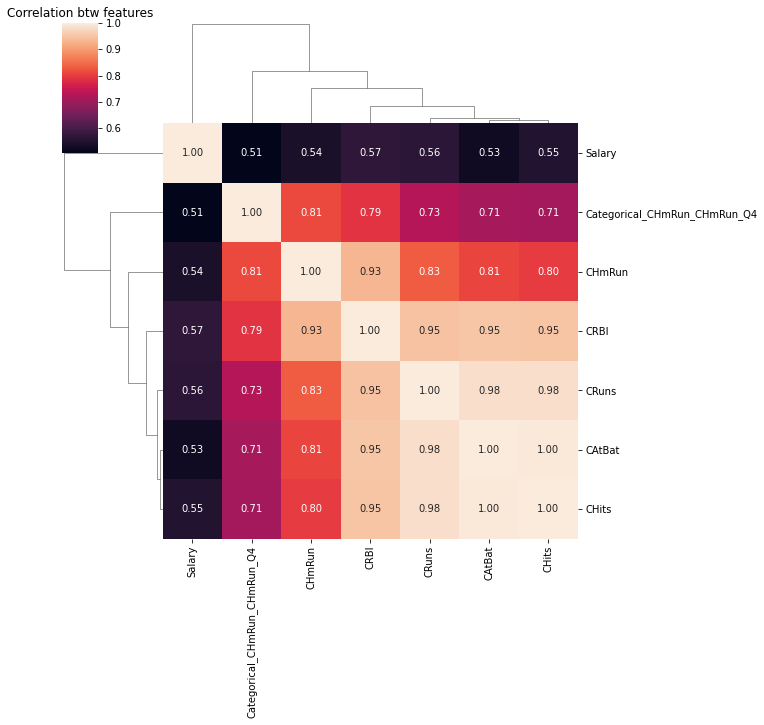

In [87]:
correlation_matrix = df.corr().round(2)
filtre=np.abs(correlation_matrix['Salary'])>0.50
corr_features=correlation_matrix.columns[filtre].tolist()
sns.clustermap(df[corr_features].corr(),annot=True,fmt=".2f")
plt.title('Correlation btw features')
plt.show()

I want to drop correlated columns which has more total correlation with other columns. Let's build an algorithm to do so.

In [88]:
X.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,-0.402,-0.314,-0.154,-0.709,-0.220,0.059,1.333,0.498,0.379,0.374,0.181,0.558,0.781,1,1,1.952,-0.011,0.300,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,0.271,0.386,0.692,0.354,0.610,1.147,-0.500,-0.101,-0.070,0.297,-0.066,0.109,0.346,0,1,3.139,0.201,0.700,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,0.341,0.543,0.846,0.329,0.756,0.000,0.833,1.213,1.258,2.387,1.474,1.845,0.699,1,0,-0.115,-0.185,-0.400,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,-0.378,-0.229,0.077,-0.329,-0.122,-0.206,-0.667,-0.504,-0.493,-0.361,-0.515,-0.558,-0.548,1,0,2.780,-0.027,-0.300,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,0.743,0.943,-0.385,0.557,0.098,-0.059,0.833,0.813,0.733,-0.271,0.640,0.322,0.078,0,1,0.278,2.043,1.800,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


In [89]:
cor_matrix = X.corr().abs()
cor_matrix

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
AtBat,1.000,0.964,0.555,0.900,0.796,0.624,0.013,0.207,0.229,0.218,0.238,0.221,0.133,0.153,0.056,0.310,0.342,0.326,0.090,0.234,0.270,0.725,0.210,0.266,0.695,0.253,0.089,0.485,0.208,0.277,0.643,0.179,0.221,0.602,0.092,0.238,0.423,0.165,0.049,0.029,0.015,0.240,0.070,0.011,0.237,0.099,0.066,0.031,0.218,0.029,0.222,0.101,0.019,0.184,0.111,0.109,0.125,0.094,0.224,0.291,0.192,0.009,0.086,0.297,0.023,0.043,0.270
Hits,0.964,1.000,0.531,0.911,0.788,0.587,0.019,0.207,0.239,0.196,0.240,0.219,0.123,0.154,0.083,0.300,0.304,0.280,0.095,0.251,0.216,0.733,0.260,0.213,0.759,0.207,0.104,0.449,0.230,0.242,0.670,0.200,0.209,0.612,0.069,0.236,0.382,0.176,0.057,0.022,0.011,0.279,0.070,0.020,0.277,0.103,0.085,0.052,0.199,0.014,0.263,0.096,0.031,0.209,0.110,0.107,0.151,0.087,0.219,0.268,0.192,0.013,0.079,0.264,0.011,0.025,0.242
HmRun,0.555,0.531,1.000,0.631,0.849,0.440,0.113,0.217,0.221,0.503,0.260,0.350,0.228,0.223,0.035,0.251,0.162,0.010,0.199,0.151,0.162,0.402,0.156,0.174,0.404,0.318,0.095,0.834,0.161,0.115,0.491,0.260,0.053,0.708,0.136,0.184,0.307,0.025,0.046,0.098,0.049,0.056,0.168,0.073,0.077,0.178,0.056,0.105,0.475,0.043,0.070,0.195,0.001,0.090,0.248,0.014,0.016,0.181,0.168,0.085,0.149,0.078,0.016,0.145,0.046,0.033,0.035
Runs,0.900,0.911,0.631,1.000,0.779,0.697,0.012,0.172,0.195,0.234,0.239,0.202,0.164,0.206,0.108,0.271,0.179,0.193,0.155,0.262,0.195,0.708,0.257,0.237,0.677,0.231,0.051,0.547,0.270,0.175,0.788,0.214,0.187,0.608,0.137,0.152,0.533,0.180,0.035,0.050,0.031,0.187,0.076,0.021,0.198,0.096,0.061,0.036,0.232,0.044,0.190,0.120,0.083,0.133,0.109,0.121,0.094,0.121,0.207,0.285,0.162,0.040,0.095,0.159,0.009,0.045,0.155
RBI,0.796,0.788,0.849,0.779,1.000,0.570,0.130,0.278,0.296,0.454,0.309,0.388,0.234,0.186,0.090,0.312,0.063,0.150,0.144,0.212,0.213,0.589,0.218,0.233,0.589,0.319,0.100,0.726,0.183,0.183,0.584,0.275,0.106,0.823,0.128,0.221,0.396,0.094,0.001,0.087,0.039,0.159,0.162,0.057,0.164,0.186,0.025,0.087,0.423,0.035,0.147,0.189,0.026,0.145,0.252,0.058,0.056,0.190,0.201,0.173,0.172,0.049,0.023,0.056,0.014,0.037,0.127
Walks,0.624,0.587,0.440,0.697,0.570,1.000,0.135,0.269,0.274,0.347,0.334,0.313,0.430,0.066,0.073,0.281,0.103,0.082,0.028,0.186,0.308,0.377,0.108,0.235,0.377,0.177,0.070,0.366,0.103,0.123,0.528,0.129,0.178,0.429,0.279,0.132,0.810,0.044,0.073,0.071,0.026,0.121,0.176,0.016,0.132,0.171,0.052,0.014,0.309,0.010,0.086,0.217,0.006,0.107,0.209,0.042,0.112,0.325,0.239,0.194,0.203,0.009,0.012,0.083,0.079,0.032,0.109
Years,0.013,0.019,0.113,0.012,0.130,0.135,1.000,0.916,0.900,0.729,0.877,0.864,0.838,0.033,0.020,0.020,0.085,0.157,0.

In [90]:
cor_matrix.where((np.triu(np.ones(cor_matrix.shape), k=1) + 
                   np.tril(np.ones(cor_matrix.shape), k=-1)).astype(bool))

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
AtBat,NaN,0.964,0.555,0.900,0.796,0.624,0.013,0.207,0.229,0.218,0.238,0.221,0.133,0.153,0.056,0.310,0.342,0.326,0.090,0.234,0.270,0.725,0.210,0.266,0.695,0.253,0.089,0.485,0.208,0.277,0.643,0.179,0.221,0.602,0.092,0.238,0.423,0.165,0.049,0.029,0.015,0.240,0.070,0.011,0.237,0.099,0.066,0.031,0.218,0.029,0.222,0.101,0.019,0.184,0.111,0.109,0.125,0.094,0.224,0.291,0.192,0.009,0.086,0.297,0.023,0.043,0.270
Hits,0.964,NaN,0.531,0.911,0.788,0.587,0.019,0.207,0.239,0.196,0.240,0.219,0.123,0.154,0.083,0.300,0.304,0.280,0.095,0.251,0.216,0.733,0.260,0.213,0.759,0.207,0.104,0.449,0.230,0.242,0.670,0.200,0.209,0.612,0.069,0.236,0.382,0.176,0.057,0.022,0.011,0.279,0.070,0.020,0.277,0.103,0.085,0.052,0.199,0.014,0.263,0.096,0.031,0.209,0.110,0.107,0.151,0.087,0.219,0.268,0.192,0.013,0.079,0.264,0.011,0.025,0.242
HmRun,0.555,0.531,NaN,0.631,0.849,0.440,0.113,0.217,0.221,0.503,0.260,0.350,0.228,0.223,0.035,0.251,0.162,0.010,0.199,0.151,0.162,0.402,0.156,0.174,0.404,0.318,0.095,0.834,0.161,0.115,0.491,0.260,0.053,0.708,0.136,0.184,0.307,0.025,0.046,0.098,0.049,0.056,0.168,0.073,0.077,0.178,0.056,0.105,0.475,0.043,0.070,0.195,0.001,0.090,0.248,0.014,0.016,0.181,0.168,0.085,0.149,0.078,0.016,0.145,0.046,0.033,0.035
Runs,0.900,0.911,0.631,NaN,0.779,0.697,0.012,0.172,0.195,0.234,0.239,0.202,0.164,0.206,0.108,0.271,0.179,0.193,0.155,0.262,0.195,0.708,0.257,0.237,0.677,0.231,0.051,0.547,0.270,0.175,0.788,0.214,0.187,0.608,0.137,0.152,0.533,0.180,0.035,0.050,0.031,0.187,0.076,0.021,0.198,0.096,0.061,0.036,0.232,0.044,0.190,0.120,0.083,0.133,0.109,0.121,0.094,0.121,0.207,0.285,0.162,0.040,0.095,0.159,0.009,0.045,0.155
RBI,0.796,0.788,0.849,0.779,NaN,0.570,0.130,0.278,0.296,0.454,0.309,0.388,0.234,0.186,0.090,0.312,0.063,0.150,0.144,0.212,0.213,0.589,0.218,0.233,0.589,0.319,0.100,0.726,0.183,0.183,0.584,0.275,0.106,0.823,0.128,0.221,0.396,0.094,0.001,0.087,0.039,0.159,0.162,0.057,0.164,0.186,0.025,0.087,0.423,0.035,0.147,0.189,0.026,0.145,0.252,0.058,0.056,0.190,0.201,0.173,0.172,0.049,0.023,0.056,0.014,0.037,0.127
Walks,0.624,0.587,0.440,0.697,0.570,NaN,0.135,0.269,0.274,0.347,0.334,0.313,0.430,0.066,0.073,0.281,0.103,0.082,0.028,0.186,0.308,0.377,0.108,0.235,0.377,0.177,0.070,0.366,0.103,0.123,0.528,0.129,0.178,0.429,0.279,0.132,0.810,0.044,0.073,0.071,0.026,0.121,0.176,0.016,0.132,0.171,0.052,0.014,0.309,0.010,0.086,0.217,0.006,0.107,0.209,0.042,0.112,0.325,0.239,0.194,0.203,0.009,0.012,0.083,0.079,0.032,0.109
Years,0.013,0.019,0.113,0.012,0.130,0.135,NaN,0.916,0.900,0.729,0.877,0.864,0.838,0.033,0.020,0.020,0.085,0.157,0.024,0.023,0.06

I am finding total correlation for all columns

In [91]:
cor_matrix.iloc[:,0:1].sum()

AtBat   17.144
dtype: float64

In [92]:
cor_matrix["corr_sum"] = 0.0

In [93]:
cor_matrix["corr_sum"][0] = cor_matrix.iloc[:,0:1].sum()
cor_matrix["corr_sum"].head()

AtBat   17.144
Hits     0.000
HmRun    0.000
Runs     0.000
RBI      0.000
Name: corr_sum, dtype: float64

In [94]:
for col in range(cor_matrix.shape[1]-1):
    cor_matrix["corr_sum"][col] = cor_matrix.iloc[:,col:col+1].sum()
cor_matrix["corr_sum"]

AtBat                            17.144
Hits                             17.014
HmRun                            14.912
Runs                             16.854
RBI                              17.343
Walks                            14.845
Years                            15.960
CAtBat                           18.050
CHits                            18.249
CHmRun                           18.955
CRuns                            18.619
CRBI                             19.107
CWalks                           17.656
League                            6.521
Division                          4.246
PutOuts                           9.130
Assists                           9.387
Errors                            9.465
NewLeague                         5.888
Categorical_AtBat_AtBat_Q2        9.390
Categorical_AtBat_AtBat_Q3        8.525
Categorical_AtBat_AtBat_Q4       14.218
Categorical_Hits_Hits_Q2          9.188
Categorical_Hits_Hits_Q3          7.556
Categorical_Hits_Hits_Q4         14.764


Note that Correlation matrix will be mirror image about the diagonal and all the diagonal elements will be 1. So, It does not matter that we select the upper triangular or lower triangular part of the correlation matrix but we should not include the diagonal elements. 

In [95]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
upper_tri

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4,corr_sum
AtBat,NaN,0.964,0.555,0.900,0.796,0.624,0.013,0.207,0.229,0.218,0.238,0.221,0.133,0.153,0.056,0.310,0.342,0.326,0.090,0.234,0.270,0.725,0.210,0.266,0.695,0.253,0.089,0.485,0.208,0.277,0.643,0.179,0.221,0.602,0.092,0.238,0.423,0.165,0.049,0.029,0.015,0.240,0.070,0.011,0.237,0.099,0.066,0.031,0.218,0.029,0.222,0.101,0.019,0.184,0.111,0.109,0.125,0.094,0.224,0.291,0.192,0.009,0.086,0.297,0.023,0.043,0.270,17.144
Hits,NaN,NaN,0.531,0.911,0.788,0.587,0.019,0.207,0.239,0.196,0.240,0.219,0.123,0.154,0.083,0.300,0.304,0.280,0.095,0.251,0.216,0.733,0.260,0.213,0.759,0.207,0.104,0.449,0.230,0.242,0.670,0.200,0.209,0.612,0.069,0.236,0.382,0.176,0.057,0.022,0.011,0.279,0.070,0.020,0.277,0.103,0.085,0.052,0.199,0.014,0.263,0.096,0.031,0.209,0.110,0.107,0.151,0.087,0.219,0.268,0.192,0.013,0.079,0.264,0.011,0.025,0.242,17.014
HmRun,NaN,NaN,NaN,0.631,0.849,0.440,0.113,0.217,0.221,0.503,0.260,0.350,0.228,0.223,0.035,0.251,0.162,0.010,0.199,0.151,0.162,0.402,0.156,0.174,0.404,0.318,0.095,0.834,0.161,0.115,0.491,0.260,0.053,0.708,0.136,0.184,0.307,0.025,0.046,0.098,0.049,0.056,0.168,0.073,0.077,0.178,0.056,0.105,0.475,0.043,0.070,0.195,0.001,0.090,0.248,0.014,0.016,0.181,0.168,0.085,0.149,0.078,0.016,0.145,0.046,0.033,0.035,14.912
Runs,NaN,NaN,NaN,NaN,0.779,0.697,0.012,0.172,0.195,0.234,0.239,0.202,0.164,0.206,0.108,0.271,0.179,0.193,0.155,0.262,0.195,0.708,0.257,0.237,0.677,0.231,0.051,0.547,0.270,0.175,0.788,0.214,0.187,0.608,0.137,0.152,0.533,0.180,0.035,0.050,0.031,0.187,0.076,0.021,0.198,0.096,0.061,0.036,0.232,0.044,0.190,0.120,0.083,0.133,0.109,0.121,0.094,0.121,0.207,0.285,0.162,0.040,0.095,0.159,0.009,0.045,0.155,16.854
RBI,NaN,NaN,NaN,NaN,NaN,0.570,0.130,0.278,0.296,0.454,0.309,0.388,0.234,0.186,0.090,0.312,0.063,0.150,0.144,0.212,0.213,0.589,0.218,0.233,0.589,0.319,0.100,0.726,0.183,0.183,0.584,0.275,0.106,0.823,0.128,0.221,0.396,0.094,0.001,0.087,0.039,0.159,0.162,0.057,0.164,0.186,0.025,0.087,0.423,0.035,0.147,0.189,0.026,0.145,0.252,0.058,0.056,0.190,0.201,0.173,0.172,0.049,0.023,0.056,0.014,0.037,0.127,17.343
Walks,NaN,NaN,NaN,NaN,NaN,NaN,0.135,0.269,0.274,0.347,0.334,0.313,0.430,0.066,0.073,0.281,0.103,0.082,0.028,0.186,0.308,0.377,0.108,0.235,0.377,0.177,0.070,0.366,0.103,0.123,0.528,0.129,0.178,0.429,0.279,0.132,0.810,0.044,0.073,0.071,0.026,0.121,0.176,0.016,0.132,0.171,0.052,0.014,0.309,0.010,0.086,0.217,0.006,0.107,0.209,0.042,0.112,0.325,0.239,0.194,0.203,0.009,0.012,0.083,0.079,0.032,0.109,14.845
Years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.916,0.900,0.729,0.877,0.864,0.838,0.033,0.020,0.020,0.085,0.157,0.024,0

I will drop columns that have correlated more than 0.9

In [96]:
to_drop_list = []
for k in range(upper_tri.shape[1]-1):
    for i in range(upper_tri.shape[1]-1):
            if (upper_tri.iloc[k][i] > 0.9) == True:
                if upper_tri.iloc[k][upper_tri.shape[1]-1] > upper_tri.iloc[i][upper_tri.shape[1]-1]:
                    to_drop_list.append(upper_tri.index[i])
                else:
                    to_drop_list.append(upper_tri.index[k])
                print(upper_tri.iloc[k][i],k,i)

0.9639691287146582 0 1
0.9106301424729449 1 3
0.9156806924052664 6 7
0.9954657028440651 7 8
0.9829041060118627 7 10
0.9507301414199294 7 11
0.9066192848450888 7 12
0.984246501653966 8 10
0.9498543679181124 8 11
0.9318571425885502 9 11
0.9467139472571454 10 11
0.9276601897216916 10 12
0.9595446854330106 40 43
0.9386946386946387 41 44
0.9595446854330106 42 45
0.9393170281495161 42 51
0.9190893708660203 45 51


In [97]:
to_drop_list = np.unique(to_drop_list)
to_drop_list

array(['AtBat', 'CAtBat', 'CHits', 'CHmRun', 'CRuns',
       'Categorical_CAtBat_CAtBat_Q2', 'Categorical_CAtBat_CAtBat_Q3',
       'Categorical_CAtBat_CAtBat_Q4', 'Categorical_CHits_CHits_Q4',
       'Hits', 'Years'], dtype='<U28')

In [98]:
df.drop(to_drop_list, axis=1) # dropping correlated columns

,HmRun,Runs,RBI,Walks,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
1,-0.154,-0.709,-0.220,0.059,0.558,0.781,1,1,1.952,-0.011,0.300,475.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0
2,0.692,0.354,0.610,1.147,0.109,0.346,0,1,3.139,0.201,0.700,480.000,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
3,0.846,0.329,0.756,0.000,1.845,0.699,1,0,-0.115,-0.185,-0.400,500.000,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
4,0.077,-0.329,-0.122,-0.206,-0.558,-0.548,1,0,2.780,-0.027,-0.300,91.500,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
5,-0.385,0.557,0.098,-0.059,0.322,0.078,0,1,0.278,2.043,1.800,750.000,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1
6,-0.615,-0.734,-0.951,-0.471,-0.671,-0.583,1,0,-0.708,0.446,0.000,70.000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
7,-0.692,-0.709,-0.561,-0.882,-0.586,-0.629,0,1,-0.493,1.293,0.200,100.000,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0
8,-0.231,-0.658,-0.366,-0.853,-0.595,-0.645,1,1,-0.388,1.332,1.200,75.000,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1
9,0.615,-0.076,0.463,0.824,2.003,2.687,0,0,-1.072,-0.245,-0.700,1100.000,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
10,0.923,1.392,0.683,0.647,0.832,1.219,0,0,0.067,2.174,1.500,517.143,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1


In [99]:
df1 = df.drop(to_drop_list, axis=1)

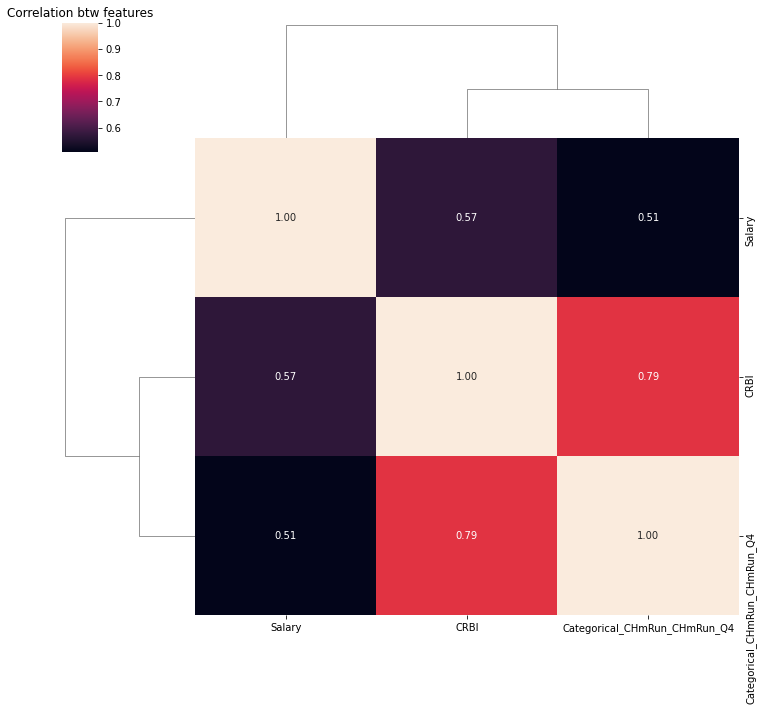

In [100]:
#Let's check again
correlation_matrix = df1.corr().round(2)
filtr=np.abs(correlation_matrix['Salary'])>0.50
corr_features=correlation_matrix.columns[filtr].tolist()
sns.clustermap(df[corr_features].corr(),annot=True,fmt=".2f")
plt.title('Correlation btw features')
plt.show()

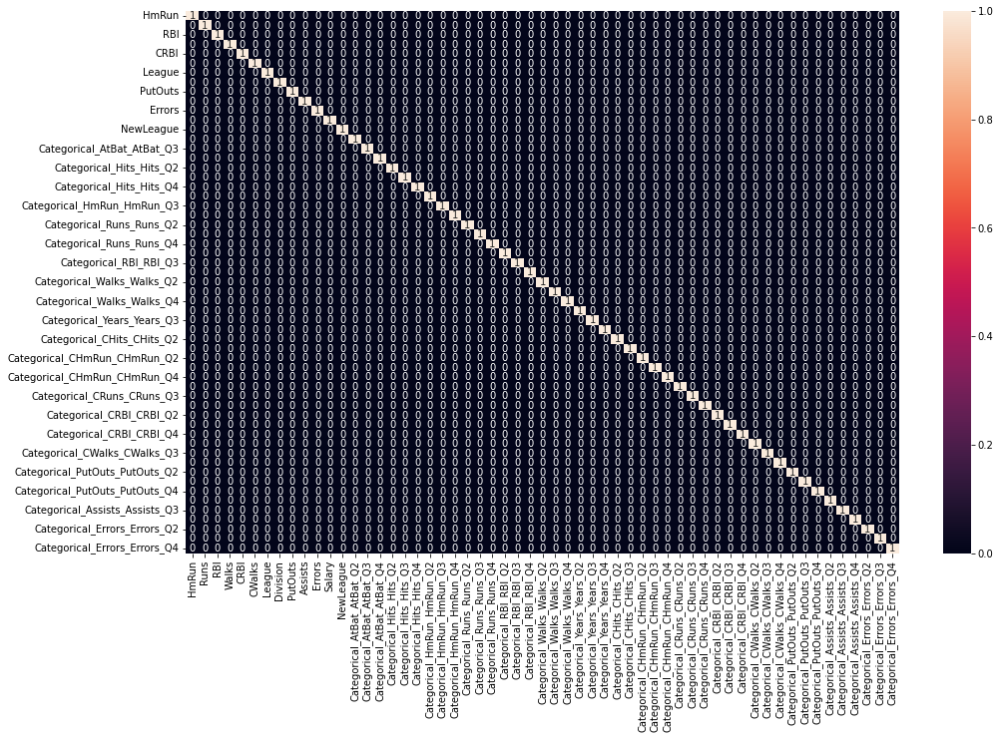

In [101]:
plt.figure(figsize=(16,10))
sns.heatmap(df1.corr()> 0.9,annot=True); # cristal clear :)

###### Lets build our best model with df1

In [102]:
y = df1['Salary']
X = df1.drop('Salary', axis =1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, random_state=41)

In [106]:
rf_params = {"max_depth": [5,8,10,None],
            "max_features": [2,5,10,15,17],
            "n_estimators": [100,200, 500, 1000],
            "min_samples_split": [2,5,10,20,30]}
rf = RandomForestRegressor()
rf_model2 = rf.fit(X_train, y_train)
#y_pred2 = rf_model2.predict(X_test)
rf_cv_model2 = GridSearchCV(rf_model2, rf_params, cv = 10, n_jobs = -1, verbose = 2).fit(X_train, y_train)
rf_tuned2 = RandomForestRegressor(**rf_cv_model2.best_params_,random_state=41).fit(X_train, y_train)
y_pred2 = rf_tuned2.predict(X_test)
df_rf_tuned_rmse2 = np.sqrt(mean_squared_error(y_test, y_pred))
df_rf_tuned_rmse2

Fitting 10 folds for each of 400 candidates, totalling 4000 fits


287.55107340213516

In [107]:
df_rf_tuned_rmse # first model rmse

275.12683083133663

RF TUNED	275.12683083133663<br>
RF TUNED2	287.55107340213516 

First model (without dropping high correlated columns) was better. So I will use it for prediction.

# PREDICTION

In [108]:
df_salary.head() # This dataframe was NaN Salary rows

,index,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,15,183,39,3,20,15,11,3,201,42,3,20,16,11,A,W,118,0,0,NaN,A
2,18,407,104,6,57,43,65,12,5233,1478,100,643,658,653,A,W,912,88,9,NaN,A
3,22,22,10,1,4,2,1,6,84,26,2,9,9,3,A,W,812,84,11,NaN,A
4,30,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,A,W,127,221,7,NaN,A


I will do all feature engineering steps before use my model

In [109]:
lbe=LabelEncoder()
df_salary['League']=lbe.fit_transform(df_salary['League'])
df_salary['Division']=lbe.fit_transform(df_salary['Division'])
df_salary['NewLeague']=lbe.fit_transform(df_salary['NewLeague'])
df_salary.head()

,index,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,0,293,66,1,30,29,14,1,293,66,1,30,29,14,0,0,446,33,20,NaN,0
1,15,183,39,3,20,15,11,3,201,42,3,20,16,11,0,1,118,0,0,NaN,0
2,18,407,104,6,57,43,65,12,5233,1478,100,643,658,653,0,1,912,88,9,NaN,0
3,22,22,10,1,4,2,1,6,84,26,2,9,9,3,0,1,812,84,11,NaN,0
4,30,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,0,1,127,221,7,NaN,0


In [110]:
df_salary = df_salary.drop("index", axis = 1)
df_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,0,0,446,33,20,NaN,0
1,183,39,3,20,15,11,3,201,42,3,20,16,11,0,1,118,0,0,NaN,0
2,407,104,6,57,43,65,12,5233,1478,100,643,658,653,0,1,912,88,9,NaN,0
3,22,10,1,4,2,1,6,84,26,2,9,9,3,0,1,812,84,11,NaN,0
4,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,0,1,127,221,7,NaN,0


In [111]:
cat_cols, num_cols, cat_but_car = grab_col_names(df_salary) 

Observations: 59
Variables: 20
cat_cols: 4
num_cols: 16
cat_but_car: 0
num_but_cat: 4


In [112]:
df_x = df_salary[num_cols]
df_x.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors
0,293,66,1,30,29,14,1,293,66,1,30,29,14,446,33,20
1,183,39,3,20,15,11,3,201,42,3,20,16,11,118,0,0
2,407,104,6,57,43,65,12,5233,1478,100,643,658,653,912,88,9
3,22,10,1,4,2,1,6,84,26,2,9,9,3,812,84,11
4,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,127,221,7


In [113]:
for col in df_x.columns:
    new_col = "Categorical_" + col
    df_salary[new_col] = pd.qcut(df_salary[col].rank(method="first"),4, labels =
                          [col+"_Q1",col+"_Q2",col+"_Q3",col+"_Q4"])
    print(df_salary.groupby(new_col).agg({col:"mean"}),end='\n\n') 

                    AtBat
Categorical_AtBat        
AtBat_Q1          124.667
AtBat_Q2          221.067
AtBat_Q3          305.143
AtBat_Q4          469.533

                    Hits
Categorical_Hits        
Hits_Q1           27.600
Hits_Q2           54.467
Hits_Q3           75.714
Hits_Q4          125.333

                   HmRun
Categorical_HmRun       
HmRun_Q1           0.467
HmRun_Q2           3.333
HmRun_Q3           7.000
HmRun_Q4          17.133

                   Runs
Categorical_Runs       
Runs_Q1          12.000
Runs_Q2          24.467
Runs_Q3          36.357
Runs_Q4          62.600

                   RBI
Categorical_RBI       
RBI_Q1          10.600
RBI_Q2          23.200
RBI_Q3          34.714
RBI_Q4          62.067

                   Walks
Categorical_Walks       
Walks_Q1           9.667
Walks_Q2          20.400
Walks_Q3          30.214
Walks_Q4          52.533

                   Years
Categorical_Years       
Years_Q1           2.133
Years_Q2           4.933
Years_

In [114]:
df_salary.shape

(59, 36)

In [115]:
df_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat,Categorical_Hits,Categorical_HmRun,Categorical_Runs,Categorical_RBI,Categorical_Walks,Categorical_Years,Categorical_CAtBat,Categorical_CHits,Categorical_CHmRun,Categorical_CRuns,Categorical_CRBI,Categorical_CWalks,Categorical_PutOuts,Categorical_Assists,Categorical_Errors
0,293,66,1,30,29,14,1,293,66,1,30,29,14,0,0,446,33,20,NaN,0,AtBat_Q3,Hits_Q3,HmRun_Q1,Runs_Q2,RBI_Q2,Walks_Q1,Years_Q1,CAtBat_Q1,CHits_Q1,CHmRun_Q1,CRuns_Q1,CRBI_Q1,CWalks_Q1,PutOuts_Q4,Assists_Q3,Errors_Q4
1,183,39,3,20,15,11,3,201,42,3,20,16,11,0,1,118,0,0,NaN,0,AtBat_Q1,Hits_Q1,HmRun_Q2,Runs_Q1,RBI_Q1,Walks_Q1,Years_Q1,CAtBat_Q1,CHits_Q1,CHmRun_Q1,CRuns_Q1,CRBI_Q1,CWalks_Q1,PutOuts_Q2,Assists_Q1,Errors_Q1
2,407,104,6,57,43,65,12,5233,1478,100,643,658,653,0,1,912,88,9,NaN,0,AtBat_Q4,Hits_Q4,HmRun_Q3,Runs_Q4,RBI_Q4,Walks_Q4,Years_Q3,CAtBat_Q4,CHits_Q4,CHmRun_Q4,CRuns_Q4,CRBI_Q4,CWalks_Q4,PutOuts_Q4,Assists_Q4,Errors_Q4
3,22,10,1,4,2,1,6,84,26,2,9,9,3,0,1,812,84,11,NaN,0,AtBat_Q1,Hits_Q1,HmRun_Q1,Runs_Q1,RBI_Q1,Walks_Q1,Years_Q2,CAtBat_Q1,CHits_Q1,CHmRun_Q1,CRuns_Q1,CRBI_Q1,CWalks_Q1,PutOuts_Q4,Assists_Q3,Errors_Q4
4,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,0,1,127,221,7,NaN,0,AtBat_Q3,Hits_Q3,HmRun_Q3,Runs_Q3,RBI_Q3,Walks_Q4,Years_Q4,CAtBat_Q4,CHits_Q4,CHmRun_Q4,CRuns_Q4,CRBI_Q4,CWalks_Q4,PutOuts_Q2,Assists_Q4,Errors_Q3


##### One-Hot Encoding:

In [116]:
cat_cols, num_cols, cat_but_car = grab_col_names(df_salary) 

Observations: 59
Variables: 36
cat_cols: 20
num_cols: 16
cat_but_car: 0
num_but_cat: 20


In [117]:
onehot_cols= cat_cols[4:]
onehot_cols

['Categorical_AtBat',
 'Categorical_Hits',
 'Categorical_HmRun',
 'Categorical_Runs',
 'Categorical_RBI',
 'Categorical_Walks',
 'Categorical_Years',
 'Categorical_CAtBat',
 'Categorical_CHits',
 'Categorical_CHmRun',
 'Categorical_CRuns',
 'Categorical_CRBI',
 'Categorical_CWalks',
 'Categorical_PutOuts',
 'Categorical_Assists',
 'Categorical_Errors']

In [118]:
# one-hot encoding function:
def one_hot_encoder(dataframe, onehot_cols, drop_first=True):
    dataframe = pd.get_dummies(dataframe, columns=onehot_cols, drop_first=drop_first)
    return dataframe

In [119]:
df_salary = one_hot_encoder(df_salary, onehot_cols)
df_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
0,293,66,1,30,29,14,1,293,66,1,30,29,14,0,0,446,33,20,NaN,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
1,183,39,3,20,15,11,3,201,42,3,20,16,11,0,1,118,0,0,NaN,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,407,104,6,57,43,65,12,5233,1478,100,643,658,653,0,1,912,88,9,NaN,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1
3,22,10,1,4,2,1,6,84,26,2,9,9,3,0,1,812,84,11,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
4,313,84,9,42,30,39,17,6890,1833,224,1033,864,1087,0,1,127,221,7,NaN,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0


now scaling:

In [120]:
for col in num_cols:
    df_salary[col] = RobustScaler().fit_transform(df_salary[[col]])

In [121]:
df_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
0,0.284,0.103,-0.533,0.000,0.000,-0.512,-0.750,-0.307,-0.332,-0.474,-0.255,-0.404,-0.365,0,0,1.006,0.125,2.500,NaN,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
1,-0.426,-0.454,-0.267,-0.408,-0.583,-0.651,-0.500,-0.332,-0.359,-0.439,-0.274,-0.438,-0.373,0,1,-0.363,-0.287,-0.833,NaN,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,1.019,0.887,0.133,1.102,0.583,1.860,0.625,1.054,1.256,1.263,0.887,1.225,1.350,0,1,2.952,0.812,0.667,NaN,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1
3,-1.465,-1.052,-0.533,-1.061,-1.125,-1.116,-0.125,-0.365,-0.377,-0.456,-0.295,-0.456,-0.395,0,1,2.534,0.762,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
4,0.413,0.474,0.533,0.490,0.042,0.651,1.250,1.511,1.656,3.439,1.614,1.759,2.515,0,1,-0.326,2.475,0.333,NaN,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0


In [122]:
X_salary = df_salary.drop('Salary', axis =1)
X_salary.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,NewLeague,Categorical_AtBat_AtBat_Q2,Categorical_AtBat_AtBat_Q3,Categorical_AtBat_AtBat_Q4,Categorical_Hits_Hits_Q2,Categorical_Hits_Hits_Q3,Categorical_Hits_Hits_Q4,Categorical_HmRun_HmRun_Q2,Categorical_HmRun_HmRun_Q3,Categorical_HmRun_HmRun_Q4,Categorical_Runs_Runs_Q2,Categorical_Runs_Runs_Q3,Categorical_Runs_Runs_Q4,Categorical_RBI_RBI_Q2,Categorical_RBI_RBI_Q3,Categorical_RBI_RBI_Q4,Categorical_Walks_Walks_Q2,Categorical_Walks_Walks_Q3,Categorical_Walks_Walks_Q4,Categorical_Years_Years_Q2,Categorical_Years_Years_Q3,Categorical_Years_Years_Q4,Categorical_CAtBat_CAtBat_Q2,Categorical_CAtBat_CAtBat_Q3,Categorical_CAtBat_CAtBat_Q4,Categorical_CHits_CHits_Q2,Categorical_CHits_CHits_Q3,Categorical_CHits_CHits_Q4,Categorical_CHmRun_CHmRun_Q2,Categorical_CHmRun_CHmRun_Q3,Categorical_CHmRun_CHmRun_Q4,Categorical_CRuns_CRuns_Q2,Categorical_CRuns_CRuns_Q3,Categorical_CRuns_CRuns_Q4,Categorical_CRBI_CRBI_Q2,Categorical_CRBI_CRBI_Q3,Categorical_CRBI_CRBI_Q4,Categorical_CWalks_CWalks_Q2,Categorical_CWalks_CWalks_Q3,Categorical_CWalks_CWalks_Q4,Categorical_PutOuts_PutOuts_Q2,Categorical_PutOuts_PutOuts_Q3,Categorical_PutOuts_PutOuts_Q4,Categorical_Assists_Assists_Q2,Categorical_Assists_Assists_Q3,Categorical_Assists_Assists_Q4,Categorical_Errors_Errors_Q2,Categorical_Errors_Errors_Q3,Categorical_Errors_Errors_Q4
0,0.284,0.103,-0.533,0.000,0.000,-0.512,-0.750,-0.307,-0.332,-0.474,-0.255,-0.404,-0.365,0,0,1.006,0.125,2.500,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
1,-0.426,-0.454,-0.267,-0.408,-0.583,-0.651,-0.500,-0.332,-0.359,-0.439,-0.274,-0.438,-0.373,0,1,-0.363,-0.287,-0.833,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,1.019,0.887,0.133,1.102,0.583,1.860,0.625,1.054,1.256,1.263,0.887,1.225,1.350,0,1,2.952,0.812,0.667,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1
3,-1.465,-1.052,-0.533,-1.061,-1.125,-1.116,-0.125,-0.365,-0.377,-0.456,-0.295,-0.456,-0.395,0,1,2.534,0.762,1.000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
4,0.413,0.474,0.533,0.490,0.042,0.651,1.250,1.511,1.656,3.439,1.614,1.759,2.515,0,1,-0.326,2.475,0.333,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0


In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 263 entries, 1 to 321
Data columns (total 68 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   AtBat                           263 non-null    float64
 1   Hits                            263 non-null    float64
 2   HmRun                           263 non-null    float64
 3   Runs                            263 non-null    float64
 4   RBI                             263 non-null    float64
 5   Walks                           263 non-null    float64
 6   Years                           263 non-null    float64
 7   CAtBat                          263 non-null    float64
 8   CHits                           263 non-null    float64
 9   CHmRun                          263 non-null    float64
 10  CRuns                           263 non-null    float64
 11  CRBI                            263 non-null    float64
 12  CWalks                          263 

##### Predicted salaries:

In [124]:
y_salary_pred = rf_tuned.predict(X_salary)
y_salary_pred

array([ 192.24064762,  202.80483613, 1329.11426255,  553.39580258,
       1011.82571898, 1565.77921349,  463.59100336,  969.1429521 ,
        197.06080502,  571.14294169,  464.60973793,  678.9971959 ,
       1375.81607159,  612.03689837,  584.524228  ,  617.95837078,
        310.35907945,  911.7393285 ,  210.58321863,  520.59647673,
       1338.58505916,  445.24736421,  576.05126713,  683.22470143,
        516.50236566, 1018.78525414, 1577.95063514,  379.8074853 ,
        267.91572151,  824.28474617,  987.85359923,  551.96139605,
        650.73922826,  478.67394404,  408.49819181,  721.43021955,
        424.20511461,  310.61960272,  211.95433749,  327.21171464,
        214.87991473, 1037.90203495,  377.95796085,  420.82971277,
        668.64127158,  622.56394778,  727.5740734 , 1475.57144208,
       1099.89896041,  261.38889504,  201.28871662,  686.73554227,
        200.70769402,  649.71490019, 1027.23214109,  383.31025253,
        746.88984392, 1291.04619187,  463.16448238])

In [126]:
X_salary["Salary_Pred"] = y_salary_pred.copy()
X_salary["Salary_Pred"]

0     192.241
1     202.805
2    1329.114
3     553.396
4    1011.826
5    1565.779
6     463.591
7     969.143
8     197.061
9     571.143
10    464.610
11    678.997
12   1375.816
13    612.037
14    584.524
15    617.958
16    310.359
17    911.739
18    210.583
19    520.596
20   1338.585
21    445.247
22    576.051
23    683.225
24    516.502
25   1018.785
26   1577.951
27    379.807
28    267.916
29    824.285
30    987.854
31    551.961
32    650.739
33    478.674
34    408.498
35    721.430
36    424.205
37    310.620
38    211.954
39    327.212
40    214.880
41   1037.902
42    377.958
43    420.830
44    668.641
45    622.564
46    727.574
47   1475.571
48   1099.899
49    261.389
50    201.289
51    686.736
52    200.708
53    649.715
54   1027.232
55    383.310
56    746.890
57   1291.046
58    463.164
Name: Salary_Pred, dtype: float64

Hope it will be useful :)

[Linkedin](https://www.linkedin.com/in/demir-zumrut/)